# Exercise 3: Shape Reconstruction

**Submission Deadline**: 09.06.2021, 23:55

We will take a look at two major approaches for 3D shape reconstruction in this last exercise.

Like in exercise 2, you can run all trainings either locally or on Google Colab. Just follow the instructions below. 

Note that training reconstruction methods generally takes relatively long, even for simple shape completion. Training the generalization will take a few hours. *Thus, please make sure to start training well before the submission deadline.*

## 3.0. Running this notebook
We recommend running this notebook on a cuda compatible local gpu. You can also run training on cpu, it will just take longer.

We describe two options for executing the training parts of this exercise below: Using Google Colab or running it locally on your machine. If you are not planning on using Colab, just skip forward to Local Execution.

### Google Colab

If you don't have access to gpu and don't wish to train on CPU, you can use Google Colab. However, we experienced the issue that inline visualization of shapes or inline images didn't work on colab, so just keep that in mind.
What you can also do is only train networks on colab, download the checkpoint, and visualize inference locally.

In case you're using Google Colab, you can upload the exercise folder (containing `exercise_3.ipynb`, directory `exercise_3` and the file `requirements.txt`) as `3d-machine-learning` to google drive (make sure you don't upload extracted datasets files).
Additionally you'd need to open the notebook `exercise_3.ipynb` in Colab using `File > Open Notebook > Upload`.

Next you'll need to run these two cells for setting up the environment. Before you do that make sure your instance has a GPU.

In [1]:
import os
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# We assume you uploaded the exercise folder in root Google Drive folder

!cp -r /content/drive/MyDrive/3d-machine-learning 3d-machine-learning/
os.chdir('/content/3d-machine-learning/')
print('Installing requirements')
!pip install -r requirements.txt

# Make sure you restart runtime when directed by Colab

"\nimport os\nfrom google.colab import drive\ndrive.mount('/content/drive', force_remount=True)\n\n# We assume you uploaded the exercise folder in root Google Drive folder\n\n!cp -r /content/drive/MyDrive/3d-machine-learning 3d-machine-learning/\nos.chdir('/content/3d-machine-learning/')\nprint('Installing requirements')\n!pip install -r requirements.txt\n"

Run this cell after restarting your colab runtime

In [2]:
import os
import sys
import torch
os.chdir('/content/3d-machine-learning/')
sys.path.insert(1, "/content/3d-machine-learning/")
print('CUDA availability:', torch.cuda.is_available())

'\nimport os\nimport sys\nimport torch\nos.chdir(\'/content/3d-machine-learning/\')\nsys.path.insert(1, "/content/3d-machine-learning/")\nprint(\'CUDA availability:\', torch.cuda.is_available())\n'

### Local Execution

If you run this notebook locally, you have to first install the python dependiencies again. They are the same as for exercise 1 so you can re-use the environment you used last time. If you use [poetry](https://python-poetry.org), you can also simply re-install everything (`poetry install`) and then run this notebook via `poetry run jupyter notebook`.

### Imports

The following imports should work regardless of whether you are using Colab or local execution.

In [1]:
%load_ext autoreload
%autoreload 2
from pathlib import Path
import numpy as np
import matplotlib as plt
import k3d
import trimesh
import torch
import skimage

Use the next cell to test whether a GPU was detected by pytorch.

In [2]:
torch.cuda.is_available()

False

## 3.1 Shape Reconstruction from 3D SDF grids with 3D-EPN

In the first part of this exercise, we will take a look at shape complation using [3D-EPN](https://arxiv.org/abs/1612.00101). This approach was also introduced in the lecture.

The visualization below shows an overview of the method: From an incomplete shape observation (which you would get when scanning an object with a depth sensor for example), we use a 3D encoder-predictor network that first encodes the incomplete shapes into a common latent space using several 3D convolution layers and then decodes them again using multiple 3D transpose convolutions.

This way, we get from a 32^3 SDF voxel grid to a 32^3 DF (unsigned) voxel grid that represents the completed shape. We only focus on this part here; in the original implementation, this 32^3 completed prediction would then be further improved (in an offline step after inference) by sampling parts from a shape database to get the final resolution to 128^3.

<img src="exercise_3/images/3depn_teaser.png" alt="3D-EPN Teaser" style="width: 800px;"/>

The next steps will follow the structure we established in exercise 2: Taking a look at the dataset structure and downloading the data; then, implementing dataset, model, and training loop.

### (a) Downloading the data
We will use the original dataset used in the official implementation. It consists of SDF and DF grids (representing incomplete input data and complete target data) with a resolution of 32^3 each. Each input-target pair is generated from a ShapeNet shape.

The incomplete SDF data are generated by sampling virtual camera trajectories around every object. Each trajectory is assigned an ID which is part of the file names (see below). The camera views for each trajectory are combined into a common SDF grid by volumetric fusion. It is easy to generate an SDF here since we know both camera location and object surface: Everything between camera and surface is known free space and outside the object, leading to a positive SDF sign. Everything behind the surface has a negative sign. For the complete shapes, however, deciding whether a voxel in the DF grid is inside or outside an object is not a trivial problem. This is why we use unsigned distance fields as target and prediction representation instead. This still encodes the distance to the closest surface but does not contain explicit information about the inside/outside location.

In terms of dataset layout, we follow the ShapeNet directory structure as seen in the last exercise:
Each folder in the `exercise_3/data/shapenet_dim32_sdf` and `exercise_3/data/shapenet_dim32_df` directories contains one shape category represented by a number, e.g. `02691156`.
We provide the mapping between these numbers and the corresponding names in `exercise_3/data/shape_info.json`. Each of these shape category folders contains lots of shapes in sdf or df format. In addition to that, every shape now also contains multiple trajectories: 0 to 7, encoded as `__0__` to `__7__`. These 8 files are just different input representations, meaning they vary in the level of completeness and location of missing parts; they all map to the `.df` file with corresponding shape ID and `__0__` at the end.

```
# contents of exercise_2/data/shapenet_dim32_sdf
02691156/                                           # Shape category folder with all its shapes
    ├── 10155655850468db78d106ce0a280f87__0__.sdf   # Trajectory 0 for a shape of the category
    ├── 10155655850468db78d106ce0a280f87__1__.sdf   # Trajectory 1 for the same shape
    ├── :                                      
    ├── 10155655850468db78d106ce0a280f87__7__.sdf   # Trajectory 7 for the same shape
    ├── 1021a0914a7207aff927ed529ad90a11__0__.sdf   # Trajectory 0 for another shape
    ├── :                                           # And so on ...
02933112/                                           # Another shape category folder
02958343/                                           # In total you should have 8 shape category folders
:

# contents of exercise_2/data/shapenet_dim32_df
02691156/                                           # Shape category folder with all its shapes
    ├── 10155655850468db78d106ce0a280f87__0__.df    # A single shape of the category
    ├── 1021a0914a7207aff927ed529ad90a11__0__.df    # Another shape of the category
    ├── :                                           # And so on ...
02933112/                                           # Another shape category folder
02958343/                                           # In total you should have 55 shape category folders
:
```

Download and extract the data with the code cell below.

In [3]:
print('Downloading ...')
# File sizes: 11GB for shapenet_dim32_sdf.zip (incomplete scans), 4GB for shapenet_dim32_df.zip (target shapes)
!wget http://kaldir.vc.in.tum.de/adai/CNNComplete/shapenet_dim32_sdf.zip -P exercise_3/data
!wget http://kaldir.vc.in.tum.de/adai/CNNComplete/shapenet_dim32_df.zip -P exercise_3/data
print('Extracting ...')
!unzip -q exercise_3/data/shapenet_dim32_sdf.zip -d exercise_3/data
!unzip -q exercise_3/data/shapenet_dim32_df.zip -d exercise_3/data
!rm exercise_3/data/shapenet_dim32_sdf.zip
!rm exercise_3/data/shapenet_dim32_df.zip
print('Done.')


--2022-12-05 11:14:22--  http://kaldir.vc.in.tum.de/adai/CNNComplete/shapenet_dim32_sdf.zip
正在解析主机 kaldir.vc.in.tum.de (kaldir.vc.in.tum.de)... 131.159.98.128
正在连接 kaldir.vc.in.tum.de (kaldir.vc.in.tum.de)|131.159.98.128|:80... 已连接。
已发出 HTTP 请求，正在等待回应... 301 Moved Permanently
位置：https://kaldir.vc.in.tum.de:443/adai/CNNComplete/shapenet_dim32_sdf.zip [跟随至新的 URL]
--2022-12-05 11:14:22--  https://kaldir.vc.in.tum.de/adai/CNNComplete/shapenet_dim32_sdf.zip
正在连接 kaldir.vc.in.tum.de (kaldir.vc.in.tum.de)|131.159.98.128|:443... 已连接。
已发出 HTTP 请求，正在等待回应... 200 OK
长度：11741813909 (11G) [application/zip]
正在保存至: “exercise_3/data/shapenet_dim32_sdf.zip”

shapenet_dim32_sdf.   5%[>                   ] 605,63M  --.-KB/s  剩余 2h 23m    ^C
--2022-12-05 11:22:35--  http://kaldir.vc.in.tum.de/adai/CNNComplete/shapenet_dim32_df.zip
正在解析主机 kaldir.vc.in.tum.de (kaldir.vc.in.tum.de)... 131.159.98.128
正在连接 kaldir.vc.in.tum.de (kaldir.vc.in.tum.de)|131.159.98.128|:80... 已连接。
已发出 HTTP 请求，正在等待回应... 301 Moved Perma

: 

### (b) Dataset

The dataset implementation follows the same general structure as in exercise 2. We prepared an initial implementation already in `exercise_3/data/shapenet.py`; your task is to resolve all TODOs there.

The data for SDFs and DFs in `.sdf`/`.df` files are stored in binary form as follows:
```
dimX    #uint64 
dimY    #uint64 
dimZ    #uint64 
data    #(dimX*dimY*dimZ) floats for sdf/df values
```
The SDF values stored per-voxel represent the distance to the closest surface *in voxels*.

You have to take care of three important steps before returning the SDF and DF for the corresponding `index` in `__getitem__`:
1. **Truncation**: 3D-EPN uses a truncated SDF which means that for each voxel, the distance to the closest surface will be clamped to a max absolute value. This is helpful since we do not care about longer distances (Marching Cubes only cares about distances close to the surface). It allows us to focus our predictions on the voxels near the surface. We use a `truncation_distance` of 3 (voxels) which means we expect to get an SDF with values between -3 and 3 as input to the model.
2. **Separation** of distances and sign: 3D-EPN uses as input a 2x32x32x32 SDF grid, with absolute distance values of the SDF in channel 0 and the signs (-1 or 1) in channel 1.
3. **Log** scaling: We scale targets and prediction with a log operation to further guide predictions to focus on the surface voxels. Therefore, you should return target DFs as `log(df + 1)`.

**Hint**: An easy way to load the data from `.sdf` and `.df` files is to use `np.fromfile`. First, load the dimensions, then the data, then reshape everything into the shape you loaded in the beginning. Make sure you get the datatypes and byte offsets right!

In [3]:
from exercise_3.data.shapenet import ShapeNet

# Create a dataset with train split
train_dataset = ShapeNet('train')
val_dataset = ShapeNet('val')
overfit_dataset = ShapeNet('overfit')

# Get length, which is a call to __len__ function
print(f'Length of train set: {len(train_dataset)}')  # expected output: 153540
# Get length, which is a call to __len__ function
print(f'Length of val set: {len(val_dataset)}')  # expected output: 32304
# Get length, which is a call to __len__ function
print(f'Length of overfit set: {len(overfit_dataset)}')  # expected output: 64

Length of train set: 153540
Length of val set: 32304
Length of overfit set: 64


In [4]:
# Visualize some shapes
from exercise_3.util.visualization import visualize_mesh
from skimage.measure import marching_cubes

train_sample = train_dataset[1]
print(f'Name: {train_sample["name"]}')  # expected output: 03001627/798a46965d9e0edfcea003eff0268278__3__-03001627/798a46965d9e0edfcea003eff0268278__0__
print(f'Input SDF: {train_sample["input_sdf"].shape}')  # expected output: (2, 32, 32, 32)
print(f'Target DF: {train_sample["target_df"].shape}')  # expected output: (32, 32, 32)

input_mesh = marching_cubes(train_sample['input_sdf'][0], level=1)
visualize_mesh(input_mesh[0], input_mesh[1], flip_axes=True)

Name: 03001627/798a46965d9e0edfcea003eff0268278__3__-03001627/798a46965d9e0edfcea003eff0268278__0__
Input SDF: (2, 32, 32, 32)
Target DF: (32, 32, 32)


Output()

In [8]:
train_sample = train_dataset[223]
print(f'Name: {train_sample["name"]}')  # expected output: 04379243/a1be21c9a71d133dc5beea20858a99d5__5__-04379243/a1be21c9a71d133dc5beea20858a99d5__0__
print(f'Input SDF: {train_sample["input_sdf"].shape}')  # expected output: (2, 32, 32, 32)
print(f'Target DF: {train_sample["target_df"].shape}')  # expected output: (32, 32, 32)

input_mesh = marching_cubes(train_sample['input_sdf'][0], level=1)
visualize_mesh(input_mesh[0], input_mesh[1], flip_axes=True)

'\ntrain_sample = train_dataset[223]\nprint(f\'Name: {train_sample["name"]}\')  # expected output: 04379243/a1be21c9a71d133dc5beea20858a99d5__5__-04379243/a1be21c9a71d133dc5beea20858a99d5__0__\nprint(f\'Input SDF: {train_sample["input_sdf"].shape}\')  # expected output: (2, 32, 32, 32)\nprint(f\'Target DF: {train_sample["target_df"].shape}\')  # expected output: (32, 32, 32)\n\ninput_mesh = marching_cubes(train_sample[\'input_sdf\'][0], level=1)\nvisualize_mesh(input_mesh[0], input_mesh[1], flip_axes=True)\n'

In [1]:
train_sample = train_dataset[95]
print(f'Name: {train_sample["name"]}')  # expected output: 03636649/3889631e42a84b0f51f77a6d7299806__2__-03636649/3889631e42a84b0f51f77a6d7299806__0__
print(f'Input SDF: {train_sample["input_sdf"].shape}')  # expected output: (2, 32, 32, 32)
print(f'Target DF: {train_sample["target_df"].shape}')  # expected output: (32, 32, 32)

input_mesh = marching_cubes(train_sample['input_sdf'][0], level=1)
visualize_mesh(input_mesh[0], input_mesh[1], flip_axes=True)

NameError: name 'train_dataset' is not defined

### (c) Model

The model architecture of 3D-EPN is visualized below:

<img src="exercise_3/images/3depn.png" alt="3D-EPN Architecture" style="width: 800px;"/>

For this exercise, we simplify the model by omitting the classification part - this will not have a big impact since most of the shape completion performance comes from the 3D encoder-decoder unet.

The model consists of three parts: The encoder, the bottleneck, and the decoder. Encoder and decoder are constructed with the same architecture, just mirrored.

The details of each part are:
- **Encoder**: 4 layers, each one containing a 3D convolution (with kernel size 4, as seen in the visualization), a 3D batch norm (except the very first layer), and a leaky ReLU with a negative slope of 0.2. Our goal is to reduce the spatial dimension from 32x32x32 to 1x1x1 and to get the feature dimension from 2 (absolute values and sign) to `num_features * 8`. We do this by using a stride of 2 and padding of 1 for all convolutions except for the last one where we use a stride of 1 and no padding. The feature channels are increased from 2 to `num_features` in the first layer and then doubled with every subsequent layer.
- **Decoder**: Same architecture as encoder, just mirrored: Going from `num_features * 8 * 2` (the 2 will be explained later) to 1 (the DF values). The spatial dimensions go from 1x1x1 to 32x32x32. Each layer use a 3D Transpose convolution now, together with 3D batch norm and ReLU (no leaky ReLUs anymore). Note that the last layer uses neither Batch Norms nor a ReLU since we do not want to constrain the range of possible values for the prediction.
- **Bottleneck**: This is realized with 2 fully connected layers, each one going from a vector of size 640 (which is `num_features * 8`) to a vector of size 640. Each such layer is followed by a ReLU activation.

Some minor details:
- **Skip connections** allow the decoder to use information from the encoder and also improve gradient flow. We use it here to connect the output of encoder layer 1 to decoder layer 4, the output of encoder layer 2 to decoder layer 3, and so on. This means that the input to a decoder layer is the concatenation of the previous decoder output with the corresponding encoder output, along the feature dimension. Hence, the number of input features for each decoder layer are twice those of the encoder layers, as mentioned above.
- **Log scaling**: You also need to scale the final outputs of the network logarithmically: `out = log(out + 1)`. This is the same transformation you applied to the target shapes in the dataloader before and ensures that prediction and target volumes are comparable.

With this in mind, implement the network architecture and `forward()` function in `exercise_3/model/threedepn.py`. You can check your architecture with the cell below.

In [5]:
from exercise_3.model.threedepn import ThreeDEPN
from exercise_3.util.model import summarize_model

threedepn = ThreeDEPN()
print(summarize_model(threedepn))  # Expected: Rows 0-34 and TOTAL = 52455681

sdf = torch.randn(4, 1, 32, 32, 32) * 2. - 1.
input_tensor = torch.cat([torch.abs(sdf), torch.sign(sdf)], dim=1)
predictions = threedepn(input_tensor)

print('Output tensor shape: ', predictions.shape)  # Expected: torch.Size([4, 32, 32, 32])

   | Name         | Type            | Params  
----------------------------------------------------
0  | conv1        | Conv3d          | 10320   
1  | conv2        | Conv3d          | 819360  
2  | conv3        | Conv3d          | 3277120 
3  | conv4        | Conv3d          | 13107840
4  | bn1          | BatchNorm3d     | 320     
5  | bn2          | BatchNorm3d     | 640     
6  | bn3          | BatchNorm3d     | 1280    
7  | leaky_relu   | LeakyReLU       | 0       
8  | bottleneck   | Sequential      | 820480  
9  | bottleneck.0 | Linear          | 410240  
10 | bottleneck.1 | ReLU            | 0       
11 | bottleneck.2 | Linear          | 410240  
12 | bottleneck.3 | ReLU            | 0       
13 | tconv1       | ConvTranspose3d | 26214720
14 | tconv2       | ConvTranspose3d | 6553760 
15 | tconv3       | ConvTranspose3d | 1638480 
16 | tconv4       | ConvTranspose3d | 10241   
17 | bn4          | BatchNorm3d     | 640     
18 | bn5          | BatchNorm3d     | 320     
19 | bn

### (d) Training script and overfitting to a single shape reconstruction

You can now go to the train script in `exercise_3/training/train_3depn.py` and fill in the missing pieces as you did for exercise 2. Then, verify that your training work by overfitting to a few samples below.

In [12]:
from exercise_3.training import train_3depn
config = {
    'experiment_name': '3_1_3depn_overfitting',
    'device': 'cuda:0',  # change this to cpu if you do not have a GPU
    'is_overfit': True,
    'batch_size': 32,
    'resume_ckpt': None,
    'learning_rate': 0.001,
    'max_epochs': 250,
    'print_every_n': 10,
    'validate_every_n': 25,
}
train_3depn.main(config)  # should be able to get <0.0025 train_loss and <0.13 val_loss

Using device: cuda:0
[004/00001] train_loss: 0.070432
[009/00001] train_loss: 0.022295
[012/00000] val_loss: 0.527366 | best_loss_val: 0.527366
[014/00001] train_loss: 0.013221
[019/00001] train_loss: 0.008615
[024/00001] train_loss: 0.006580
[024/00001] val_loss: 0.203785 | best_loss_val: 0.203785
[029/00001] train_loss: 0.005581
[034/00001] train_loss: 0.004817
[037/00000] val_loss: 0.159729 | best_loss_val: 0.159729
[039/00001] train_loss: 0.004245
[044/00001] train_loss: 0.003877
[049/00001] train_loss: 0.003666
[049/00001] val_loss: 0.142577 | best_loss_val: 0.142577
[054/00001] train_loss: 0.003449
[059/00001] train_loss: 0.003286
[062/00000] val_loss: 0.131892 | best_loss_val: 0.131892
[064/00001] train_loss: 0.003148
[069/00001] train_loss: 0.003061
[074/00001] train_loss: 0.002986
[074/00001] val_loss: 0.126460 | best_loss_val: 0.126460
[079/00001] train_loss: 0.002917
[084/00001] train_loss: 0.002839
[087/00000] val_loss: 0.122761 | best_loss_val: 0.122761
[089/00001] train_l

### (e) Training over the entire training set
If the overfitting works, we can go ahead with training on the entire dataset.

**Note**: As is the case with most reconstruction networks and considering the size of the model (> 50M parameters), this training will take a few hours on a GPU. *Please make sure to start training early enough before the submission deadline.*

In [13]:
config = {
    'experiment_name': '3_1_3depn_generalization',
    'device': 'cuda:0',  # change this to cpu if you do not have a GPU
    'is_overfit': False,
    'batch_size': 32,
    'resume_ckpt': None,
    'learning_rate': 0.001,
    'max_epochs': 5,
    'print_every_n': 50,
    'validate_every_n': 1000,
}
train_3depn.main(config)  # should be able to get best_loss_val < 0.1 after a few hours and 5 epochs

Using device: cuda:0
[000/00049] train_loss: 0.033006
[000/00099] train_loss: 0.014199
[000/00149] train_loss: 0.011504
[000/00199] train_loss: 0.010343
[000/00249] train_loss: 0.009146
[000/00299] train_loss: 0.008594
[000/00349] train_loss: 0.008901
[000/00399] train_loss: 0.008294
[000/00449] train_loss: 0.008185
[000/00499] train_loss: 0.007624
[000/00549] train_loss: 0.007329
[000/00599] train_loss: 0.007106
[000/00649] train_loss: 0.007092
[000/00699] train_loss: 0.007133
[000/00749] train_loss: 0.006871
[000/00799] train_loss: 0.006601
[000/00849] train_loss: 0.006673
[000/00899] train_loss: 0.006765
[000/00949] train_loss: 0.006230
[000/00999] train_loss: 0.006361
[000/00999] val_loss: 0.365919 | best_loss_val: 0.365919
[000/01049] train_loss: 0.006302
[000/01099] train_loss: 0.005775
[000/01149] train_loss: 0.006159
[000/01199] train_loss: 0.006223
[000/01249] train_loss: 0.006039
[000/01299] train_loss: 0.005752
[000/01349] train_loss: 0.005842
[000/01399] train_loss: 0.00559

[002/01901] train_loss: 0.003525
[002/01951] train_loss: 0.003596
[002/02001] train_loss: 0.003570
[002/02051] train_loss: 0.003497
[002/02101] train_loss: 0.003525
[002/02151] train_loss: 0.003466
[002/02201] train_loss: 0.003572
[002/02251] train_loss: 0.003199
[002/02301] train_loss: 0.003400
[002/02351] train_loss: 0.003530
[002/02401] train_loss: 0.003337
[002/02401] val_loss: 0.215063 | best_loss_val: 0.112165
[002/02451] train_loss: 0.003497
[002/02501] train_loss: 0.003403
[002/02551] train_loss: 0.003382
[002/02601] train_loss: 0.003385
[002/02651] train_loss: 0.003300
[002/02701] train_loss: 0.003205
[002/02751] train_loss: 0.003369
[002/02801] train_loss: 0.003430
[002/02851] train_loss: 0.003423
[002/02901] train_loss: 0.003450
[002/02951] train_loss: 0.003288
[002/03001] train_loss: 0.003474
[002/03051] train_loss: 0.003316
[002/03101] train_loss: 0.003530
[002/03151] train_loss: 0.003473
[002/03201] train_loss: 0.003279
[002/03251] train_loss: 0.003571
[002/03301] train_l

[004/03803] train_loss: 0.002726
[004/03803] val_loss: 0.123703 | best_loss_val: 0.097932
[004/03853] train_loss: 0.002607
[004/03903] train_loss: 0.002880
[004/03953] train_loss: 0.002847
[004/04003] train_loss: 0.002806
[004/04053] train_loss: 0.002759
[004/04103] train_loss: 0.002992
[004/04153] train_loss: 0.002830
[004/04203] train_loss: 0.002726
[004/04253] train_loss: 0.002940
[004/04303] train_loss: 0.002944
[004/04353] train_loss: 0.002801
[004/04403] train_loss: 0.002629
[004/04453] train_loss: 0.002714
[004/04503] train_loss: 0.002674
[004/04553] train_loss: 0.002633
[004/04603] train_loss: 0.002784
[004/04653] train_loss: 0.002696
[004/04703] train_loss: 0.002609
[004/04753] train_loss: 0.002687


### (f) Inference

Implement the missing bits in `exercise_3/inference/infer_3depn.py`. You should then be able to see your reconstructions below.

The outputs of our provided visualization functions are, from left to right:
- Input, partial shape
- Predicted completion
- Target shape

In [6]:
from exercise_3.util.visualization import visualize_meshes
from exercise_3.inference.infer_3depn import InferenceHandler3DEPN

# create a handler for inference using a trained checkpoint
inferer = InferenceHandler3DEPN('exercise_3/runs/3_1_3depn_generalization/model_best.ckpt')

In [27]:
input_sdf = ShapeNet.get_shape_sdf('03636649/b286c9c136784db2af1744fdb1fbe7df__0__')
target_df = ShapeNet.get_shape_df('03636649/b286c9c136784db2af1744fdb1fbe7df__0__')

input_mesh, reconstructed_mesh, target_mesh = inferer.infer_single(input_sdf, target_df)
visualize_meshes([input_mesh, reconstructed_mesh, target_mesh], flip_axes=True)

Output()

In [28]:
input_sdf = ShapeNet.get_shape_sdf('03636649/23eaba9bdd51a5b0dfe9cab879fd37e8__1__')
target_df = ShapeNet.get_shape_df('03636649/23eaba9bdd51a5b0dfe9cab879fd37e8__0__')

input_mesh, reconstructed_mesh, target_mesh = inferer.infer_single(input_sdf, target_df)
visualize_meshes([input_mesh, reconstructed_mesh, target_mesh], flip_axes=True)

Output()

In [29]:
input_sdf = ShapeNet.get_shape_sdf('02691156/5de2cc606b65b960e0b6546e08902f28__0__')
target_df = ShapeNet.get_shape_df('02691156/5de2cc606b65b960e0b6546e08902f28__0__')

input_mesh, reconstructed_mesh, target_mesh = inferer.infer_single(input_sdf, target_df)
visualize_meshes([input_mesh, reconstructed_mesh, target_mesh], flip_axes=True)

Output()

## 3.2 DeepSDF


Here, we will take a look at 3D-reconstruction using [DeepSDF](https://arxiv.org/abs/1901.05103). We recommend reading the paper before attempting the exercise.

DeepSDF is an auto-decoder based approach that learns a continuous SDF representation for a class of shapes. Once trained, it can be used for shape representation, interpolation and shape completion. We'll look at each of these
applications.

<img src="exercise_3/images/deepsdf_teaser.png" alt="deepsdf_teaser" style="width: 800px;"/>

During training, the autodecoder optimizes both the network parameters and the latent codes representing each of the training shapes. Once trained, to reconstruct a shape given its SDF observations, a latent code is
optimized keeping the network parameters fixed, such that the optimized latent code gives the lowest error with observed SDF values.

An advantage that implicit representations have over voxel/grid based approaches is that they are not tied to a particular grid resolution, and can be evaluated at any resolution once trained.

Similar to previous exercise, we'll first download the processed dataset, look at the implementation of the dataset, the model and the trainer, try out overfitting and generalization over the entire dataset, and finally inference on unseen samples.

### (a) Downloading the data

Whereas volumetric models output entire 3d shape representations, implicit models like DeepSDF work on per point basis. The network takes in a 3D-coordinate (and additionally the latent vector) and outputs the SDF value at the queried point. To train such a model,
we therefore need, for each of the training shapes, a bunch of points with their corresponding SDF values for supervision. Points are sampled more aggressively near the surface of the object as we want to capture a more detailed SDF near the surface. For those curious,
data preparation is decribed in more detail in section 5 of the paper.

We'll be using the ShapeNet Sofa class for the experiments in this exercise. We've already prepared this data, so that you don't need to deal with the preprocessing. For each shape, the following files are provided:
- `mesh.obj` representing the mesh representation of the shape
- `sdf.npz` file containing large number of points sampled on and around the mesh and their sdf values; contains numpy arrays under keys "pos" and "neg", containing points with positive and negative sdf values respectively

```
# contents of exercise_3/data/sdf_sofas
1faa4c299b93a3e5593ebeeedbff73b/                    # shape 0
    ├── mesh.obj                                    # shape 0 mesh
    ├── sdf.npz                                     # shape 0 sdf
    ├── surface.obj                                 # shape 0 surface
1fde48d83065ef5877a929f61fea4d0/                    # shape 1
1fe1411b6c8097acf008d8a3590fb522/                   # shape 2
:
```
Download and extract the data with the code cell below.

In [3]:
print('Downloading ...')
# File sizes: ~10GB
!wget https://www.dropbox.com/s/4k5pw126nzus8ef/sdf_sofas.zip\?dl\=0 -O exercise_3/data/sdf_sofas.zip -P exercise_3/data

print('Extracting ...')
!unzip -q exercise_3/data/sdf_sofas.zip -d exercise_3/data
!rm exercise_3/data/sdf_sofas.zip

print('Done.')

--2023-03-19 16:38:47--  https://www.dropbox.com/s/4k5pw126nzus8ef/sdf_sofas.zip?dl=0
正在解析主机 www.dropbox.com (www.dropbox.com)... 162.125.66.18
正在连接 www.dropbox.com (www.dropbox.com)|162.125.66.18|:443... 已连接。
已发出 HTTP 请求，正在等待回应... 302 Found
位置：/s/raw/4k5pw126nzus8ef/sdf_sofas.zip [跟随至新的 URL]
--2023-03-19 16:38:47--  https://www.dropbox.com/s/raw/4k5pw126nzus8ef/sdf_sofas.zip
再次使用存在的到 www.dropbox.com:443 的连接。
已发出 HTTP 请求，正在等待回应... 302 Found
位置：https://uc791ec182247ab798f99c863863.dl.dropboxusercontent.com/cd/0/inline/B4iPXjoS7bijsnpS2UIe2lY4WrMaQm5XGOpavVE1YTSYhuE2YRfCzd-d8biiVaHaNeE1lvAJiJdW4B1nUFkTdiyIo5x5f5Evrag-EpFPgby2HbSUnnNKmaXYzJcGHnibyJGgXlfUKPKaFbcQvOnwHCQChuZPq_xHCudVjrD-T0Yjkw/file# [跟随至新的 URL]
--2023-03-19 16:38:48--  https://uc791ec182247ab798f99c863863.dl.dropboxusercontent.com/cd/0/inline/B4iPXjoS7bijsnpS2UIe2lY4WrMaQm5XGOpavVE1YTSYhuE2YRfCzd-d8biiVaHaNeE1lvAJiJdW4B1nUFkTdiyIo5x5f5Evrag-EpFPgby2HbSUnnNKmaXYzJcGHnibyJGgXlfUKPKaFbcQvOnwHCQChuZPq_xHCudVjrD-T0Yjkw/file
正在解析

### (b) Dataset

We provide a partial implementation of the dataset in `exercise_3/data/shape_implicit.py`.
Your task is to complete the `#TODOs` so that the dataset works as specified by the docstrings.

Once done, you can try running the following code blocks as sanity checks.

In [4]:
from exercise_3.data.shape_implicit import ShapeImplicit

num_points_to_samples = 40000
train_dataset = ShapeImplicit(num_points_to_samples, "train")
val_dataset = ShapeImplicit(num_points_to_samples, "val")
overfit_dataset = ShapeImplicit(num_points_to_samples, "overfit")

# Get length, which is a call to __len__ function
print(f'Length of train set: {len(train_dataset)}')  # expected output: 1226
# Get length, which is a call to __len__ function
print(f'Length of val set: {len(val_dataset)}')  # expected output: 137
# Get length, which is a call to __len__ function
print(f'Length of overfit set: {len(overfit_dataset)}')  # expected output: 1

Length of train set: 1226
Length of val set: 137
Length of overfit set: 1


In [7]:
val_dataset.items[0]

'21f76612b56d67edf54efb4962ed3879'

In [10]:
val_dataset[12]["points"].shape, val_dataset[12]["sdf"].shape

(torch.Size([40000, 3]), torch.Size([40000, 1]))

Let's take a look at the points sampled for a particular shape.

In [11]:
from exercise_3.util.visualization import visualize_mesh, visualize_pointcloud

shape_id = train_dataset[0]['name']
points = train_dataset[0]['points']
sdf = train_dataset[0]['sdf']

# sampled points inside the shape
inside_points = points[sdf[:, 0] < 0, :].numpy()

# sampled points outside the shape
outside_points = points[sdf[:, 0] > 0, :].numpy()

In [12]:
mesh = ShapeImplicit.get_mesh(shape_id)
print('Mesh')
visualize_mesh(mesh.vertices, mesh.faces, flip_axes=True)

Mesh


/Users/yupengcheng/miniconda3/envs/ml3d/lib/python3.8/site-packages/traittypes/traittypes.py:97: UserWarning: Given trait value dtype "uint32" does not match required type "uint32". A coerced copy has been created.
  warnings.warn(


Output()

In [13]:
print('Sampled points with negative SDF (inside)')
visualize_pointcloud(inside_points, 0.025, flip_axes=True)

Sampled points with negative SDF (inside)


Output()

In [15]:
print('Sampled points with positive SDF (outside)')
visualize_pointcloud(outside_points, 0.025, flip_axes=True)

Sampled points with positive SDF (outside)


Output()

You'll notice that more points are sampled close to the surface rather than away from the surface.

### (c) Model

The DeepSDF auto-decoder architecture is visualized below:

<img src="exercise_3/images/deepsdf_architecture.png" alt="deepsdf_arch" style="width: 640px;"/>

Things to note:

- The network takes in the latent code for a shape concatenated with the query 3d coordinate, making up a 259 length vector (assuming latent code length is 256).
- The network consist of a sequence of weight-normed linear layers, each followed by a ReLU and a dropout. For weight norming a layer, check out `torch.nn.utils.weight_norm`. Each of these linear layers outputs a 512 dimensional vector, except the 4th layer which outputs a 253 dimensional vector.
- The output of the 4th layer is concatenated with the input, making the input to the 5th layer a 512 dimensional vector.
- The final layer is a simple linear layer without any norm, dropout or non-linearity, with a single dimensional output representing the SDF value.

Implement this architecture in file `exercise_3/model/deepsdf.py`.

Here are some basic sanity tests once you're done with your implementation.

In [16]:
from exercise_3.model.deepsdf import DeepSDFDecoder
from exercise_3.util.model import summarize_model

deepsdf = DeepSDFDecoder(latent_size=256)
print(summarize_model(deepsdf))

# input to the network is a concatenation of point coordinates (3) and the latent code (256 in this example);
# here we use a batch of 4096 points
input_tensor = torch.randn(4096, 3 + 256)
predictions = deepsdf(input_tensor)

print('\nOutput tensor shape: ', predictions.shape)  # expected output: 4096, 1

num_trainable_params = sum(p.numel() for p in deepsdf.parameters() if p.requires_grad) / 1e6
print(f'\nNumber of traininable params: {num_trainable_params:.2f}M')  # expected output: ~1.8M

   | Name    | Type           | Params 
---------------------------------------------
0  | wn1     | Linear         | 133632 
1  | wn2     | Linear         | 263168 
2  | wn3     | Linear         | 263168 
3  | wn4     | Linear         | 130042 
4  | wn5     | Linear         | 263168 
5  | wn6     | Linear         | 263168 
6  | wn7     | Linear         | 263168 
7  | wn8     | Linear         | 263168 
8  | fc      | Linear         | 513    
9  | relu    | ReLU           | 0      
10 | dropout | Dropout        | 0      
11 | TOTAL   | DeepSDFDecoder | 1843195

Output tensor shape:  torch.Size([4096, 1])

Number of traininable params: 1.84M


### (d) Training script and overfitting to a single shape

Fill in the train script in `exercise_3/training/train_deepsdf.py`, and verify that your training work by overfitting to a few samples below.

In [18]:
from exercise_3.training import train_deepsdf

overfit_config = {
    'experiment_name': '3_2_deepsdf_overfit',
    'device': 'cpu',  #'cuda:0',  # change this to cpu if you do not have a GPU
    'is_overfit': True,
    'num_sample_points': 4096,
    'latent_code_length': 256,
    'batch_size': 1,
    'resume_ckpt': None,
    'learning_rate_model': 0.0005,
    'learning_rate_code': 0.001,
    'lambda_code_regularization': 0.0001,
    'max_epochs': 2000,
    'print_every_n': 50,
    'visualize_every_n': 250,
}

train_deepsdf.main(overfit_config)  # expected loss around 0.0062

Using CPU
[049/00000] train_loss: 0.035648
[099/00000] train_loss: 0.024224
[149/00000] train_loss: 0.018580
[199/00000] train_loss: 0.014697
[249/00000] train_loss: 0.012764
[299/00000] train_loss: 0.011453
[349/00000] train_loss: 0.010712
[399/00000] train_loss: 0.009951
[449/00000] train_loss: 0.009485
[499/00000] train_loss: 0.009167
[549/00000] train_loss: 0.008484
[599/00000] train_loss: 0.008324
[649/00000] train_loss: 0.008148
[699/00000] train_loss: 0.008024
[749/00000] train_loss: 0.007896
[799/00000] train_loss: 0.007768
[849/00000] train_loss: 0.007601
[899/00000] train_loss: 0.007575
[949/00000] train_loss: 0.007414
[999/00000] train_loss: 0.007328
[1049/00000] train_loss: 0.007129
[1099/00000] train_loss: 0.007051
[1149/00000] train_loss: 0.006988
[1199/00000] train_loss: 0.006988
[1249/00000] train_loss: 0.006941
[1299/00000] train_loss: 0.006817
[1349/00000] train_loss: 0.006787
[1399/00000] train_loss: 0.006811
[1449/00000] train_loss: 0.006720
[1499/00000] train_loss:

Let's visualize the overfitted shape reconstruction to check if it looks reasonable.

In [19]:
# Load and visualize GT mesh of the overfit sample
gt_mesh = ShapeImplicit.get_mesh('7e728818848f191bee7d178666aae23d')
print('GT')
visualize_mesh(gt_mesh.vertices, gt_mesh.faces, flip_axes=True)

# Load and visualize reconstructed overfit sample; it's okay if they don't look visually exact, since we don't run 
# the training too long and have a learning rate decay while training 
mesh_path = "exercise_3/runs/3_2_deepsdf_overfit/meshes/01999_000.obj"
overfit_output = trimesh.load(mesh_path)
print('Overfit')
visualize_mesh(overfit_output.vertices, overfit_output.faces, flip_axes=True)

GT


/Users/yupengcheng/miniconda3/envs/ml3d/lib/python3.8/site-packages/traittypes/traittypes.py:97: UserWarning: Given trait value dtype "uint32" does not match required type "uint32". A coerced copy has been created.
  warnings.warn(


Output()

Overfit


Output()

### (e) Training over entire train set

Once overfitting works, we can train on the entire train set.

Note: This training will take a few hours on a GPU (took ~3 hrs for 500 epochs on our 2080Ti, which already gave decent results). Please make sure to start training early enough before the submission deadline.

In [17]:
from exercise_3.training import train_deepsdf

generalization_config = {
    'experiment_name': '3_2_deepsdf_generalization',
    'device': 'cuda:0',  # run this on a gpu for a reasonable training time
    'is_overfit': False,
    'num_sample_points': 4096, # you can adjust this such that the model fits on your gpu
    'latent_code_length': 256,
    'batch_size': 1,
    'resume_ckpt': None,
    'learning_rate_model': 0.0005,
    'learning_rate_code': 0.001,
    'lambda_code_regularization': 0.0001,
    'max_epochs': 2000,  # not necessary to run for 2000 epochs if you're short on time, at 500 epochs you should start to see reasonable results
    'print_every_n': 50,
    'visualize_every_n': 5000,
}

train_deepsdf.main(generalization_config)

Using device: cuda:0
[000/00049] train_loss: 0.036851
[000/00099] train_loss: 0.035113
[000/00149] train_loss: 0.035015
[000/00199] train_loss: 0.032840
[000/00249] train_loss: 0.033793
[000/00299] train_loss: 0.033049
[000/00349] train_loss: 0.032726
[000/00399] train_loss: 0.031962
[000/00449] train_loss: 0.031669
[000/00499] train_loss: 0.033765
[000/00549] train_loss: 0.033609
[000/00599] train_loss: 0.031352
[000/00649] train_loss: 0.032456
[000/00699] train_loss: 0.031511
[000/00749] train_loss: 0.031687
[000/00799] train_loss: 0.032332
[000/00849] train_loss: 0.032986
[000/00899] train_loss: 0.031316
[000/00949] train_loss: 0.030946
[000/00999] train_loss: 0.032103
[000/01049] train_loss: 0.031212
[000/01099] train_loss: 0.031363
[000/01149] train_loss: 0.030994
[000/01199] train_loss: 0.032314
[001/00023] train_loss: 0.031954
[001/00073] train_loss: 0.030850
[001/00123] train_loss: 0.032167
[001/00173] train_loss: 0.030934
[001/00223] train_loss: 0.030180
[001/00273] train_loss

[010/00189] train_loss: 0.022812
[010/00239] train_loss: 0.021524
[010/00289] train_loss: 0.021697
[010/00339] train_loss: 0.022148
[010/00389] train_loss: 0.021753
[010/00439] train_loss: 0.021383
[010/00489] train_loss: 0.020876
[010/00539] train_loss: 0.021279
[010/00589] train_loss: 0.021763
[010/00639] train_loss: 0.022156
[010/00689] train_loss: 0.022065
[010/00739] train_loss: 0.021402
[010/00789] train_loss: 0.021733
[010/00839] train_loss: 0.020511
[010/00889] train_loss: 0.021120
[010/00939] train_loss: 0.020994
[010/00989] train_loss: 0.022260
[010/01039] train_loss: 0.021153
[010/01089] train_loss: 0.021970
[010/01139] train_loss: 0.021376
[010/01189] train_loss: 0.021319
[011/00013] train_loss: 0.022439
[011/00063] train_loss: 0.023922
[011/00113] train_loss: 0.022925
[011/00163] train_loss: 0.020781
[011/00213] train_loss: 0.022753
[011/00263] train_loss: 0.021750
[011/00313] train_loss: 0.022196
[011/00363] train_loss: 0.021182
[011/00413] train_loss: 0.021775
[011/00463

[020/00379] train_loss: 0.019774
[020/00429] train_loss: 0.019528
[020/00479] train_loss: 0.018786
[020/00529] train_loss: 0.019236
[020/00579] train_loss: 0.019681
[020/00629] train_loss: 0.019782
[020/00679] train_loss: 0.018506
[020/00729] train_loss: 0.019079
[020/00779] train_loss: 0.018854
[020/00829] train_loss: 0.018454
[020/00879] train_loss: 0.018475
[020/00929] train_loss: 0.018866
[020/00979] train_loss: 0.019351
[020/01029] train_loss: 0.018185
[020/01079] train_loss: 0.018147
[020/01129] train_loss: 0.018895
[020/01179] train_loss: 0.019145
[021/00003] train_loss: 0.019358
[021/00053] train_loss: 0.021614
[021/00103] train_loss: 0.021599
[021/00153] train_loss: 0.020891
[021/00203] train_loss: 0.020321
[021/00253] train_loss: 0.020215
[021/00303] train_loss: 0.018401
[021/00353] train_loss: 0.018568
[021/00403] train_loss: 0.019549
[021/00453] train_loss: 0.017492
[021/00503] train_loss: 0.018883
[021/00553] train_loss: 0.019389
[021/00603] train_loss: 0.018209
[021/00653

[030/00569] train_loss: 0.018338
[030/00619] train_loss: 0.017723
[030/00669] train_loss: 0.017262
[030/00719] train_loss: 0.017956
[030/00769] train_loss: 0.017202
[030/00819] train_loss: 0.016946
[030/00869] train_loss: 0.018047
[030/00919] train_loss: 0.017746
[030/00969] train_loss: 0.017658
[030/01019] train_loss: 0.017764
[030/01069] train_loss: 0.017640
[030/01119] train_loss: 0.017771
[030/01169] train_loss: 0.017269
[030/01219] train_loss: 0.017887
[031/00043] train_loss: 0.021076
[031/00093] train_loss: 0.019368
[031/00143] train_loss: 0.019240
[031/00193] train_loss: 0.018646
[031/00243] train_loss: 0.018962
[031/00293] train_loss: 0.017781
[031/00343] train_loss: 0.017864
[031/00393] train_loss: 0.018322
[031/00443] train_loss: 0.018111
[031/00493] train_loss: 0.018086
[031/00543] train_loss: 0.017743
[031/00593] train_loss: 0.018185
[031/00643] train_loss: 0.017772
[031/00693] train_loss: 0.017374
[031/00743] train_loss: 0.016968
[031/00793] train_loss: 0.017491
[031/00843

[040/00759] train_loss: 0.016825
[040/00809] train_loss: 0.017373
[040/00859] train_loss: 0.017423
[040/00909] train_loss: 0.016908
[040/00959] train_loss: 0.016570
[040/01009] train_loss: 0.016706
[040/01059] train_loss: 0.016811
[040/01109] train_loss: 0.017144
[040/01159] train_loss: 0.017343
[040/01209] train_loss: 0.017002
[041/00033] train_loss: 0.019355
[041/00083] train_loss: 0.019048
[041/00133] train_loss: 0.018927
[041/00183] train_loss: 0.017667
[041/00233] train_loss: 0.017321
[041/00283] train_loss: 0.016578
[041/00333] train_loss: 0.016856
[041/00383] train_loss: 0.017789
[041/00433] train_loss: 0.016809
[041/00483] train_loss: 0.016819
[041/00533] train_loss: 0.015956
[041/00583] train_loss: 0.017424
[041/00633] train_loss: 0.016752
[041/00683] train_loss: 0.017015
[041/00733] train_loss: 0.016378
[041/00783] train_loss: 0.016595
[041/00833] train_loss: 0.016675
[041/00883] train_loss: 0.017331
[041/00933] train_loss: 0.016102
[041/00983] train_loss: 0.016431
[041/01033

[050/00949] train_loss: 0.016015
[050/00999] train_loss: 0.016611
[050/01049] train_loss: 0.015681
[050/01099] train_loss: 0.015304
[050/01149] train_loss: 0.016393
[050/01199] train_loss: 0.015423
[051/00023] train_loss: 0.017693
[051/00073] train_loss: 0.017378
[051/00123] train_loss: 0.018207
[051/00173] train_loss: 0.017310
[051/00223] train_loss: 0.017286
[051/00273] train_loss: 0.017727
[051/00323] train_loss: 0.017013
[051/00373] train_loss: 0.017062
[051/00423] train_loss: 0.016504
[051/00473] train_loss: 0.016108
[051/00523] train_loss: 0.016565
[051/00573] train_loss: 0.016662
[051/00623] train_loss: 0.016281
[051/00673] train_loss: 0.017132
[051/00723] train_loss: 0.016568
[051/00773] train_loss: 0.016900
[051/00823] train_loss: 0.016068
[051/00873] train_loss: 0.015744
[051/00923] train_loss: 0.015336
[051/00973] train_loss: 0.016171
[051/01023] train_loss: 0.015507
[051/01073] train_loss: 0.016082
[051/01123] train_loss: 0.015393
[051/01173] train_loss: 0.015940
[051/01223

[060/01139] train_loss: 0.015105
[060/01189] train_loss: 0.015605
[061/00013] train_loss: 0.015672
[061/00063] train_loss: 0.018073
[061/00113] train_loss: 0.016587
[061/00163] train_loss: 0.017459
[061/00213] train_loss: 0.016914
[061/00263] train_loss: 0.016583
[061/00313] train_loss: 0.016272
[061/00363] train_loss: 0.015841
[061/00413] train_loss: 0.015656
[061/00463] train_loss: 0.015889
[061/00513] train_loss: 0.015732
[061/00563] train_loss: 0.016299
[061/00613] train_loss: 0.015288
[061/00663] train_loss: 0.016972
[061/00713] train_loss: 0.015431
[061/00763] train_loss: 0.015375
[061/00813] train_loss: 0.015967
[061/00863] train_loss: 0.015356
[061/00913] train_loss: 0.016152
[061/00963] train_loss: 0.016529
[061/01013] train_loss: 0.015726
[061/01063] train_loss: 0.015548
[061/01113] train_loss: 0.014635
[061/01163] train_loss: 0.014927
[061/01213] train_loss: 0.014701
[062/00037] train_loss: 0.018065
[062/00087] train_loss: 0.018582
[062/00137] train_loss: 0.017062
[062/00187

[071/00103] train_loss: 0.016585
[071/00153] train_loss: 0.015959
[071/00203] train_loss: 0.015997
[071/00253] train_loss: 0.016022
[071/00303] train_loss: 0.016400
[071/00353] train_loss: 0.015019
[071/00403] train_loss: 0.014959
[071/00453] train_loss: 0.016080
[071/00503] train_loss: 0.014389
[071/00553] train_loss: 0.015438
[071/00603] train_loss: 0.015434
[071/00653] train_loss: 0.014991
[071/00703] train_loss: 0.015280
[071/00753] train_loss: 0.015629
[071/00803] train_loss: 0.015211
[071/00853] train_loss: 0.015182
[071/00903] train_loss: 0.014629
[071/00953] train_loss: 0.015069
[071/01003] train_loss: 0.014755
[071/01053] train_loss: 0.015283
[071/01103] train_loss: 0.014502
[071/01153] train_loss: 0.015100
[071/01203] train_loss: 0.015540
[072/00027] train_loss: 0.015913
[072/00077] train_loss: 0.017252
[072/00127] train_loss: 0.016485
[072/00177] train_loss: 0.016611
[072/00227] train_loss: 0.015882
[072/00277] train_loss: 0.015873
[072/00327] train_loss: 0.016473
[072/00377

[081/00293] train_loss: 0.015477
[081/00343] train_loss: 0.015979
[081/00393] train_loss: 0.015508
[081/00443] train_loss: 0.014696
[081/00493] train_loss: 0.014510
[081/00543] train_loss: 0.015474
[081/00593] train_loss: 0.015166
[081/00643] train_loss: 0.014609
[081/00693] train_loss: 0.015064
[081/00743] train_loss: 0.015333
[081/00793] train_loss: 0.014574
[081/00843] train_loss: 0.015510
[081/00893] train_loss: 0.014162
[081/00943] train_loss: 0.015669
[081/00993] train_loss: 0.015200
[081/01043] train_loss: 0.014454
[081/01093] train_loss: 0.015271
[081/01143] train_loss: 0.014098
[081/01193] train_loss: 0.015259
[082/00017] train_loss: 0.016194
[082/00067] train_loss: 0.016566
[082/00117] train_loss: 0.015617
[082/00167] train_loss: 0.015929
[082/00217] train_loss: 0.015560
[082/00267] train_loss: 0.016017
[082/00317] train_loss: 0.015026
[082/00367] train_loss: 0.015558
[082/00417] train_loss: 0.015722
[082/00467] train_loss: 0.015256
[082/00517] train_loss: 0.014947
[082/00567

[091/00483] train_loss: 0.015202
[091/00533] train_loss: 0.014569
[091/00583] train_loss: 0.015527
[091/00633] train_loss: 0.014815
[091/00683] train_loss: 0.015010
[091/00733] train_loss: 0.014305
[091/00783] train_loss: 0.014759
[091/00833] train_loss: 0.014702
[091/00883] train_loss: 0.014856
[091/00933] train_loss: 0.013767
[091/00983] train_loss: 0.014484
[091/01033] train_loss: 0.014611
[091/01083] train_loss: 0.014904
[091/01133] train_loss: 0.014757
[091/01183] train_loss: 0.014355
[092/00007] train_loss: 0.014750
[092/00057] train_loss: 0.016959
[092/00107] train_loss: 0.015873
[092/00157] train_loss: 0.015386
[092/00207] train_loss: 0.014751
[092/00257] train_loss: 0.014582
[092/00307] train_loss: 0.013967
[092/00357] train_loss: 0.014637
[092/00407] train_loss: 0.014438
[092/00457] train_loss: 0.014438
[092/00507] train_loss: 0.014255
[092/00557] train_loss: 0.014842
[092/00607] train_loss: 0.014711
[092/00657] train_loss: 0.014936
[092/00707] train_loss: 0.014876
[092/00757

[101/00673] train_loss: 0.014504
[101/00723] train_loss: 0.014570
[101/00773] train_loss: 0.014501
[101/00823] train_loss: 0.014180
[101/00873] train_loss: 0.013856
[101/00923] train_loss: 0.014199
[101/00973] train_loss: 0.013263
[101/01023] train_loss: 0.014201
[101/01073] train_loss: 0.013398
[101/01123] train_loss: 0.015199
[101/01173] train_loss: 0.013355
[101/01223] train_loss: 0.015069
[102/00047] train_loss: 0.016046
[102/00097] train_loss: 0.016067
[102/00147] train_loss: 0.015409
[102/00197] train_loss: 0.015038
[102/00247] train_loss: 0.015351
[102/00297] train_loss: 0.014381
[102/00347] train_loss: 0.014636
[102/00397] train_loss: 0.015081
[102/00447] train_loss: 0.014792
[102/00497] train_loss: 0.014651
[102/00547] train_loss: 0.014494
[102/00597] train_loss: 0.014897
[102/00647] train_loss: 0.015154
[102/00697] train_loss: 0.013915
[102/00747] train_loss: 0.014566
[102/00797] train_loss: 0.014647
[102/00847] train_loss: 0.014181
[102/00897] train_loss: 0.014323
[102/00947

[111/00863] train_loss: 0.014499
[111/00913] train_loss: 0.014307
[111/00963] train_loss: 0.014009
[111/01013] train_loss: 0.014040
[111/01063] train_loss: 0.013611
[111/01113] train_loss: 0.015054
[111/01163] train_loss: 0.013857
[111/01213] train_loss: 0.014506
[112/00037] train_loss: 0.015803
[112/00087] train_loss: 0.014835
[112/00137] train_loss: 0.014840
[112/00187] train_loss: 0.014801
[112/00237] train_loss: 0.015570
[112/00287] train_loss: 0.015003
[112/00337] train_loss: 0.014422
[112/00387] train_loss: 0.014491
[112/00437] train_loss: 0.014172
[112/00487] train_loss: 0.013815
[112/00537] train_loss: 0.014099
[112/00587] train_loss: 0.013215
[112/00637] train_loss: 0.014515
[112/00687] train_loss: 0.014576
[112/00737] train_loss: 0.013645
[112/00787] train_loss: 0.014205
[112/00837] train_loss: 0.014357
[112/00887] train_loss: 0.014810
[112/00937] train_loss: 0.012949
[112/00987] train_loss: 0.014213
[112/01037] train_loss: 0.014576
[112/01087] train_loss: 0.013276
[112/01137

[121/01053] train_loss: 0.014125
[121/01103] train_loss: 0.014083
[121/01153] train_loss: 0.013418
[121/01203] train_loss: 0.013484
[122/00027] train_loss: 0.014773
[122/00077] train_loss: 0.015012
[122/00127] train_loss: 0.015001
[122/00177] train_loss: 0.014658
[122/00227] train_loss: 0.014469
[122/00277] train_loss: 0.014156
[122/00327] train_loss: 0.014429
[122/00377] train_loss: 0.013987
[122/00427] train_loss: 0.014152
[122/00477] train_loss: 0.014870
[122/00527] train_loss: 0.014023
[122/00577] train_loss: 0.013464
[122/00627] train_loss: 0.014454
[122/00677] train_loss: 0.014235
[122/00727] train_loss: 0.014957
[122/00777] train_loss: 0.013653
[122/00827] train_loss: 0.014512
[122/00877] train_loss: 0.013419
[122/00927] train_loss: 0.013798
[122/00977] train_loss: 0.014223
[122/01027] train_loss: 0.013487
[122/01077] train_loss: 0.015011
[122/01127] train_loss: 0.014777
[122/01177] train_loss: 0.014149
[123/00001] train_loss: 0.014884
[123/00051] train_loss: 0.015088
[123/00101

[132/00017] train_loss: 0.014660
[132/00067] train_loss: 0.015064
[132/00117] train_loss: 0.014945
[132/00167] train_loss: 0.015057
[132/00217] train_loss: 0.013470
[132/00267] train_loss: 0.014145
[132/00317] train_loss: 0.014001
[132/00367] train_loss: 0.014970
[132/00417] train_loss: 0.014643
[132/00467] train_loss: 0.014042
[132/00517] train_loss: 0.014206
[132/00567] train_loss: 0.014104
[132/00617] train_loss: 0.013062
[132/00667] train_loss: 0.014091
[132/00717] train_loss: 0.013138
[132/00767] train_loss: 0.014110
[132/00817] train_loss: 0.013315
[132/00867] train_loss: 0.014282
[132/00917] train_loss: 0.013683
[132/00967] train_loss: 0.013453
[132/01017] train_loss: 0.014167
[132/01067] train_loss: 0.013633
[132/01117] train_loss: 0.013794
[132/01167] train_loss: 0.013628
[132/01217] train_loss: 0.013971
[133/00041] train_loss: 0.014629
[133/00091] train_loss: 0.014359
[133/00141] train_loss: 0.013990
[133/00191] train_loss: 0.014882
[133/00241] train_loss: 0.013800
[133/00291

[142/00207] train_loss: 0.013720
[142/00257] train_loss: 0.013961
[142/00307] train_loss: 0.013454
[142/00357] train_loss: 0.014626
[142/00407] train_loss: 0.014611
[142/00457] train_loss: 0.014178
[142/00507] train_loss: 0.013391
[142/00557] train_loss: 0.014681
[142/00607] train_loss: 0.013568
[142/00657] train_loss: 0.013289
[142/00707] train_loss: 0.014092
[142/00757] train_loss: 0.013803
[142/00807] train_loss: 0.013276
[142/00857] train_loss: 0.013785
[142/00907] train_loss: 0.012843
[142/00957] train_loss: 0.013973
[142/01007] train_loss: 0.013522
[142/01057] train_loss: 0.013307
[142/01107] train_loss: 0.012380
[142/01157] train_loss: 0.013297
[142/01207] train_loss: 0.013543
[143/00031] train_loss: 0.013903
[143/00081] train_loss: 0.014052
[143/00131] train_loss: 0.014516
[143/00181] train_loss: 0.014259
[143/00231] train_loss: 0.013962
[143/00281] train_loss: 0.013104
[143/00331] train_loss: 0.013867
[143/00381] train_loss: 0.013055
[143/00431] train_loss: 0.013514
[143/00481

[152/00397] train_loss: 0.013047
[152/00447] train_loss: 0.014263
[152/00497] train_loss: 0.013462
[152/00547] train_loss: 0.013052
[152/00597] train_loss: 0.013877
[152/00647] train_loss: 0.013921
[152/00697] train_loss: 0.014365
[152/00747] train_loss: 0.013792
[152/00797] train_loss: 0.013798
[152/00847] train_loss: 0.013475
[152/00897] train_loss: 0.013849
[152/00947] train_loss: 0.013632
[152/00997] train_loss: 0.013328
[152/01047] train_loss: 0.012816
[152/01097] train_loss: 0.013616
[152/01147] train_loss: 0.013567
[152/01197] train_loss: 0.012944
[153/00021] train_loss: 0.014368
[153/00071] train_loss: 0.014222
[153/00121] train_loss: 0.013810
[153/00171] train_loss: 0.013659
[153/00221] train_loss: 0.013640
[153/00271] train_loss: 0.013255
[153/00321] train_loss: 0.013973
[153/00371] train_loss: 0.014775
[153/00421] train_loss: 0.013063
[153/00471] train_loss: 0.012955
[153/00521] train_loss: 0.013687
[153/00571] train_loss: 0.013493
[153/00621] train_loss: 0.014288
[153/00671

[162/00587] train_loss: 0.013687
[162/00637] train_loss: 0.012808
[162/00687] train_loss: 0.013774
[162/00737] train_loss: 0.013401
[162/00787] train_loss: 0.013576
[162/00837] train_loss: 0.012748
[162/00887] train_loss: 0.013276
[162/00937] train_loss: 0.013422
[162/00987] train_loss: 0.013537
[162/01037] train_loss: 0.013598
[162/01087] train_loss: 0.013266
[162/01137] train_loss: 0.013455
[162/01187] train_loss: 0.013160
[163/00011] train_loss: 0.014418
[163/00061] train_loss: 0.013427
[163/00111] train_loss: 0.014601
[163/00161] train_loss: 0.014400
[163/00211] train_loss: 0.013951
[163/00261] train_loss: 0.014195
[163/00311] train_loss: 0.013253
[163/00361] train_loss: 0.013385
[163/00411] train_loss: 0.012770
[163/00461] train_loss: 0.013681
[163/00511] train_loss: 0.013343
[163/00561] train_loss: 0.013676
[163/00611] train_loss: 0.013690
[163/00661] train_loss: 0.012962
[163/00711] train_loss: 0.013093
[163/00761] train_loss: 0.013165
[163/00811] train_loss: 0.014057
[163/00861

[172/00777] train_loss: 0.013084
[172/00827] train_loss: 0.013098
[172/00877] train_loss: 0.013493
[172/00927] train_loss: 0.013437
[172/00977] train_loss: 0.013079
[172/01027] train_loss: 0.013279
[172/01077] train_loss: 0.012365
[172/01127] train_loss: 0.013412
[172/01177] train_loss: 0.012545
[173/00001] train_loss: 0.013077
[173/00051] train_loss: 0.014300
[173/00101] train_loss: 0.014275
[173/00151] train_loss: 0.012742
[173/00201] train_loss: 0.013671
[173/00251] train_loss: 0.013428
[173/00301] train_loss: 0.012996
[173/00351] train_loss: 0.012769
[173/00401] train_loss: 0.013274
[173/00451] train_loss: 0.013213
[173/00501] train_loss: 0.013504
[173/00551] train_loss: 0.013435
[173/00601] train_loss: 0.012714
[173/00651] train_loss: 0.013260
[173/00701] train_loss: 0.013254
[173/00751] train_loss: 0.012918
[173/00801] train_loss: 0.012622
[173/00851] train_loss: 0.012660
[173/00901] train_loss: 0.013322
[173/00951] train_loss: 0.012664
[173/01001] train_loss: 0.012799
[173/01051

[182/00967] train_loss: 0.013590
[182/01017] train_loss: 0.013060
[182/01067] train_loss: 0.013152
[182/01117] train_loss: 0.014350
[182/01167] train_loss: 0.012589
[182/01217] train_loss: 0.012554
[183/00041] train_loss: 0.014057
[183/00091] train_loss: 0.013778
[183/00141] train_loss: 0.013218
[183/00191] train_loss: 0.013173
[183/00241] train_loss: 0.013661
[183/00291] train_loss: 0.013277
[183/00341] train_loss: 0.013994
[183/00391] train_loss: 0.012987
[183/00441] train_loss: 0.012857
[183/00491] train_loss: 0.012889
[183/00541] train_loss: 0.013550
[183/00591] train_loss: 0.012589
[183/00641] train_loss: 0.012770
[183/00691] train_loss: 0.013249
[183/00741] train_loss: 0.012726
[183/00791] train_loss: 0.012595
[183/00841] train_loss: 0.012514
[183/00891] train_loss: 0.012562
[183/00941] train_loss: 0.012670
[183/00991] train_loss: 0.012814
[183/01041] train_loss: 0.013758
[183/01091] train_loss: 0.013055
[183/01141] train_loss: 0.012597
[183/01191] train_loss: 0.012341
[184/00015

[192/01157] train_loss: 0.012234
[192/01207] train_loss: 0.012905
[193/00031] train_loss: 0.013885
[193/00081] train_loss: 0.014001
[193/00131] train_loss: 0.013770
[193/00181] train_loss: 0.012645
[193/00231] train_loss: 0.012915
[193/00281] train_loss: 0.012446
[193/00331] train_loss: 0.012790
[193/00381] train_loss: 0.012634
[193/00431] train_loss: 0.012199
[193/00481] train_loss: 0.012865
[193/00531] train_loss: 0.013210
[193/00581] train_loss: 0.013280
[193/00631] train_loss: 0.013697
[193/00681] train_loss: 0.012966
[193/00731] train_loss: 0.012669
[193/00781] train_loss: 0.014192
[193/00831] train_loss: 0.013440
[193/00881] train_loss: 0.013053
[193/00931] train_loss: 0.012977
[193/00981] train_loss: 0.012572
[193/01031] train_loss: 0.012809
[193/01081] train_loss: 0.013021
[193/01131] train_loss: 0.012459
[193/01181] train_loss: 0.012474
[194/00005] train_loss: 0.012542
[194/00055] train_loss: 0.014309
[194/00105] train_loss: 0.013363
[194/00155] train_loss: 0.013107
[194/00205

[203/00121] train_loss: 0.013449
[203/00171] train_loss: 0.012781
[203/00221] train_loss: 0.012539
[203/00271] train_loss: 0.013012
[203/00321] train_loss: 0.012287
[203/00371] train_loss: 0.013129
[203/00421] train_loss: 0.013421
[203/00471] train_loss: 0.012994
[203/00521] train_loss: 0.013748
[203/00571] train_loss: 0.013129
[203/00621] train_loss: 0.012066
[203/00671] train_loss: 0.012327
[203/00721] train_loss: 0.013052
[203/00771] train_loss: 0.012214
[203/00821] train_loss: 0.012329
[203/00871] train_loss: 0.013121
[203/00921] train_loss: 0.012616
[203/00971] train_loss: 0.012387
[203/01021] train_loss: 0.012912
[203/01071] train_loss: 0.012972
[203/01121] train_loss: 0.013050
[203/01171] train_loss: 0.012474
[203/01221] train_loss: 0.011993
[204/00045] train_loss: 0.013255
[204/00095] train_loss: 0.013049
[204/00145] train_loss: 0.013164
[204/00195] train_loss: 0.013855
[204/00245] train_loss: 0.013980
[204/00295] train_loss: 0.013114
[204/00345] train_loss: 0.013031
[204/00395

[213/00311] train_loss: 0.013111
[213/00361] train_loss: 0.012949
[213/00411] train_loss: 0.012322
[213/00461] train_loss: 0.012209
[213/00511] train_loss: 0.013195
[213/00561] train_loss: 0.012213
[213/00611] train_loss: 0.012602
[213/00661] train_loss: 0.012997
[213/00711] train_loss: 0.012498
[213/00761] train_loss: 0.013057
[213/00811] train_loss: 0.013020
[213/00861] train_loss: 0.012598
[213/00911] train_loss: 0.012326
[213/00961] train_loss: 0.012637
[213/01011] train_loss: 0.012528
[213/01061] train_loss: 0.012858
[213/01111] train_loss: 0.013367
[213/01161] train_loss: 0.012814
[213/01211] train_loss: 0.011771
[214/00035] train_loss: 0.013167
[214/00085] train_loss: 0.012594
[214/00135] train_loss: 0.012746
[214/00185] train_loss: 0.013352
[214/00235] train_loss: 0.013398
[214/00285] train_loss: 0.013329
[214/00335] train_loss: 0.012967
[214/00385] train_loss: 0.012440
[214/00435] train_loss: 0.012515
[214/00485] train_loss: 0.012500
[214/00535] train_loss: 0.012740
[214/00585

[223/00501] train_loss: 0.012962
[223/00551] train_loss: 0.011616
[223/00601] train_loss: 0.012640
[223/00651] train_loss: 0.012439
[223/00701] train_loss: 0.012090
[223/00751] train_loss: 0.012867
[223/00801] train_loss: 0.013060
[223/00851] train_loss: 0.011992
[223/00901] train_loss: 0.011780
[223/00951] train_loss: 0.011648
[223/01001] train_loss: 0.012474
[223/01051] train_loss: 0.012417
[223/01101] train_loss: 0.012161
[223/01151] train_loss: 0.012949
[223/01201] train_loss: 0.013098
[224/00025] train_loss: 0.012753
[224/00075] train_loss: 0.012899
[224/00125] train_loss: 0.012772
[224/00175] train_loss: 0.013480
[224/00225] train_loss: 0.013088
[224/00275] train_loss: 0.012951
[224/00325] train_loss: 0.013077
[224/00375] train_loss: 0.013027
[224/00425] train_loss: 0.013010
[224/00475] train_loss: 0.012057
[224/00525] train_loss: 0.013061
[224/00575] train_loss: 0.012386
[224/00625] train_loss: 0.012566
[224/00675] train_loss: 0.012275
[224/00725] train_loss: 0.011909
[224/00775

[233/00691] train_loss: 0.012387
[233/00741] train_loss: 0.012794
[233/00791] train_loss: 0.011972
[233/00841] train_loss: 0.011946
[233/00891] train_loss: 0.012115
[233/00941] train_loss: 0.012919
[233/00991] train_loss: 0.011899
[233/01041] train_loss: 0.012447
[233/01091] train_loss: 0.011159
[233/01141] train_loss: 0.012857
[233/01191] train_loss: 0.012043
[234/00015] train_loss: 0.012746
[234/00065] train_loss: 0.012867
[234/00115] train_loss: 0.012769
[234/00165] train_loss: 0.011904
[234/00215] train_loss: 0.012580
[234/00265] train_loss: 0.012907
[234/00315] train_loss: 0.012623
[234/00365] train_loss: 0.012620
[234/00415] train_loss: 0.012856
[234/00465] train_loss: 0.012445
[234/00515] train_loss: 0.012912
[234/00565] train_loss: 0.012569
[234/00615] train_loss: 0.012631
[234/00665] train_loss: 0.012785
[234/00715] train_loss: 0.011748
[234/00765] train_loss: 0.012770
[234/00815] train_loss: 0.012850
[234/00865] train_loss: 0.012537
[234/00915] train_loss: 0.011672
[234/00965

[243/00881] train_loss: 0.012296
[243/00931] train_loss: 0.012816
[243/00981] train_loss: 0.011852
[243/01031] train_loss: 0.012500
[243/01081] train_loss: 0.011646
[243/01131] train_loss: 0.012163
[243/01181] train_loss: 0.011751
[244/00005] train_loss: 0.012296
[244/00055] train_loss: 0.012825
[244/00105] train_loss: 0.012872
[244/00155] train_loss: 0.012339
[244/00205] train_loss: 0.012472
[244/00255] train_loss: 0.013075
[244/00305] train_loss: 0.013475
[244/00355] train_loss: 0.013201
[244/00405] train_loss: 0.012427
[244/00455] train_loss: 0.013078
[244/00505] train_loss: 0.012534
[244/00555] train_loss: 0.011977
[244/00605] train_loss: 0.012283
[244/00655] train_loss: 0.012661
[244/00705] train_loss: 0.012159
[244/00755] train_loss: 0.012604
[244/00805] train_loss: 0.012198
[244/00855] train_loss: 0.012806
[244/00905] train_loss: 0.012210
[244/00955] train_loss: 0.011641
[244/01005] train_loss: 0.012453
[244/01055] train_loss: 0.012204
[244/01105] train_loss: 0.011878
[244/01155

[253/01071] train_loss: 0.012398
[253/01121] train_loss: 0.012211
[253/01171] train_loss: 0.012268
[253/01221] train_loss: 0.012175
[254/00045] train_loss: 0.013080
[254/00095] train_loss: 0.013322
[254/00145] train_loss: 0.012533
[254/00195] train_loss: 0.012952
[254/00245] train_loss: 0.012679
[254/00295] train_loss: 0.012518
[254/00345] train_loss: 0.012986
[254/00395] train_loss: 0.012533
[254/00445] train_loss: 0.012917
[254/00495] train_loss: 0.012324
[254/00545] train_loss: 0.012224
[254/00595] train_loss: 0.012051
[254/00645] train_loss: 0.012270
[254/00695] train_loss: 0.012100
[254/00745] train_loss: 0.012416
[254/00795] train_loss: 0.012260
[254/00845] train_loss: 0.011810
[254/00895] train_loss: 0.012934
[254/00945] train_loss: 0.012218
[254/00995] train_loss: 0.012590
[254/01045] train_loss: 0.012704
[254/01095] train_loss: 0.012158
[254/01145] train_loss: 0.011865
[254/01195] train_loss: 0.012632
[255/00019] train_loss: 0.012510
[255/00069] train_loss: 0.012917
[255/00119

[264/00035] train_loss: 0.013238
[264/00085] train_loss: 0.012654
[264/00135] train_loss: 0.012794
[264/00185] train_loss: 0.012827
[264/00235] train_loss: 0.012625
[264/00285] train_loss: 0.012278
[264/00335] train_loss: 0.012269
[264/00385] train_loss: 0.012510
[264/00435] train_loss: 0.012179
[264/00485] train_loss: 0.012358
[264/00535] train_loss: 0.012246
[264/00585] train_loss: 0.012544
[264/00635] train_loss: 0.012315
[264/00685] train_loss: 0.012349
[264/00735] train_loss: 0.012830
[264/00785] train_loss: 0.011863
[264/00835] train_loss: 0.012702
[264/00885] train_loss: 0.012584
[264/00935] train_loss: 0.011726
[264/00985] train_loss: 0.012683
[264/01035] train_loss: 0.011939
[264/01085] train_loss: 0.012018
[264/01135] train_loss: 0.012260
[264/01185] train_loss: 0.012150
[265/00009] train_loss: 0.012249
[265/00059] train_loss: 0.013109
[265/00109] train_loss: 0.012698
[265/00159] train_loss: 0.012413
[265/00209] train_loss: 0.012655
[265/00259] train_loss: 0.012250
[265/00309

[274/00225] train_loss: 0.012315
[274/00275] train_loss: 0.012173
[274/00325] train_loss: 0.012569
[274/00375] train_loss: 0.012889
[274/00425] train_loss: 0.012475
[274/00475] train_loss: 0.012050
[274/00525] train_loss: 0.012141
[274/00575] train_loss: 0.012219
[274/00625] train_loss: 0.012039
[274/00675] train_loss: 0.012549
[274/00725] train_loss: 0.011711
[274/00775] train_loss: 0.011581
[274/00825] train_loss: 0.012135
[274/00875] train_loss: 0.011658
[274/00925] train_loss: 0.012065
[274/00975] train_loss: 0.012545
[274/01025] train_loss: 0.011379
[274/01075] train_loss: 0.012107
[274/01125] train_loss: 0.011837
[274/01175] train_loss: 0.012245
[274/01225] train_loss: 0.012333
[275/00049] train_loss: 0.012029
[275/00099] train_loss: 0.012684
[275/00149] train_loss: 0.013087
[275/00199] train_loss: 0.011819
[275/00249] train_loss: 0.012894
[275/00299] train_loss: 0.011860
[275/00349] train_loss: 0.011972
[275/00399] train_loss: 0.012494
[275/00449] train_loss: 0.011728
[275/00499

[284/00415] train_loss: 0.012475
[284/00465] train_loss: 0.012862
[284/00515] train_loss: 0.012927
[284/00565] train_loss: 0.011820
[284/00615] train_loss: 0.012004
[284/00665] train_loss: 0.012334
[284/00715] train_loss: 0.012730
[284/00765] train_loss: 0.012330
[284/00815] train_loss: 0.011965
[284/00865] train_loss: 0.012379
[284/00915] train_loss: 0.011339
[284/00965] train_loss: 0.012106
[284/01015] train_loss: 0.011446
[284/01065] train_loss: 0.011467
[284/01115] train_loss: 0.011747
[284/01165] train_loss: 0.011913
[284/01215] train_loss: 0.011752
[285/00039] train_loss: 0.012953
[285/00089] train_loss: 0.012330
[285/00139] train_loss: 0.012229
[285/00189] train_loss: 0.011527
[285/00239] train_loss: 0.012176
[285/00289] train_loss: 0.012065
[285/00339] train_loss: 0.012335
[285/00389] train_loss: 0.011566
[285/00439] train_loss: 0.011867
[285/00489] train_loss: 0.011949
[285/00539] train_loss: 0.012277
[285/00589] train_loss: 0.011532
[285/00639] train_loss: 0.012006
[285/00689

[294/00605] train_loss: 0.011711
[294/00655] train_loss: 0.011597
[294/00705] train_loss: 0.012109
[294/00755] train_loss: 0.012292
[294/00805] train_loss: 0.011757
[294/00855] train_loss: 0.011799
[294/00905] train_loss: 0.011699
[294/00955] train_loss: 0.011840
[294/01005] train_loss: 0.012273
[294/01055] train_loss: 0.011894
[294/01105] train_loss: 0.012141
[294/01155] train_loss: 0.011033
[294/01205] train_loss: 0.012181
[295/00029] train_loss: 0.011931
[295/00079] train_loss: 0.011708
[295/00129] train_loss: 0.013477
[295/00179] train_loss: 0.013087
[295/00229] train_loss: 0.011972
[295/00279] train_loss: 0.011721
[295/00329] train_loss: 0.012055
[295/00379] train_loss: 0.011796
[295/00429] train_loss: 0.011711
[295/00479] train_loss: 0.011627
[295/00529] train_loss: 0.012322
[295/00579] train_loss: 0.012112
[295/00629] train_loss: 0.011523
[295/00679] train_loss: 0.011861
[295/00729] train_loss: 0.013001
[295/00779] train_loss: 0.011514
[295/00829] train_loss: 0.012334
[295/00879

[304/00795] train_loss: 0.011543
[304/00845] train_loss: 0.011802
[304/00895] train_loss: 0.011526
[304/00945] train_loss: 0.011688
[304/00995] train_loss: 0.011486
[304/01045] train_loss: 0.011516
[304/01095] train_loss: 0.011247
[304/01145] train_loss: 0.012255
[304/01195] train_loss: 0.011302
[305/00019] train_loss: 0.012368
[305/00069] train_loss: 0.012411
[305/00119] train_loss: 0.012307
[305/00169] train_loss: 0.012825
[305/00219] train_loss: 0.012903
[305/00269] train_loss: 0.012140
[305/00319] train_loss: 0.012968
[305/00369] train_loss: 0.012282
[305/00419] train_loss: 0.012302
[305/00469] train_loss: 0.011688
[305/00519] train_loss: 0.012131
[305/00569] train_loss: 0.012445
[305/00619] train_loss: 0.011566
[305/00669] train_loss: 0.011954
[305/00719] train_loss: 0.011820
[305/00769] train_loss: 0.011998
[305/00819] train_loss: 0.011750
[305/00869] train_loss: 0.011962
[305/00919] train_loss: 0.011763
[305/00969] train_loss: 0.011611
[305/01019] train_loss: 0.011684
[305/01069

[314/00985] train_loss: 0.011790
[314/01035] train_loss: 0.012290
[314/01085] train_loss: 0.011878
[314/01135] train_loss: 0.011293
[314/01185] train_loss: 0.012364
[315/00009] train_loss: 0.011486
[315/00059] train_loss: 0.012573
[315/00109] train_loss: 0.011706
[315/00159] train_loss: 0.012696
[315/00209] train_loss: 0.012195
[315/00259] train_loss: 0.012946
[315/00309] train_loss: 0.012132
[315/00359] train_loss: 0.012283
[315/00409] train_loss: 0.012134
[315/00459] train_loss: 0.012590
[315/00509] train_loss: 0.011515
[315/00559] train_loss: 0.011829
[315/00609] train_loss: 0.012263
[315/00659] train_loss: 0.012276
[315/00709] train_loss: 0.011167
[315/00759] train_loss: 0.012541
[315/00809] train_loss: 0.012124
[315/00859] train_loss: 0.011094
[315/00909] train_loss: 0.011519
[315/00959] train_loss: 0.011916
[315/01009] train_loss: 0.012479
[315/01059] train_loss: 0.011363
[315/01109] train_loss: 0.011566
[315/01159] train_loss: 0.011615
[315/01209] train_loss: 0.011176
[316/00033

[324/01175] train_loss: 0.011639
[324/01225] train_loss: 0.011187
[325/00049] train_loss: 0.012204
[325/00099] train_loss: 0.012290
[325/00149] train_loss: 0.012775
[325/00199] train_loss: 0.012474
[325/00249] train_loss: 0.011746
[325/00299] train_loss: 0.012564
[325/00349] train_loss: 0.012364
[325/00399] train_loss: 0.011588
[325/00449] train_loss: 0.011820
[325/00499] train_loss: 0.011988
[325/00549] train_loss: 0.012109
[325/00599] train_loss: 0.011138
[325/00649] train_loss: 0.011848
[325/00699] train_loss: 0.011986
[325/00749] train_loss: 0.012253
[325/00799] train_loss: 0.012918
[325/00849] train_loss: 0.012260
[325/00899] train_loss: 0.011186
[325/00949] train_loss: 0.011916
[325/00999] train_loss: 0.012287
[325/01049] train_loss: 0.012064
[325/01099] train_loss: 0.010675
[325/01149] train_loss: 0.011733
[325/01199] train_loss: 0.011277
[326/00023] train_loss: 0.012308
[326/00073] train_loss: 0.011750
[326/00123] train_loss: 0.012143
[326/00173] train_loss: 0.012143
[326/00223

[335/00139] train_loss: 0.012794
[335/00189] train_loss: 0.012577
[335/00239] train_loss: 0.011871
[335/00289] train_loss: 0.011684
[335/00339] train_loss: 0.011729
[335/00389] train_loss: 0.011637
[335/00439] train_loss: 0.011879
[335/00489] train_loss: 0.012376
[335/00539] train_loss: 0.010989
[335/00589] train_loss: 0.011737
[335/00639] train_loss: 0.011180
[335/00689] train_loss: 0.012767
[335/00739] train_loss: 0.011652
[335/00789] train_loss: 0.012509
[335/00839] train_loss: 0.011406
[335/00889] train_loss: 0.011611
[335/00939] train_loss: 0.012077
[335/00989] train_loss: 0.011941
[335/01039] train_loss: 0.012244
[335/01089] train_loss: 0.011480
[335/01139] train_loss: 0.012023
[335/01189] train_loss: 0.011710
[336/00013] train_loss: 0.011592
[336/00063] train_loss: 0.012533
[336/00113] train_loss: 0.011294
[336/00163] train_loss: 0.011690
[336/00213] train_loss: 0.011699
[336/00263] train_loss: 0.012272
[336/00313] train_loss: 0.012267
[336/00363] train_loss: 0.011802
[336/00413

[345/00329] train_loss: 0.012377
[345/00379] train_loss: 0.012369
[345/00429] train_loss: 0.011793
[345/00479] train_loss: 0.011746
[345/00529] train_loss: 0.011384
[345/00579] train_loss: 0.011439
[345/00629] train_loss: 0.012408
[345/00679] train_loss: 0.011648
[345/00729] train_loss: 0.011533
[345/00779] train_loss: 0.011311
[345/00829] train_loss: 0.011497
[345/00879] train_loss: 0.011552
[345/00929] train_loss: 0.011199
[345/00979] train_loss: 0.011636
[345/01029] train_loss: 0.011525
[345/01079] train_loss: 0.011394
[345/01129] train_loss: 0.011676
[345/01179] train_loss: 0.012180
[346/00003] train_loss: 0.011563
[346/00053] train_loss: 0.012327
[346/00103] train_loss: 0.011370
[346/00153] train_loss: 0.011453
[346/00203] train_loss: 0.012441
[346/00253] train_loss: 0.012909
[346/00303] train_loss: 0.011727
[346/00353] train_loss: 0.011735
[346/00403] train_loss: 0.012692
[346/00453] train_loss: 0.011554
[346/00503] train_loss: 0.012330
[346/00553] train_loss: 0.011312
[346/00603

[355/00519] train_loss: 0.011802
[355/00569] train_loss: 0.011422
[355/00619] train_loss: 0.011869
[355/00669] train_loss: 0.011650
[355/00719] train_loss: 0.012222
[355/00769] train_loss: 0.011553
[355/00819] train_loss: 0.010887
[355/00869] train_loss: 0.011290
[355/00919] train_loss: 0.011304
[355/00969] train_loss: 0.011691
[355/01019] train_loss: 0.011407
[355/01069] train_loss: 0.012271
[355/01119] train_loss: 0.011631
[355/01169] train_loss: 0.011456
[355/01219] train_loss: 0.011364
[356/00043] train_loss: 0.011803
[356/00093] train_loss: 0.012015
[356/00143] train_loss: 0.011517
[356/00193] train_loss: 0.012120
[356/00243] train_loss: 0.011490
[356/00293] train_loss: 0.011779
[356/00343] train_loss: 0.011496
[356/00393] train_loss: 0.011084
[356/00443] train_loss: 0.011369
[356/00493] train_loss: 0.011770
[356/00543] train_loss: 0.011609
[356/00593] train_loss: 0.011097
[356/00643] train_loss: 0.011834
[356/00693] train_loss: 0.011099
[356/00743] train_loss: 0.011155
[356/00793

[365/00709] train_loss: 0.011703
[365/00759] train_loss: 0.011414
[365/00809] train_loss: 0.011725
[365/00859] train_loss: 0.012325
[365/00909] train_loss: 0.011925
[365/00959] train_loss: 0.011611
[365/01009] train_loss: 0.011329
[365/01059] train_loss: 0.011509
[365/01109] train_loss: 0.011648
[365/01159] train_loss: 0.011022
[365/01209] train_loss: 0.011087
[366/00033] train_loss: 0.011970
[366/00083] train_loss: 0.011889
[366/00133] train_loss: 0.011722
[366/00183] train_loss: 0.011152
[366/00233] train_loss: 0.011834
[366/00283] train_loss: 0.011198
[366/00333] train_loss: 0.011830
[366/00383] train_loss: 0.012070
[366/00433] train_loss: 0.011847
[366/00483] train_loss: 0.010895
[366/00533] train_loss: 0.011287
[366/00583] train_loss: 0.011136
[366/00633] train_loss: 0.011932
[366/00683] train_loss: 0.011465
[366/00733] train_loss: 0.011217
[366/00783] train_loss: 0.011657
[366/00833] train_loss: 0.011574
[366/00883] train_loss: 0.011583
[366/00933] train_loss: 0.011636
[366/00983

[375/00899] train_loss: 0.011363
[375/00949] train_loss: 0.011355
[375/00999] train_loss: 0.012287
[375/01049] train_loss: 0.011172
[375/01099] train_loss: 0.010681
[375/01149] train_loss: 0.011842
[375/01199] train_loss: 0.011581
[376/00023] train_loss: 0.011920
[376/00073] train_loss: 0.012170
[376/00123] train_loss: 0.011650
[376/00173] train_loss: 0.011767
[376/00223] train_loss: 0.011235
[376/00273] train_loss: 0.011266
[376/00323] train_loss: 0.011850
[376/00373] train_loss: 0.011534
[376/00423] train_loss: 0.011806
[376/00473] train_loss: 0.011926
[376/00523] train_loss: 0.010984
[376/00573] train_loss: 0.011598
[376/00623] train_loss: 0.011754
[376/00673] train_loss: 0.011446
[376/00723] train_loss: 0.011565
[376/00773] train_loss: 0.011228
[376/00823] train_loss: 0.011123
[376/00873] train_loss: 0.011707
[376/00923] train_loss: 0.011790
[376/00973] train_loss: 0.012104
[376/01023] train_loss: 0.010866
[376/01073] train_loss: 0.011713
[376/01123] train_loss: 0.012227
[376/01173

[385/01089] train_loss: 0.011168
[385/01139] train_loss: 0.011336
[385/01189] train_loss: 0.011547
[386/00013] train_loss: 0.011685
[386/00063] train_loss: 0.011682
[386/00113] train_loss: 0.012069
[386/00163] train_loss: 0.011653
[386/00213] train_loss: 0.011195
[386/00263] train_loss: 0.011662
[386/00313] train_loss: 0.011712
[386/00363] train_loss: 0.011076
[386/00413] train_loss: 0.011656
[386/00463] train_loss: 0.011507
[386/00513] train_loss: 0.012055
[386/00563] train_loss: 0.011315
[386/00613] train_loss: 0.011882
[386/00663] train_loss: 0.012126
[386/00713] train_loss: 0.012121
[386/00763] train_loss: 0.012066
[386/00813] train_loss: 0.011089
[386/00863] train_loss: 0.011273
[386/00913] train_loss: 0.010940
[386/00963] train_loss: 0.011519
[386/01013] train_loss: 0.011621
[386/01063] train_loss: 0.011562
[386/01113] train_loss: 0.011177
[386/01163] train_loss: 0.010996
[386/01213] train_loss: 0.011463
[387/00037] train_loss: 0.011055
[387/00087] train_loss: 0.011447
[387/00137

[396/00053] train_loss: 0.011723
[396/00103] train_loss: 0.011976
[396/00153] train_loss: 0.011595
[396/00203] train_loss: 0.011399
[396/00253] train_loss: 0.011355
[396/00303] train_loss: 0.011380
[396/00353] train_loss: 0.011785
[396/00403] train_loss: 0.011582
[396/00453] train_loss: 0.011739
[396/00503] train_loss: 0.011756
[396/00553] train_loss: 0.011256
[396/00603] train_loss: 0.011207
[396/00653] train_loss: 0.011763
[396/00703] train_loss: 0.011901
[396/00753] train_loss: 0.011283
[396/00803] train_loss: 0.011454
[396/00853] train_loss: 0.010624
[396/00903] train_loss: 0.011266
[396/00953] train_loss: 0.011198
[396/01003] train_loss: 0.011327
[396/01053] train_loss: 0.011442
[396/01103] train_loss: 0.011550
[396/01153] train_loss: 0.011706
[396/01203] train_loss: 0.010064
[397/00027] train_loss: 0.011551
[397/00077] train_loss: 0.011710
[397/00127] train_loss: 0.012742
[397/00177] train_loss: 0.011710
[397/00227] train_loss: 0.010685
[397/00277] train_loss: 0.011880
[397/00327

[406/00243] train_loss: 0.011541
[406/00293] train_loss: 0.011403
[406/00343] train_loss: 0.010941
[406/00393] train_loss: 0.011402
[406/00443] train_loss: 0.011857
[406/00493] train_loss: 0.011470
[406/00543] train_loss: 0.011333
[406/00593] train_loss: 0.011783
[406/00643] train_loss: 0.011732
[406/00693] train_loss: 0.011134
[406/00743] train_loss: 0.011107
[406/00793] train_loss: 0.011427
[406/00843] train_loss: 0.011138
[406/00893] train_loss: 0.011057
[406/00943] train_loss: 0.010960
[406/00993] train_loss: 0.010859
[406/01043] train_loss: 0.011119
[406/01093] train_loss: 0.011240
[406/01143] train_loss: 0.012091
[406/01193] train_loss: 0.011131
[407/00017] train_loss: 0.011412
[407/00067] train_loss: 0.011847
[407/00117] train_loss: 0.011777
[407/00167] train_loss: 0.011679
[407/00217] train_loss: 0.011144
[407/00267] train_loss: 0.011520
[407/00317] train_loss: 0.011134
[407/00367] train_loss: 0.012116
[407/00417] train_loss: 0.010857
[407/00467] train_loss: 0.012053
[407/00517

[416/00433] train_loss: 0.011993
[416/00483] train_loss: 0.011514
[416/00533] train_loss: 0.011631
[416/00583] train_loss: 0.011128
[416/00633] train_loss: 0.011082
[416/00683] train_loss: 0.010780
[416/00733] train_loss: 0.010963
[416/00783] train_loss: 0.011583
[416/00833] train_loss: 0.011703
[416/00883] train_loss: 0.011515
[416/00933] train_loss: 0.011241
[416/00983] train_loss: 0.011607
[416/01033] train_loss: 0.010072
[416/01083] train_loss: 0.011049
[416/01133] train_loss: 0.011479
[416/01183] train_loss: 0.011625
[417/00007] train_loss: 0.011449
[417/00057] train_loss: 0.011631
[417/00107] train_loss: 0.011135
[417/00157] train_loss: 0.011608
[417/00207] train_loss: 0.010895
[417/00257] train_loss: 0.011533
[417/00307] train_loss: 0.011942
[417/00357] train_loss: 0.012066
[417/00407] train_loss: 0.010953
[417/00457] train_loss: 0.011632
[417/00507] train_loss: 0.011981
[417/00557] train_loss: 0.010863
[417/00607] train_loss: 0.011341
[417/00657] train_loss: 0.011730
[417/00707

[426/00623] train_loss: 0.011769
[426/00673] train_loss: 0.011803
[426/00723] train_loss: 0.011273
[426/00773] train_loss: 0.011936
[426/00823] train_loss: 0.011331
[426/00873] train_loss: 0.011004
[426/00923] train_loss: 0.011165
[426/00973] train_loss: 0.011027
[426/01023] train_loss: 0.011065
[426/01073] train_loss: 0.011693
[426/01123] train_loss: 0.010876
[426/01173] train_loss: 0.010854
[426/01223] train_loss: 0.010943
[427/00047] train_loss: 0.011546
[427/00097] train_loss: 0.011661
[427/00147] train_loss: 0.011881
[427/00197] train_loss: 0.011959
[427/00247] train_loss: 0.011555
[427/00297] train_loss: 0.011413
[427/00347] train_loss: 0.011315
[427/00397] train_loss: 0.011240
[427/00447] train_loss: 0.011664
[427/00497] train_loss: 0.011254
[427/00547] train_loss: 0.011250
[427/00597] train_loss: 0.011874
[427/00647] train_loss: 0.011242
[427/00697] train_loss: 0.011454
[427/00747] train_loss: 0.012126
[427/00797] train_loss: 0.011146
[427/00847] train_loss: 0.011285
[427/00897

[436/00813] train_loss: 0.011794
[436/00863] train_loss: 0.011363
[436/00913] train_loss: 0.011302
[436/00963] train_loss: 0.011420
[436/01013] train_loss: 0.011335
[436/01063] train_loss: 0.011161
[436/01113] train_loss: 0.011210
[436/01163] train_loss: 0.010899
[436/01213] train_loss: 0.011237
[437/00037] train_loss: 0.011951
[437/00087] train_loss: 0.011423
[437/00137] train_loss: 0.012020
[437/00187] train_loss: 0.011697
[437/00237] train_loss: 0.011292
[437/00287] train_loss: 0.011557
[437/00337] train_loss: 0.012056
[437/00387] train_loss: 0.011204
[437/00437] train_loss: 0.011584
[437/00487] train_loss: 0.011223
[437/00537] train_loss: 0.011360
[437/00587] train_loss: 0.011776
[437/00637] train_loss: 0.011303
[437/00687] train_loss: 0.011163
[437/00737] train_loss: 0.011090
[437/00787] train_loss: 0.011135
[437/00837] train_loss: 0.011006
[437/00887] train_loss: 0.011372
[437/00937] train_loss: 0.010811
[437/00987] train_loss: 0.011487
[437/01037] train_loss: 0.010949
[437/01087

[446/01003] train_loss: 0.011198
[446/01053] train_loss: 0.011609
[446/01103] train_loss: 0.010938
[446/01153] train_loss: 0.011090
[446/01203] train_loss: 0.011043
[447/00027] train_loss: 0.012183
[447/00077] train_loss: 0.012363
[447/00127] train_loss: 0.011774
[447/00177] train_loss: 0.011542
[447/00227] train_loss: 0.011510
[447/00277] train_loss: 0.010816
[447/00327] train_loss: 0.011214
[447/00377] train_loss: 0.011265
[447/00427] train_loss: 0.010896
[447/00477] train_loss: 0.011287
[447/00527] train_loss: 0.011596
[447/00577] train_loss: 0.011253
[447/00627] train_loss: 0.011606
[447/00677] train_loss: 0.011434
[447/00727] train_loss: 0.011669
[447/00777] train_loss: 0.010594
[447/00827] train_loss: 0.010794
[447/00877] train_loss: 0.010876
[447/00927] train_loss: 0.011321
[447/00977] train_loss: 0.011442
[447/01027] train_loss: 0.010745
[447/01077] train_loss: 0.011394
[447/01127] train_loss: 0.011522
[447/01177] train_loss: 0.011165
[448/00001] train_loss: 0.010914
[448/00051

[456/01193] train_loss: 0.011076
[457/00017] train_loss: 0.011209
[457/00067] train_loss: 0.010668
[457/00117] train_loss: 0.011280
[457/00167] train_loss: 0.011639
[457/00217] train_loss: 0.010628
[457/00267] train_loss: 0.011486
[457/00317] train_loss: 0.011361
[457/00367] train_loss: 0.011419
[457/00417] train_loss: 0.010999
[457/00467] train_loss: 0.010909
[457/00517] train_loss: 0.011762
[457/00567] train_loss: 0.011549
[457/00617] train_loss: 0.011510
[457/00667] train_loss: 0.011359
[457/00717] train_loss: 0.011382
[457/00767] train_loss: 0.010971
[457/00817] train_loss: 0.011806
[457/00867] train_loss: 0.011049
[457/00917] train_loss: 0.010730
[457/00967] train_loss: 0.011626
[457/01017] train_loss: 0.011223
[457/01067] train_loss: 0.010833
[457/01117] train_loss: 0.011300
[457/01167] train_loss: 0.011369
[457/01217] train_loss: 0.011576
[458/00041] train_loss: 0.011978
[458/00091] train_loss: 0.011327
[458/00141] train_loss: 0.011099
[458/00191] train_loss: 0.011797
[458/00241

[467/00157] train_loss: 0.011307
[467/00207] train_loss: 0.011263
[467/00257] train_loss: 0.011149
[467/00307] train_loss: 0.011350
[467/00357] train_loss: 0.011920
[467/00407] train_loss: 0.010887
[467/00457] train_loss: 0.011300
[467/00507] train_loss: 0.012123
[467/00557] train_loss: 0.011314
[467/00607] train_loss: 0.011263
[467/00657] train_loss: 0.010906
[467/00707] train_loss: 0.011359
[467/00757] train_loss: 0.011175
[467/00807] train_loss: 0.011631
[467/00857] train_loss: 0.010963
[467/00907] train_loss: 0.011495
[467/00957] train_loss: 0.010837
[467/01007] train_loss: 0.010094
[467/01057] train_loss: 0.011457
[467/01107] train_loss: 0.011361
[467/01157] train_loss: 0.010945
[467/01207] train_loss: 0.010889
[468/00031] train_loss: 0.010945
[468/00081] train_loss: 0.011878
[468/00131] train_loss: 0.011659
[468/00181] train_loss: 0.011363
[468/00231] train_loss: 0.011561
[468/00281] train_loss: 0.011841
[468/00331] train_loss: 0.010912
[468/00381] train_loss: 0.011210
[468/00431

[477/00347] train_loss: 0.011190
[477/00397] train_loss: 0.010911
[477/00447] train_loss: 0.010902
[477/00497] train_loss: 0.011063
[477/00547] train_loss: 0.010769
[477/00597] train_loss: 0.011798
[477/00647] train_loss: 0.011138
[477/00697] train_loss: 0.011193
[477/00747] train_loss: 0.011192
[477/00797] train_loss: 0.011356
[477/00847] train_loss: 0.011241
[477/00897] train_loss: 0.011194
[477/00947] train_loss: 0.010803
[477/00997] train_loss: 0.011182
[477/01047] train_loss: 0.011121
[477/01097] train_loss: 0.011317
[477/01147] train_loss: 0.011437
[477/01197] train_loss: 0.010185
[478/00021] train_loss: 0.010978
[478/00071] train_loss: 0.011971
[478/00121] train_loss: 0.010953
[478/00171] train_loss: 0.011223
[478/00221] train_loss: 0.011331
[478/00271] train_loss: 0.010466
[478/00321] train_loss: 0.010800
[478/00371] train_loss: 0.011823
[478/00421] train_loss: 0.011248
[478/00471] train_loss: 0.011619
[478/00521] train_loss: 0.012167
[478/00571] train_loss: 0.011425
[478/00621

[487/00537] train_loss: 0.011004
[487/00587] train_loss: 0.011584
[487/00637] train_loss: 0.011742
[487/00687] train_loss: 0.011763
[487/00737] train_loss: 0.010268
[487/00787] train_loss: 0.011198
[487/00837] train_loss: 0.010512
[487/00887] train_loss: 0.011239
[487/00937] train_loss: 0.011280
[487/00987] train_loss: 0.010879
[487/01037] train_loss: 0.011173
[487/01087] train_loss: 0.011656
[487/01137] train_loss: 0.011319
[487/01187] train_loss: 0.010881
[488/00011] train_loss: 0.010850
[488/00061] train_loss: 0.011852
[488/00111] train_loss: 0.011843
[488/00161] train_loss: 0.011356
[488/00211] train_loss: 0.011720
[488/00261] train_loss: 0.011427
[488/00311] train_loss: 0.011445
[488/00361] train_loss: 0.011122
[488/00411] train_loss: 0.010939
[488/00461] train_loss: 0.011140
[488/00511] train_loss: 0.010883
[488/00561] train_loss: 0.010890
[488/00611] train_loss: 0.011082
[488/00661] train_loss: 0.011222
[488/00711] train_loss: 0.010779
[488/00761] train_loss: 0.011601
[488/00811

[497/00727] train_loss: 0.010970
[497/00777] train_loss: 0.011092
[497/00827] train_loss: 0.011253
[497/00877] train_loss: 0.011080
[497/00927] train_loss: 0.010578
[497/00977] train_loss: 0.011750
[497/01027] train_loss: 0.011280
[497/01077] train_loss: 0.010393
[497/01127] train_loss: 0.010857
[497/01177] train_loss: 0.010790
[498/00001] train_loss: 0.010860
[498/00051] train_loss: 0.011045
[498/00101] train_loss: 0.010873
[498/00151] train_loss: 0.011088
[498/00201] train_loss: 0.011284
[498/00251] train_loss: 0.010970
[498/00301] train_loss: 0.011083
[498/00351] train_loss: 0.011265
[498/00401] train_loss: 0.011405
[498/00451] train_loss: 0.010841
[498/00501] train_loss: 0.010828
[498/00551] train_loss: 0.011215
[498/00601] train_loss: 0.011566
[498/00651] train_loss: 0.010894
[498/00701] train_loss: 0.010866
[498/00751] train_loss: 0.010971
[498/00801] train_loss: 0.011210
[498/00851] train_loss: 0.011246
[498/00901] train_loss: 0.011229
[498/00951] train_loss: 0.011151
[498/01001

[507/00917] train_loss: 0.009012
[507/00967] train_loss: 0.009342
[507/01017] train_loss: 0.009238
[507/01067] train_loss: 0.008888
[507/01117] train_loss: 0.009267
[507/01167] train_loss: 0.008799
[507/01217] train_loss: 0.009126
[508/00041] train_loss: 0.008383
[508/00091] train_loss: 0.009544
[508/00141] train_loss: 0.009530
[508/00191] train_loss: 0.008661
[508/00241] train_loss: 0.009287
[508/00291] train_loss: 0.009176
[508/00341] train_loss: 0.008910
[508/00391] train_loss: 0.009413
[508/00441] train_loss: 0.008875
[508/00491] train_loss: 0.008866
[508/00541] train_loss: 0.008710
[508/00591] train_loss: 0.009558
[508/00641] train_loss: 0.009212
[508/00691] train_loss: 0.008911
[508/00741] train_loss: 0.009775
[508/00791] train_loss: 0.008605
[508/00841] train_loss: 0.008904
[508/00891] train_loss: 0.009098
[508/00941] train_loss: 0.008532
[508/00991] train_loss: 0.008613
[508/01041] train_loss: 0.009051
[508/01091] train_loss: 0.008933
[508/01141] train_loss: 0.009197
[508/01191

[517/01107] train_loss: 0.008759
[517/01157] train_loss: 0.008662
[517/01207] train_loss: 0.008994
[518/00031] train_loss: 0.008899
[518/00081] train_loss: 0.008687
[518/00131] train_loss: 0.008830
[518/00181] train_loss: 0.008771
[518/00231] train_loss: 0.008882
[518/00281] train_loss: 0.009387
[518/00331] train_loss: 0.009240
[518/00381] train_loss: 0.009464
[518/00431] train_loss: 0.008618
[518/00481] train_loss: 0.009379
[518/00531] train_loss: 0.008917
[518/00581] train_loss: 0.008520
[518/00631] train_loss: 0.008720
[518/00681] train_loss: 0.008832
[518/00731] train_loss: 0.009124
[518/00781] train_loss: 0.008867
[518/00831] train_loss: 0.008715
[518/00881] train_loss: 0.008690
[518/00931] train_loss: 0.008850
[518/00981] train_loss: 0.008758
[518/01031] train_loss: 0.009456
[518/01081] train_loss: 0.008940
[518/01131] train_loss: 0.009049
[518/01181] train_loss: 0.008453
[519/00005] train_loss: 0.008801
[519/00055] train_loss: 0.009121
[519/00105] train_loss: 0.008989
[519/00155

[528/00071] train_loss: 0.008457
[528/00121] train_loss: 0.008613
[528/00171] train_loss: 0.009274
[528/00221] train_loss: 0.008897
[528/00271] train_loss: 0.009130
[528/00321] train_loss: 0.008691
[528/00371] train_loss: 0.008576
[528/00421] train_loss: 0.008910
[528/00471] train_loss: 0.008609
[528/00521] train_loss: 0.009143
[528/00571] train_loss: 0.008451
[528/00621] train_loss: 0.008913
[528/00671] train_loss: 0.008268
[528/00721] train_loss: 0.009216
[528/00771] train_loss: 0.009712
[528/00821] train_loss: 0.008801
[528/00871] train_loss: 0.008993
[528/00921] train_loss: 0.009063
[528/00971] train_loss: 0.008623
[528/01021] train_loss: 0.009243
[528/01071] train_loss: 0.008424
[528/01121] train_loss: 0.009145
[528/01171] train_loss: 0.008617
[528/01221] train_loss: 0.008914
[529/00045] train_loss: 0.009072
[529/00095] train_loss: 0.009033
[529/00145] train_loss: 0.008968
[529/00195] train_loss: 0.008678
[529/00245] train_loss: 0.009117
[529/00295] train_loss: 0.008741
[529/00345

[538/00261] train_loss: 0.008133
[538/00311] train_loss: 0.009245
[538/00361] train_loss: 0.008809
[538/00411] train_loss: 0.008513
[538/00461] train_loss: 0.008795
[538/00511] train_loss: 0.008909
[538/00561] train_loss: 0.008763
[538/00611] train_loss: 0.008320
[538/00661] train_loss: 0.008787
[538/00711] train_loss: 0.008600
[538/00761] train_loss: 0.008794
[538/00811] train_loss: 0.008721
[538/00861] train_loss: 0.008686
[538/00911] train_loss: 0.009020
[538/00961] train_loss: 0.008828
[538/01011] train_loss: 0.008838
[538/01061] train_loss: 0.008863
[538/01111] train_loss: 0.009115
[538/01161] train_loss: 0.009060
[538/01211] train_loss: 0.009163
[539/00035] train_loss: 0.008771
[539/00085] train_loss: 0.009491
[539/00135] train_loss: 0.008665
[539/00185] train_loss: 0.008603
[539/00235] train_loss: 0.008863
[539/00285] train_loss: 0.009115
[539/00335] train_loss: 0.008509
[539/00385] train_loss: 0.008951
[539/00435] train_loss: 0.009795
[539/00485] train_loss: 0.008988
[539/00535

[548/00451] train_loss: 0.008900
[548/00501] train_loss: 0.008719
[548/00551] train_loss: 0.008825
[548/00601] train_loss: 0.009186
[548/00651] train_loss: 0.008537
[548/00701] train_loss: 0.008756
[548/00751] train_loss: 0.008998
[548/00801] train_loss: 0.009125
[548/00851] train_loss: 0.008613
[548/00901] train_loss: 0.008532
[548/00951] train_loss: 0.008414
[548/01001] train_loss: 0.009353
[548/01051] train_loss: 0.008755
[548/01101] train_loss: 0.008564
[548/01151] train_loss: 0.008424
[548/01201] train_loss: 0.008697
[549/00025] train_loss: 0.008847
[549/00075] train_loss: 0.008604
[549/00125] train_loss: 0.008540
[549/00175] train_loss: 0.008285
[549/00225] train_loss: 0.008773
[549/00275] train_loss: 0.009202
[549/00325] train_loss: 0.008691
[549/00375] train_loss: 0.008615
[549/00425] train_loss: 0.008962
[549/00475] train_loss: 0.008932
[549/00525] train_loss: 0.009237
[549/00575] train_loss: 0.008351
[549/00625] train_loss: 0.008194
[549/00675] train_loss: 0.008983
[549/00725

[558/00641] train_loss: 0.008484
[558/00691] train_loss: 0.008487
[558/00741] train_loss: 0.008212
[558/00791] train_loss: 0.008843
[558/00841] train_loss: 0.009167
[558/00891] train_loss: 0.008529
[558/00941] train_loss: 0.008876
[558/00991] train_loss: 0.008118
[558/01041] train_loss: 0.008776
[558/01091] train_loss: 0.008582
[558/01141] train_loss: 0.008819
[558/01191] train_loss: 0.009373
[559/00015] train_loss: 0.008362
[559/00065] train_loss: 0.008821
[559/00115] train_loss: 0.008155
[559/00165] train_loss: 0.008439
[559/00215] train_loss: 0.008798
[559/00265] train_loss: 0.009340
[559/00315] train_loss: 0.008959
[559/00365] train_loss: 0.008271
[559/00415] train_loss: 0.008610
[559/00465] train_loss: 0.008728
[559/00515] train_loss: 0.008190
[559/00565] train_loss: 0.008950
[559/00615] train_loss: 0.009697
[559/00665] train_loss: 0.008753
[559/00715] train_loss: 0.008218
[559/00765] train_loss: 0.008920
[559/00815] train_loss: 0.009095
[559/00865] train_loss: 0.008661
[559/00915

[568/00831] train_loss: 0.008372
[568/00881] train_loss: 0.008482
[568/00931] train_loss: 0.008224
[568/00981] train_loss: 0.008872
[568/01031] train_loss: 0.008505
[568/01081] train_loss: 0.009151
[568/01131] train_loss: 0.009342
[568/01181] train_loss: 0.008566
[569/00005] train_loss: 0.008306
[569/00055] train_loss: 0.009045
[569/00105] train_loss: 0.009001
[569/00155] train_loss: 0.008390
[569/00205] train_loss: 0.008713
[569/00255] train_loss: 0.008929
[569/00305] train_loss: 0.008273
[569/00355] train_loss: 0.008796
[569/00405] train_loss: 0.008846
[569/00455] train_loss: 0.007996
[569/00505] train_loss: 0.008880
[569/00555] train_loss: 0.008703
[569/00605] train_loss: 0.009190
[569/00655] train_loss: 0.008326
[569/00705] train_loss: 0.008900
[569/00755] train_loss: 0.008394
[569/00805] train_loss: 0.008679
[569/00855] train_loss: 0.009482
[569/00905] train_loss: 0.008852
[569/00955] train_loss: 0.008839
[569/01005] train_loss: 0.008700
[569/01055] train_loss: 0.008843
[569/01105

[578/01021] train_loss: 0.008512
[578/01071] train_loss: 0.008928
[578/01121] train_loss: 0.009090
[578/01171] train_loss: 0.008236
[578/01221] train_loss: 0.008397
[579/00045] train_loss: 0.008447
[579/00095] train_loss: 0.008514
[579/00145] train_loss: 0.008723
[579/00195] train_loss: 0.008572
[579/00245] train_loss: 0.008833
[579/00295] train_loss: 0.008629
[579/00345] train_loss: 0.008550
[579/00395] train_loss: 0.009322
[579/00445] train_loss: 0.008346
[579/00495] train_loss: 0.008707
[579/00545] train_loss: 0.008401
[579/00595] train_loss: 0.009316
[579/00645] train_loss: 0.008371
[579/00695] train_loss: 0.008533
[579/00745] train_loss: 0.008020
[579/00795] train_loss: 0.008911
[579/00845] train_loss: 0.009168
[579/00895] train_loss: 0.009075
[579/00945] train_loss: 0.008873
[579/00995] train_loss: 0.008912
[579/01045] train_loss: 0.008632
[579/01095] train_loss: 0.009057
[579/01145] train_loss: 0.008854
[579/01195] train_loss: 0.008447
[580/00019] train_loss: 0.008162
[580/00069

[588/01211] train_loss: 0.008289
[589/00035] train_loss: 0.008148
[589/00085] train_loss: 0.008638
[589/00135] train_loss: 0.009395
[589/00185] train_loss: 0.009002
[589/00235] train_loss: 0.009086
[589/00285] train_loss: 0.008674
[589/00335] train_loss: 0.008765
[589/00385] train_loss: 0.008590
[589/00435] train_loss: 0.008641
[589/00485] train_loss: 0.008203
[589/00535] train_loss: 0.009179
[589/00585] train_loss: 0.008163
[589/00635] train_loss: 0.008758
[589/00685] train_loss: 0.008532
[589/00735] train_loss: 0.008829
[589/00785] train_loss: 0.009136
[589/00835] train_loss: 0.008218
[589/00885] train_loss: 0.009149
[589/00935] train_loss: 0.008477
[589/00985] train_loss: 0.008459
[589/01035] train_loss: 0.008821
[589/01085] train_loss: 0.008926
[589/01135] train_loss: 0.008688
[589/01185] train_loss: 0.008365
[590/00009] train_loss: 0.008050
[590/00059] train_loss: 0.009142
[590/00109] train_loss: 0.008321
[590/00159] train_loss: 0.008939
[590/00209] train_loss: 0.008690
[590/00259

[599/00175] train_loss: 0.008861
[599/00225] train_loss: 0.008323
[599/00275] train_loss: 0.008227
[599/00325] train_loss: 0.008997
[599/00375] train_loss: 0.008705
[599/00425] train_loss: 0.008689
[599/00475] train_loss: 0.008288
[599/00525] train_loss: 0.009460
[599/00575] train_loss: 0.008981
[599/00625] train_loss: 0.008755
[599/00675] train_loss: 0.009027
[599/00725] train_loss: 0.008802
[599/00775] train_loss: 0.008225
[599/00825] train_loss: 0.008669
[599/00875] train_loss: 0.008529
[599/00925] train_loss: 0.008403
[599/00975] train_loss: 0.008655
[599/01025] train_loss: 0.008320
[599/01075] train_loss: 0.008602
[599/01125] train_loss: 0.008599
[599/01175] train_loss: 0.008770
[599/01225] train_loss: 0.008577
[600/00049] train_loss: 0.008930
[600/00099] train_loss: 0.008912
[600/00149] train_loss: 0.008326
[600/00199] train_loss: 0.008999
[600/00249] train_loss: 0.008671
[600/00299] train_loss: 0.008800
[600/00349] train_loss: 0.008538
[600/00399] train_loss: 0.008933
[600/00449

[609/00365] train_loss: 0.008307
[609/00415] train_loss: 0.008228
[609/00465] train_loss: 0.009099
[609/00515] train_loss: 0.008312
[609/00565] train_loss: 0.009279
[609/00615] train_loss: 0.008758
[609/00665] train_loss: 0.008180
[609/00715] train_loss: 0.009129
[609/00765] train_loss: 0.008586
[609/00815] train_loss: 0.008662
[609/00865] train_loss: 0.008225
[609/00915] train_loss: 0.008702
[609/00965] train_loss: 0.008445
[609/01015] train_loss: 0.008697
[609/01065] train_loss: 0.008793
[609/01115] train_loss: 0.008912
[609/01165] train_loss: 0.008579
[609/01215] train_loss: 0.009200
[610/00039] train_loss: 0.008486
[610/00089] train_loss: 0.008844
[610/00139] train_loss: 0.008820
[610/00189] train_loss: 0.008432
[610/00239] train_loss: 0.008148
[610/00289] train_loss: 0.008707
[610/00339] train_loss: 0.008596
[610/00389] train_loss: 0.008477
[610/00439] train_loss: 0.008649
[610/00489] train_loss: 0.008570
[610/00539] train_loss: 0.008868
[610/00589] train_loss: 0.008036
[610/00639

[619/00555] train_loss: 0.008890
[619/00605] train_loss: 0.008494
[619/00655] train_loss: 0.009180
[619/00705] train_loss: 0.008708
[619/00755] train_loss: 0.009291
[619/00805] train_loss: 0.008289
[619/00855] train_loss: 0.008239
[619/00905] train_loss: 0.008342
[619/00955] train_loss: 0.008230
[619/01005] train_loss: 0.008733
[619/01055] train_loss: 0.008797
[619/01105] train_loss: 0.009060
[619/01155] train_loss: 0.008373
[619/01205] train_loss: 0.008451
[620/00029] train_loss: 0.008633
[620/00079] train_loss: 0.009065
[620/00129] train_loss: 0.008550
[620/00179] train_loss: 0.008448
[620/00229] train_loss: 0.009191
[620/00279] train_loss: 0.008349
[620/00329] train_loss: 0.008927
[620/00379] train_loss: 0.009046
[620/00429] train_loss: 0.009077
[620/00479] train_loss: 0.007983
[620/00529] train_loss: 0.008575
[620/00579] train_loss: 0.008182
[620/00629] train_loss: 0.007915
[620/00679] train_loss: 0.008675
[620/00729] train_loss: 0.008408
[620/00779] train_loss: 0.008920
[620/00829

[629/00745] train_loss: 0.008429
[629/00795] train_loss: 0.008445
[629/00845] train_loss: 0.008736
[629/00895] train_loss: 0.008422
[629/00945] train_loss: 0.008362
[629/00995] train_loss: 0.008363
[629/01045] train_loss: 0.008407
[629/01095] train_loss: 0.008466
[629/01145] train_loss: 0.008599
[629/01195] train_loss: 0.008936
[630/00019] train_loss: 0.008128
[630/00069] train_loss: 0.008141
[630/00119] train_loss: 0.008217
[630/00169] train_loss: 0.008978
[630/00219] train_loss: 0.008696
[630/00269] train_loss: 0.008855
[630/00319] train_loss: 0.008815
[630/00369] train_loss: 0.008723
[630/00419] train_loss: 0.008263
[630/00469] train_loss: 0.007904
[630/00519] train_loss: 0.008254
[630/00569] train_loss: 0.009184
[630/00619] train_loss: 0.008670
[630/00669] train_loss: 0.008398
[630/00719] train_loss: 0.008909
[630/00769] train_loss: 0.008704
[630/00819] train_loss: 0.008572
[630/00869] train_loss: 0.008917
[630/00919] train_loss: 0.008913
[630/00969] train_loss: 0.008623
[630/01019

[639/00935] train_loss: 0.007814
[639/00985] train_loss: 0.008191
[639/01035] train_loss: 0.008431
[639/01085] train_loss: 0.009017
[639/01135] train_loss: 0.008294
[639/01185] train_loss: 0.008840
[640/00009] train_loss: 0.008882
[640/00059] train_loss: 0.008651
[640/00109] train_loss: 0.008255
[640/00159] train_loss: 0.009246
[640/00209] train_loss: 0.008683
[640/00259] train_loss: 0.008744
[640/00309] train_loss: 0.008728
[640/00359] train_loss: 0.007966
[640/00409] train_loss: 0.008451
[640/00459] train_loss: 0.008515
[640/00509] train_loss: 0.008568
[640/00559] train_loss: 0.008001
[640/00609] train_loss: 0.008599
[640/00659] train_loss: 0.008710
[640/00709] train_loss: 0.008921
[640/00759] train_loss: 0.008849
[640/00809] train_loss: 0.008419
[640/00859] train_loss: 0.008841
[640/00909] train_loss: 0.008473
[640/00959] train_loss: 0.008435
[640/01009] train_loss: 0.008819
[640/01059] train_loss: 0.008003
[640/01109] train_loss: 0.008880
[640/01159] train_loss: 0.008262
[640/01209

[649/01125] train_loss: 0.008392
[649/01175] train_loss: 0.008854
[649/01225] train_loss: 0.007861
[650/00049] train_loss: 0.008387
[650/00099] train_loss: 0.008663
[650/00149] train_loss: 0.008181
[650/00199] train_loss: 0.008414
[650/00249] train_loss: 0.008719
[650/00299] train_loss: 0.008497
[650/00349] train_loss: 0.009026
[650/00399] train_loss: 0.008986
[650/00449] train_loss: 0.008647
[650/00499] train_loss: 0.008262
[650/00549] train_loss: 0.008145
[650/00599] train_loss: 0.008983
[650/00649] train_loss: 0.008883
[650/00699] train_loss: 0.008666
[650/00749] train_loss: 0.007924
[650/00799] train_loss: 0.007671
[650/00849] train_loss: 0.008395
[650/00899] train_loss: 0.008489
[650/00949] train_loss: 0.008741
[650/00999] train_loss: 0.009110
[650/01049] train_loss: 0.008842
[650/01099] train_loss: 0.008360
[650/01149] train_loss: 0.008389
[650/01199] train_loss: 0.008418
[651/00023] train_loss: 0.007857
[651/00073] train_loss: 0.008423
[651/00123] train_loss: 0.008144
[651/00173

[660/00089] train_loss: 0.008945
[660/00139] train_loss: 0.008172
[660/00189] train_loss: 0.008054
[660/00239] train_loss: 0.008459
[660/00289] train_loss: 0.008264
[660/00339] train_loss: 0.008754
[660/00389] train_loss: 0.008523
[660/00439] train_loss: 0.008476
[660/00489] train_loss: 0.008169
[660/00539] train_loss: 0.008382
[660/00589] train_loss: 0.009109
[660/00639] train_loss: 0.008107
[660/00689] train_loss: 0.008587
[660/00739] train_loss: 0.008645
[660/00789] train_loss: 0.008633
[660/00839] train_loss: 0.008613
[660/00889] train_loss: 0.008304
[660/00939] train_loss: 0.008762
[660/00989] train_loss: 0.008350
[660/01039] train_loss: 0.008583
[660/01089] train_loss: 0.008789
[660/01139] train_loss: 0.008197
[660/01189] train_loss: 0.008478
[661/00013] train_loss: 0.008695
[661/00063] train_loss: 0.008766
[661/00113] train_loss: 0.009139
[661/00163] train_loss: 0.008211
[661/00213] train_loss: 0.008904
[661/00263] train_loss: 0.007841
[661/00313] train_loss: 0.008380
[661/00363

[670/00279] train_loss: 0.008383
[670/00329] train_loss: 0.008584
[670/00379] train_loss: 0.008596
[670/00429] train_loss: 0.008514
[670/00479] train_loss: 0.007952
[670/00529] train_loss: 0.008623
[670/00579] train_loss: 0.008184
[670/00629] train_loss: 0.008163
[670/00679] train_loss: 0.008395
[670/00729] train_loss: 0.008498
[670/00779] train_loss: 0.008570
[670/00829] train_loss: 0.008996
[670/00879] train_loss: 0.008514
[670/00929] train_loss: 0.008160
[670/00979] train_loss: 0.008094
[670/01029] train_loss: 0.008879
[670/01079] train_loss: 0.009107
[670/01129] train_loss: 0.008166
[670/01179] train_loss: 0.008015
[671/00003] train_loss: 0.008373
[671/00053] train_loss: 0.008323
[671/00103] train_loss: 0.008444
[671/00153] train_loss: 0.009004
[671/00203] train_loss: 0.008324
[671/00253] train_loss: 0.008508
[671/00303] train_loss: 0.008857
[671/00353] train_loss: 0.008397
[671/00403] train_loss: 0.008517
[671/00453] train_loss: 0.008380
[671/00503] train_loss: 0.008469
[671/00553

[680/00469] train_loss: 0.008176
[680/00519] train_loss: 0.008646
[680/00569] train_loss: 0.008193
[680/00619] train_loss: 0.008318
[680/00669] train_loss: 0.008264
[680/00719] train_loss: 0.008619
[680/00769] train_loss: 0.008473
[680/00819] train_loss: 0.008123
[680/00869] train_loss: 0.008728
[680/00919] train_loss: 0.008149
[680/00969] train_loss: 0.008194
[680/01019] train_loss: 0.008628
[680/01069] train_loss: 0.008796
[680/01119] train_loss: 0.008923
[680/01169] train_loss: 0.008612
[680/01219] train_loss: 0.008292
[681/00043] train_loss: 0.008219
[681/00093] train_loss: 0.008443
[681/00143] train_loss: 0.008857
[681/00193] train_loss: 0.008310
[681/00243] train_loss: 0.007864
[681/00293] train_loss: 0.008209
[681/00343] train_loss: 0.008661
[681/00393] train_loss: 0.008732
[681/00443] train_loss: 0.007814
[681/00493] train_loss: 0.008779
[681/00543] train_loss: 0.008121
[681/00593] train_loss: 0.007925
[681/00643] train_loss: 0.008935
[681/00693] train_loss: 0.008888
[681/00743

[690/00659] train_loss: 0.008523
[690/00709] train_loss: 0.008116
[690/00759] train_loss: 0.008783
[690/00809] train_loss: 0.007979
[690/00859] train_loss: 0.008798
[690/00909] train_loss: 0.008757
[690/00959] train_loss: 0.009004
[690/01009] train_loss: 0.008466
[690/01059] train_loss: 0.008482
[690/01109] train_loss: 0.008169
[690/01159] train_loss: 0.008317
[690/01209] train_loss: 0.008243
[691/00033] train_loss: 0.008427
[691/00083] train_loss: 0.008158
[691/00133] train_loss: 0.008691
[691/00183] train_loss: 0.008254
[691/00233] train_loss: 0.008898
[691/00283] train_loss: 0.008899
[691/00333] train_loss: 0.008363
[691/00383] train_loss: 0.008800
[691/00433] train_loss: 0.008783
[691/00483] train_loss: 0.008919
[691/00533] train_loss: 0.008343
[691/00583] train_loss: 0.008462
[691/00633] train_loss: 0.008364
[691/00683] train_loss: 0.008074
[691/00733] train_loss: 0.008160
[691/00783] train_loss: 0.008573
[691/00833] train_loss: 0.008826
[691/00883] train_loss: 0.008054
[691/00933

[700/00849] train_loss: 0.008666
[700/00899] train_loss: 0.008740
[700/00949] train_loss: 0.008538
[700/00999] train_loss: 0.007999
[700/01049] train_loss: 0.007857
[700/01099] train_loss: 0.008907
[700/01149] train_loss: 0.007916
[700/01199] train_loss: 0.008623
[701/00023] train_loss: 0.008479
[701/00073] train_loss: 0.008737
[701/00123] train_loss: 0.008595
[701/00173] train_loss: 0.008620
[701/00223] train_loss: 0.008737
[701/00273] train_loss: 0.007858
[701/00323] train_loss: 0.008385
[701/00373] train_loss: 0.008861
[701/00423] train_loss: 0.008628
[701/00473] train_loss: 0.008509
[701/00523] train_loss: 0.008693
[701/00573] train_loss: 0.008708
[701/00623] train_loss: 0.008828
[701/00673] train_loss: 0.008327
[701/00723] train_loss: 0.008347
[701/00773] train_loss: 0.008216
[701/00823] train_loss: 0.008088
[701/00873] train_loss: 0.008574
[701/00923] train_loss: 0.008554
[701/00973] train_loss: 0.008140
[701/01023] train_loss: 0.008474
[701/01073] train_loss: 0.008647
[701/01123

[710/01039] train_loss: 0.008252
[710/01089] train_loss: 0.008844
[710/01139] train_loss: 0.008018
[710/01189] train_loss: 0.008531
[711/00013] train_loss: 0.007772
[711/00063] train_loss: 0.008894
[711/00113] train_loss: 0.008610
[711/00163] train_loss: 0.008274
[711/00213] train_loss: 0.008731
[711/00263] train_loss: 0.008872
[711/00313] train_loss: 0.008659
[711/00363] train_loss: 0.008577
[711/00413] train_loss: 0.008065
[711/00463] train_loss: 0.008243
[711/00513] train_loss: 0.008337
[711/00563] train_loss: 0.008319
[711/00613] train_loss: 0.007961
[711/00663] train_loss: 0.008334
[711/00713] train_loss: 0.008712
[711/00763] train_loss: 0.007992
[711/00813] train_loss: 0.008597
[711/00863] train_loss: 0.008698
[711/00913] train_loss: 0.008888
[711/00963] train_loss: 0.008915
[711/01013] train_loss: 0.008266
[711/01063] train_loss: 0.008184
[711/01113] train_loss: 0.008326
[711/01163] train_loss: 0.008533
[711/01213] train_loss: 0.008886
[712/00037] train_loss: 0.008646
[712/00087

[721/00003] train_loss: 0.008770
[721/00053] train_loss: 0.008566
[721/00103] train_loss: 0.008638
[721/00153] train_loss: 0.008455
[721/00203] train_loss: 0.008252
[721/00253] train_loss: 0.009341
[721/00303] train_loss: 0.008031
[721/00353] train_loss: 0.008902
[721/00403] train_loss: 0.008540
[721/00453] train_loss: 0.008307
[721/00503] train_loss: 0.008635
[721/00553] train_loss: 0.008016
[721/00603] train_loss: 0.008280
[721/00653] train_loss: 0.008410
[721/00703] train_loss: 0.008450
[721/00753] train_loss: 0.008501
[721/00803] train_loss: 0.008270
[721/00853] train_loss: 0.008375
[721/00903] train_loss: 0.008652
[721/00953] train_loss: 0.008571
[721/01003] train_loss: 0.008353
[721/01053] train_loss: 0.008338
[721/01103] train_loss: 0.008562
[721/01153] train_loss: 0.008029
[721/01203] train_loss: 0.008839
[722/00027] train_loss: 0.007823
[722/00077] train_loss: 0.008366
[722/00127] train_loss: 0.008402
[722/00177] train_loss: 0.008885
[722/00227] train_loss: 0.008584
[722/00277

[731/00193] train_loss: 0.008240
[731/00243] train_loss: 0.008682
[731/00293] train_loss: 0.008740
[731/00343] train_loss: 0.008010
[731/00393] train_loss: 0.008015
[731/00443] train_loss: 0.008461
[731/00493] train_loss: 0.008391
[731/00543] train_loss: 0.008352
[731/00593] train_loss: 0.008437
[731/00643] train_loss: 0.008217
[731/00693] train_loss: 0.008868
[731/00743] train_loss: 0.008262
[731/00793] train_loss: 0.008567
[731/00843] train_loss: 0.008352
[731/00893] train_loss: 0.008258
[731/00943] train_loss: 0.008481
[731/00993] train_loss: 0.007710
[731/01043] train_loss: 0.008541
[731/01093] train_loss: 0.008838
[731/01143] train_loss: 0.008005
[731/01193] train_loss: 0.008787
[732/00017] train_loss: 0.008425
[732/00067] train_loss: 0.008250
[732/00117] train_loss: 0.008579
[732/00167] train_loss: 0.008473
[732/00217] train_loss: 0.008340
[732/00267] train_loss: 0.008909
[732/00317] train_loss: 0.008732
[732/00367] train_loss: 0.008228
[732/00417] train_loss: 0.008809
[732/00467

[741/00383] train_loss: 0.008887
[741/00433] train_loss: 0.008236
[741/00483] train_loss: 0.008855
[741/00533] train_loss: 0.008719
[741/00583] train_loss: 0.008577
[741/00633] train_loss: 0.008144
[741/00683] train_loss: 0.008063
[741/00733] train_loss: 0.008354
[741/00783] train_loss: 0.008046
[741/00833] train_loss: 0.008298
[741/00883] train_loss: 0.008573
[741/00933] train_loss: 0.008341
[741/00983] train_loss: 0.008428
[741/01033] train_loss: 0.008317
[741/01083] train_loss: 0.008251
[741/01133] train_loss: 0.008554
[741/01183] train_loss: 0.008024
[742/00007] train_loss: 0.008336
[742/00057] train_loss: 0.008514
[742/00107] train_loss: 0.008799
[742/00157] train_loss: 0.008097
[742/00207] train_loss: 0.008068
[742/00257] train_loss: 0.008367
[742/00307] train_loss: 0.008864
[742/00357] train_loss: 0.008623
[742/00407] train_loss: 0.008098
[742/00457] train_loss: 0.008288
[742/00507] train_loss: 0.008371
[742/00557] train_loss: 0.008208
[742/00607] train_loss: 0.008453
[742/00657

[751/00573] train_loss: 0.008681
[751/00623] train_loss: 0.008787
[751/00673] train_loss: 0.008584
[751/00723] train_loss: 0.008331
[751/00773] train_loss: 0.008373
[751/00823] train_loss: 0.008922
[751/00873] train_loss: 0.007738
[751/00923] train_loss: 0.008266
[751/00973] train_loss: 0.008084
[751/01023] train_loss: 0.009012
[751/01073] train_loss: 0.007786
[751/01123] train_loss: 0.008914
[751/01173] train_loss: 0.008685
[751/01223] train_loss: 0.008186
[752/00047] train_loss: 0.008416
[752/00097] train_loss: 0.008353
[752/00147] train_loss: 0.008632
[752/00197] train_loss: 0.008724
[752/00247] train_loss: 0.008486
[752/00297] train_loss: 0.008495
[752/00347] train_loss: 0.008497
[752/00397] train_loss: 0.008706
[752/00447] train_loss: 0.008367
[752/00497] train_loss: 0.008118
[752/00547] train_loss: 0.008731
[752/00597] train_loss: 0.008484
[752/00647] train_loss: 0.008137
[752/00697] train_loss: 0.008130
[752/00747] train_loss: 0.008008
[752/00797] train_loss: 0.008095
[752/00847

[761/00763] train_loss: 0.009052
[761/00813] train_loss: 0.008309
[761/00863] train_loss: 0.008818
[761/00913] train_loss: 0.008387
[761/00963] train_loss: 0.008343
[761/01013] train_loss: 0.008796
[761/01063] train_loss: 0.008434
[761/01113] train_loss: 0.008045
[761/01163] train_loss: 0.008285
[761/01213] train_loss: 0.008059
[762/00037] train_loss: 0.008500
[762/00087] train_loss: 0.008219
[762/00137] train_loss: 0.007775
[762/00187] train_loss: 0.008340
[762/00237] train_loss: 0.008186
[762/00287] train_loss: 0.008671
[762/00337] train_loss: 0.007671
[762/00387] train_loss: 0.008443
[762/00437] train_loss: 0.008615
[762/00487] train_loss: 0.008068
[762/00537] train_loss: 0.008700
[762/00587] train_loss: 0.008459
[762/00637] train_loss: 0.008979
[762/00687] train_loss: 0.008413
[762/00737] train_loss: 0.008211
[762/00787] train_loss: 0.008648
[762/00837] train_loss: 0.008678
[762/00887] train_loss: 0.008432
[762/00937] train_loss: 0.008240
[762/00987] train_loss: 0.008289
[762/01037

[771/00953] train_loss: 0.008814
[771/01003] train_loss: 0.008260
[771/01053] train_loss: 0.008757
[771/01103] train_loss: 0.008207
[771/01153] train_loss: 0.008095
[771/01203] train_loss: 0.008708
[772/00027] train_loss: 0.008388
[772/00077] train_loss: 0.008013
[772/00127] train_loss: 0.008234
[772/00177] train_loss: 0.008340
[772/00227] train_loss: 0.007978
[772/00277] train_loss: 0.008272
[772/00327] train_loss: 0.008628
[772/00377] train_loss: 0.008340
[772/00427] train_loss: 0.008527
[772/00477] train_loss: 0.008387
[772/00527] train_loss: 0.008485
[772/00577] train_loss: 0.008640
[772/00627] train_loss: 0.008518
[772/00677] train_loss: 0.008460
[772/00727] train_loss: 0.008370
[772/00777] train_loss: 0.008098
[772/00827] train_loss: 0.007878
[772/00877] train_loss: 0.008181
[772/00927] train_loss: 0.008138
[772/00977] train_loss: 0.008877
[772/01027] train_loss: 0.008399
[772/01077] train_loss: 0.007968
[772/01127] train_loss: 0.008665
[772/01177] train_loss: 0.008545
[773/00001

[781/01143] train_loss: 0.008049
[781/01193] train_loss: 0.008341
[782/00017] train_loss: 0.008283
[782/00067] train_loss: 0.008393
[782/00117] train_loss: 0.008803
[782/00167] train_loss: 0.007356
[782/00217] train_loss: 0.008166
[782/00267] train_loss: 0.008242
[782/00317] train_loss: 0.008168
[782/00367] train_loss: 0.008250
[782/00417] train_loss: 0.008270
[782/00467] train_loss: 0.008197
[782/00517] train_loss: 0.008219
[782/00567] train_loss: 0.008785
[782/00617] train_loss: 0.008133
[782/00667] train_loss: 0.008514
[782/00717] train_loss: 0.008700
[782/00767] train_loss: 0.008341
[782/00817] train_loss: 0.008189
[782/00867] train_loss: 0.008310
[782/00917] train_loss: 0.008528
[782/00967] train_loss: 0.008489
[782/01017] train_loss: 0.008366
[782/01067] train_loss: 0.008452
[782/01117] train_loss: 0.008357
[782/01167] train_loss: 0.008031
[782/01217] train_loss: 0.008091
[783/00041] train_loss: 0.009068
[783/00091] train_loss: 0.008485
[783/00141] train_loss: 0.008205
[783/00191

[792/00107] train_loss: 0.008060
[792/00157] train_loss: 0.008822
[792/00207] train_loss: 0.008925
[792/00257] train_loss: 0.008365
[792/00307] train_loss: 0.007971
[792/00357] train_loss: 0.007896
[792/00407] train_loss: 0.008083
[792/00457] train_loss: 0.008547
[792/00507] train_loss: 0.008078
[792/00557] train_loss: 0.008637
[792/00607] train_loss: 0.008477
[792/00657] train_loss: 0.008509
[792/00707] train_loss: 0.007957
[792/00757] train_loss: 0.008287
[792/00807] train_loss: 0.008196
[792/00857] train_loss: 0.007565
[792/00907] train_loss: 0.008505
[792/00957] train_loss: 0.008935
[792/01007] train_loss: 0.008141
[792/01057] train_loss: 0.008225
[792/01107] train_loss: 0.009312
[792/01157] train_loss: 0.008001
[792/01207] train_loss: 0.007884
[793/00031] train_loss: 0.007603
[793/00081] train_loss: 0.008116
[793/00131] train_loss: 0.008101
[793/00181] train_loss: 0.008426
[793/00231] train_loss: 0.008309
[793/00281] train_loss: 0.008611
[793/00331] train_loss: 0.008697
[793/00381

[802/00297] train_loss: 0.008154
[802/00347] train_loss: 0.007901
[802/00397] train_loss: 0.008216
[802/00447] train_loss: 0.007738
[802/00497] train_loss: 0.008526
[802/00547] train_loss: 0.008412
[802/00597] train_loss: 0.008468
[802/00647] train_loss: 0.008055
[802/00697] train_loss: 0.008872
[802/00747] train_loss: 0.008880
[802/00797] train_loss: 0.008497
[802/00847] train_loss: 0.008428
[802/00897] train_loss: 0.008340
[802/00947] train_loss: 0.008104
[802/00997] train_loss: 0.008944
[802/01047] train_loss: 0.007868
[802/01097] train_loss: 0.008178
[802/01147] train_loss: 0.008678
[802/01197] train_loss: 0.008061
[803/00021] train_loss: 0.008087
[803/00071] train_loss: 0.008523
[803/00121] train_loss: 0.008313
[803/00171] train_loss: 0.008914
[803/00221] train_loss: 0.008301
[803/00271] train_loss: 0.008525
[803/00321] train_loss: 0.008211
[803/00371] train_loss: 0.008028
[803/00421] train_loss: 0.008076
[803/00471] train_loss: 0.008596
[803/00521] train_loss: 0.009127
[803/00571

[812/00487] train_loss: 0.008014
[812/00537] train_loss: 0.008942
[812/00587] train_loss: 0.008278
[812/00637] train_loss: 0.008192
[812/00687] train_loss: 0.008099
[812/00737] train_loss: 0.007806
[812/00787] train_loss: 0.008179
[812/00837] train_loss: 0.008492
[812/00887] train_loss: 0.008238
[812/00937] train_loss: 0.007975
[812/00987] train_loss: 0.008087
[812/01037] train_loss: 0.008300
[812/01087] train_loss: 0.008316
[812/01137] train_loss: 0.007836
[812/01187] train_loss: 0.009036
[813/00011] train_loss: 0.008125
[813/00061] train_loss: 0.008795
[813/00111] train_loss: 0.008527
[813/00161] train_loss: 0.008459
[813/00211] train_loss: 0.008813
[813/00261] train_loss: 0.008336
[813/00311] train_loss: 0.008398
[813/00361] train_loss: 0.008343
[813/00411] train_loss: 0.008295
[813/00461] train_loss: 0.008456
[813/00511] train_loss: 0.008190
[813/00561] train_loss: 0.008660
[813/00611] train_loss: 0.008346
[813/00661] train_loss: 0.008018
[813/00711] train_loss: 0.008149
[813/00761

[822/00677] train_loss: 0.008632
[822/00727] train_loss: 0.008204
[822/00777] train_loss: 0.008222
[822/00827] train_loss: 0.007885
[822/00877] train_loss: 0.007498
[822/00927] train_loss: 0.008487
[822/00977] train_loss: 0.008317
[822/01027] train_loss: 0.008504
[822/01077] train_loss: 0.008175
[822/01127] train_loss: 0.008722
[822/01177] train_loss: 0.008291
[823/00001] train_loss: 0.007928
[823/00051] train_loss: 0.008305
[823/00101] train_loss: 0.008407
[823/00151] train_loss: 0.008024
[823/00201] train_loss: 0.008275
[823/00251] train_loss: 0.008405
[823/00301] train_loss: 0.008511
[823/00351] train_loss: 0.008073
[823/00401] train_loss: 0.007991
[823/00451] train_loss: 0.008664
[823/00501] train_loss: 0.008472
[823/00551] train_loss: 0.007945
[823/00601] train_loss: 0.008447
[823/00651] train_loss: 0.008153
[823/00701] train_loss: 0.007980
[823/00751] train_loss: 0.008402
[823/00801] train_loss: 0.007839
[823/00851] train_loss: 0.008423
[823/00901] train_loss: 0.008148
[823/00951

[832/00867] train_loss: 0.008295
[832/00917] train_loss: 0.007812
[832/00967] train_loss: 0.007798
[832/01017] train_loss: 0.008249
[832/01067] train_loss: 0.008040
[832/01117] train_loss: 0.008200
[832/01167] train_loss: 0.007989
[832/01217] train_loss: 0.008344
[833/00041] train_loss: 0.008831
[833/00091] train_loss: 0.008729
[833/00141] train_loss: 0.009009
[833/00191] train_loss: 0.007795
[833/00241] train_loss: 0.008479
[833/00291] train_loss: 0.008294
[833/00341] train_loss: 0.008161
[833/00391] train_loss: 0.008234
[833/00441] train_loss: 0.007969
[833/00491] train_loss: 0.008029
[833/00541] train_loss: 0.008028
[833/00591] train_loss: 0.008808
[833/00641] train_loss: 0.008324
[833/00691] train_loss: 0.008729
[833/00741] train_loss: 0.008481
[833/00791] train_loss: 0.008034
[833/00841] train_loss: 0.008662
[833/00891] train_loss: 0.008354
[833/00941] train_loss: 0.008145
[833/00991] train_loss: 0.008149
[833/01041] train_loss: 0.007972
[833/01091] train_loss: 0.008223
[833/01141

[842/01057] train_loss: 0.008488
[842/01107] train_loss: 0.008019
[842/01157] train_loss: 0.008017
[842/01207] train_loss: 0.008452
[843/00031] train_loss: 0.008892
[843/00081] train_loss: 0.008683
[843/00131] train_loss: 0.008327
[843/00181] train_loss: 0.008691
[843/00231] train_loss: 0.008628
[843/00281] train_loss: 0.008267
[843/00331] train_loss: 0.007554
[843/00381] train_loss: 0.008252
[843/00431] train_loss: 0.008643
[843/00481] train_loss: 0.007707
[843/00531] train_loss: 0.008366
[843/00581] train_loss: 0.008535
[843/00631] train_loss: 0.008335
[843/00681] train_loss: 0.008034
[843/00731] train_loss: 0.008046
[843/00781] train_loss: 0.008134
[843/00831] train_loss: 0.007776
[843/00881] train_loss: 0.007969
[843/00931] train_loss: 0.008461
[843/00981] train_loss: 0.008508
[843/01031] train_loss: 0.008634
[843/01081] train_loss: 0.007997
[843/01131] train_loss: 0.008576
[843/01181] train_loss: 0.008441
[844/00005] train_loss: 0.008276
[844/00055] train_loss: 0.007979
[844/00105

[853/00021] train_loss: 0.008305
[853/00071] train_loss: 0.008573
[853/00121] train_loss: 0.008206
[853/00171] train_loss: 0.007932
[853/00221] train_loss: 0.008698
[853/00271] train_loss: 0.008360
[853/00321] train_loss: 0.007871
[853/00371] train_loss: 0.008489
[853/00421] train_loss: 0.008555
[853/00471] train_loss: 0.008427
[853/00521] train_loss: 0.008447
[853/00571] train_loss: 0.008101
[853/00621] train_loss: 0.008657
[853/00671] train_loss: 0.007718
[853/00721] train_loss: 0.008373
[853/00771] train_loss: 0.008074
[853/00821] train_loss: 0.008103
[853/00871] train_loss: 0.007928
[853/00921] train_loss: 0.008663
[853/00971] train_loss: 0.007901
[853/01021] train_loss: 0.008357
[853/01071] train_loss: 0.008034
[853/01121] train_loss: 0.008383
[853/01171] train_loss: 0.008457
[853/01221] train_loss: 0.008135
[854/00045] train_loss: 0.007675
[854/00095] train_loss: 0.008188
[854/00145] train_loss: 0.008957
[854/00195] train_loss: 0.008385
[854/00245] train_loss: 0.008959
[854/00295

[863/00211] train_loss: 0.008489
[863/00261] train_loss: 0.008625
[863/00311] train_loss: 0.008052
[863/00361] train_loss: 0.008152
[863/00411] train_loss: 0.008103
[863/00461] train_loss: 0.008360
[863/00511] train_loss: 0.008271
[863/00561] train_loss: 0.008714
[863/00611] train_loss: 0.008336
[863/00661] train_loss: 0.008113
[863/00711] train_loss: 0.008074
[863/00761] train_loss: 0.008535
[863/00811] train_loss: 0.008413
[863/00861] train_loss: 0.008107
[863/00911] train_loss: 0.008443
[863/00961] train_loss: 0.007880
[863/01011] train_loss: 0.007941
[863/01061] train_loss: 0.007813
[863/01111] train_loss: 0.008341
[863/01161] train_loss: 0.008534
[863/01211] train_loss: 0.008356
[864/00035] train_loss: 0.007668
[864/00085] train_loss: 0.008636
[864/00135] train_loss: 0.008704
[864/00185] train_loss: 0.008285
[864/00235] train_loss: 0.008495
[864/00285] train_loss: 0.008196
[864/00335] train_loss: 0.008436
[864/00385] train_loss: 0.007969
[864/00435] train_loss: 0.008541
[864/00485

[873/00401] train_loss: 0.008245
[873/00451] train_loss: 0.007559
[873/00501] train_loss: 0.008338
[873/00551] train_loss: 0.008670
[873/00601] train_loss: 0.008394
[873/00651] train_loss: 0.008123
[873/00701] train_loss: 0.008351
[873/00751] train_loss: 0.008037
[873/00801] train_loss: 0.008270
[873/00851] train_loss: 0.008395
[873/00901] train_loss: 0.007771
[873/00951] train_loss: 0.008206
[873/01001] train_loss: 0.008833
[873/01051] train_loss: 0.008290
[873/01101] train_loss: 0.008417
[873/01151] train_loss: 0.008388
[873/01201] train_loss: 0.007940
[874/00025] train_loss: 0.008449
[874/00075] train_loss: 0.008345
[874/00125] train_loss: 0.008822
[874/00175] train_loss: 0.008007
[874/00225] train_loss: 0.008052
[874/00275] train_loss: 0.008486
[874/00325] train_loss: 0.008513
[874/00375] train_loss: 0.008074
[874/00425] train_loss: 0.008152
[874/00475] train_loss: 0.008141
[874/00525] train_loss: 0.008186
[874/00575] train_loss: 0.008353
[874/00625] train_loss: 0.007809
[874/00675

[883/00591] train_loss: 0.008370
[883/00641] train_loss: 0.008965
[883/00691] train_loss: 0.007759
[883/00741] train_loss: 0.007923
[883/00791] train_loss: 0.008650
[883/00841] train_loss: 0.008270
[883/00891] train_loss: 0.008010
[883/00941] train_loss: 0.007738
[883/00991] train_loss: 0.008420
[883/01041] train_loss: 0.008181
[883/01091] train_loss: 0.008408
[883/01141] train_loss: 0.008709
[883/01191] train_loss: 0.008239
[884/00015] train_loss: 0.008119
[884/00065] train_loss: 0.008662
[884/00115] train_loss: 0.008309
[884/00165] train_loss: 0.007777
[884/00215] train_loss: 0.007634
[884/00265] train_loss: 0.008028
[884/00315] train_loss: 0.008294
[884/00365] train_loss: 0.008008
[884/00415] train_loss: 0.008784
[884/00465] train_loss: 0.008395
[884/00515] train_loss: 0.008058
[884/00565] train_loss: 0.008114
[884/00615] train_loss: 0.008434
[884/00665] train_loss: 0.007877
[884/00715] train_loss: 0.007908
[884/00765] train_loss: 0.008236
[884/00815] train_loss: 0.008261
[884/00865

[893/00781] train_loss: 0.008127
[893/00831] train_loss: 0.008405
[893/00881] train_loss: 0.008310
[893/00931] train_loss: 0.008379
[893/00981] train_loss: 0.008096
[893/01031] train_loss: 0.008414
[893/01081] train_loss: 0.008588
[893/01131] train_loss: 0.007869
[893/01181] train_loss: 0.007920
[894/00005] train_loss: 0.007848
[894/00055] train_loss: 0.008598
[894/00105] train_loss: 0.009308
[894/00155] train_loss: 0.008378
[894/00205] train_loss: 0.008237
[894/00255] train_loss: 0.008178
[894/00305] train_loss: 0.008389
[894/00355] train_loss: 0.008326
[894/00405] train_loss: 0.008184
[894/00455] train_loss: 0.008163
[894/00505] train_loss: 0.007707
[894/00555] train_loss: 0.007955
[894/00605] train_loss: 0.007621
[894/00655] train_loss: 0.008040
[894/00705] train_loss: 0.007792
[894/00755] train_loss: 0.007943
[894/00805] train_loss: 0.008222
[894/00855] train_loss: 0.008029
[894/00905] train_loss: 0.008410
[894/00955] train_loss: 0.007745
[894/01005] train_loss: 0.008381
[894/01055

[903/00971] train_loss: 0.008610
[903/01021] train_loss: 0.008136
[903/01071] train_loss: 0.007955
[903/01121] train_loss: 0.008191
[903/01171] train_loss: 0.008331
[903/01221] train_loss: 0.007917
[904/00045] train_loss: 0.008666
[904/00095] train_loss: 0.008500
[904/00145] train_loss: 0.007746
[904/00195] train_loss: 0.008120
[904/00245] train_loss: 0.007887
[904/00295] train_loss: 0.007834
[904/00345] train_loss: 0.008184
[904/00395] train_loss: 0.007860
[904/00445] train_loss: 0.008144
[904/00495] train_loss: 0.008008
[904/00545] train_loss: 0.008362
[904/00595] train_loss: 0.008231
[904/00645] train_loss: 0.008273
[904/00695] train_loss: 0.008148
[904/00745] train_loss: 0.008510
[904/00795] train_loss: 0.008248
[904/00845] train_loss: 0.008088
[904/00895] train_loss: 0.008222
[904/00945] train_loss: 0.008387
[904/00995] train_loss: 0.008318
[904/01045] train_loss: 0.008450
[904/01095] train_loss: 0.008182
[904/01145] train_loss: 0.007831
[904/01195] train_loss: 0.007805
[905/00019

[913/01161] train_loss: 0.008359
[913/01211] train_loss: 0.008299
[914/00035] train_loss: 0.007939
[914/00085] train_loss: 0.008556
[914/00135] train_loss: 0.008086
[914/00185] train_loss: 0.008270
[914/00235] train_loss: 0.007803
[914/00285] train_loss: 0.007971
[914/00335] train_loss: 0.008108
[914/00385] train_loss: 0.007903
[914/00435] train_loss: 0.007988
[914/00485] train_loss: 0.008463
[914/00535] train_loss: 0.008019
[914/00585] train_loss: 0.007717
[914/00635] train_loss: 0.008246
[914/00685] train_loss: 0.007904
[914/00735] train_loss: 0.008776
[914/00785] train_loss: 0.008088
[914/00835] train_loss: 0.008104
[914/00885] train_loss: 0.008172
[914/00935] train_loss: 0.008332
[914/00985] train_loss: 0.007564
[914/01035] train_loss: 0.008176
[914/01085] train_loss: 0.008027
[914/01135] train_loss: 0.008896
[914/01185] train_loss: 0.007979
[915/00009] train_loss: 0.008704
[915/00059] train_loss: 0.008312
[915/00109] train_loss: 0.008677
[915/00159] train_loss: 0.008168
[915/00209

[924/00125] train_loss: 0.008169
[924/00175] train_loss: 0.008168
[924/00225] train_loss: 0.007866
[924/00275] train_loss: 0.008191
[924/00325] train_loss: 0.008247
[924/00375] train_loss: 0.007597
[924/00425] train_loss: 0.007880
[924/00475] train_loss: 0.008587
[924/00525] train_loss: 0.008386
[924/00575] train_loss: 0.008285
[924/00625] train_loss: 0.008141
[924/00675] train_loss: 0.008503
[924/00725] train_loss: 0.007975
[924/00775] train_loss: 0.008202
[924/00825] train_loss: 0.008783
[924/00875] train_loss: 0.008036
[924/00925] train_loss: 0.007863
[924/00975] train_loss: 0.007971
[924/01025] train_loss: 0.008200
[924/01075] train_loss: 0.008408
[924/01125] train_loss: 0.007915
[924/01175] train_loss: 0.008391
[924/01225] train_loss: 0.007911
[925/00049] train_loss: 0.008187
[925/00099] train_loss: 0.008545
[925/00149] train_loss: 0.008224
[925/00199] train_loss: 0.008500
[925/00249] train_loss: 0.008455
[925/00299] train_loss: 0.007749
[925/00349] train_loss: 0.008245
[925/00399

[934/00315] train_loss: 0.008035
[934/00365] train_loss: 0.007912
[934/00415] train_loss: 0.008890
[934/00465] train_loss: 0.008409
[934/00515] train_loss: 0.008401
[934/00565] train_loss: 0.007998
[934/00615] train_loss: 0.007903
[934/00665] train_loss: 0.008128
[934/00715] train_loss: 0.007860
[934/00765] train_loss: 0.007813
[934/00815] train_loss: 0.008024
[934/00865] train_loss: 0.008282
[934/00915] train_loss: 0.007648
[934/00965] train_loss: 0.008079
[934/01015] train_loss: 0.007939
[934/01065] train_loss: 0.008047
[934/01115] train_loss: 0.008344
[934/01165] train_loss: 0.008710
[934/01215] train_loss: 0.008141
[935/00039] train_loss: 0.008305
[935/00089] train_loss: 0.008090
[935/00139] train_loss: 0.008122
[935/00189] train_loss: 0.008208
[935/00239] train_loss: 0.007805
[935/00289] train_loss: 0.008371
[935/00339] train_loss: 0.008802
[935/00389] train_loss: 0.008275
[935/00439] train_loss: 0.007987
[935/00489] train_loss: 0.008236
[935/00539] train_loss: 0.007782
[935/00589

[944/00505] train_loss: 0.008184
[944/00555] train_loss: 0.008592
[944/00605] train_loss: 0.008003
[944/00655] train_loss: 0.007894
[944/00705] train_loss: 0.008291
[944/00755] train_loss: 0.008347
[944/00805] train_loss: 0.008200
[944/00855] train_loss: 0.007860
[944/00905] train_loss: 0.008140
[944/00955] train_loss: 0.008289
[944/01005] train_loss: 0.008012
[944/01055] train_loss: 0.007910
[944/01105] train_loss: 0.008461
[944/01155] train_loss: 0.008416
[944/01205] train_loss: 0.008244
[945/00029] train_loss: 0.008213
[945/00079] train_loss: 0.008703
[945/00129] train_loss: 0.008237
[945/00179] train_loss: 0.008443
[945/00229] train_loss: 0.007876
[945/00279] train_loss: 0.008009
[945/00329] train_loss: 0.008112
[945/00379] train_loss: 0.008358
[945/00429] train_loss: 0.008053
[945/00479] train_loss: 0.008884
[945/00529] train_loss: 0.007750
[945/00579] train_loss: 0.007914
[945/00629] train_loss: 0.008137
[945/00679] train_loss: 0.008330
[945/00729] train_loss: 0.007685
[945/00779

[954/00695] train_loss: 0.007992
[954/00745] train_loss: 0.008304
[954/00795] train_loss: 0.008407
[954/00845] train_loss: 0.008481
[954/00895] train_loss: 0.007887
[954/00945] train_loss: 0.007770
[954/00995] train_loss: 0.007599
[954/01045] train_loss: 0.008470
[954/01095] train_loss: 0.008236
[954/01145] train_loss: 0.007846
[954/01195] train_loss: 0.008146
[955/00019] train_loss: 0.008667
[955/00069] train_loss: 0.008598
[955/00119] train_loss: 0.008500
[955/00169] train_loss: 0.008362
[955/00219] train_loss: 0.008214
[955/00269] train_loss: 0.007873
[955/00319] train_loss: 0.008052
[955/00369] train_loss: 0.008196
[955/00419] train_loss: 0.008345
[955/00469] train_loss: 0.008749
[955/00519] train_loss: 0.008198
[955/00569] train_loss: 0.008764
[955/00619] train_loss: 0.007917
[955/00669] train_loss: 0.008143
[955/00719] train_loss: 0.007945
[955/00769] train_loss: 0.007817
[955/00819] train_loss: 0.008414
[955/00869] train_loss: 0.008174
[955/00919] train_loss: 0.007865
[955/00969

[964/00885] train_loss: 0.008329
[964/00935] train_loss: 0.008366
[964/00985] train_loss: 0.008150
[964/01035] train_loss: 0.007855
[964/01085] train_loss: 0.008103
[964/01135] train_loss: 0.008052
[964/01185] train_loss: 0.007835
[965/00009] train_loss: 0.008505
[965/00059] train_loss: 0.008703
[965/00109] train_loss: 0.008020
[965/00159] train_loss: 0.008311
[965/00209] train_loss: 0.008224
[965/00259] train_loss: 0.007923
[965/00309] train_loss: 0.008139
[965/00359] train_loss: 0.008089
[965/00409] train_loss: 0.008205
[965/00459] train_loss: 0.008867
[965/00509] train_loss: 0.008471
[965/00559] train_loss: 0.007805
[965/00609] train_loss: 0.007970
[965/00659] train_loss: 0.008160
[965/00709] train_loss: 0.008620
[965/00759] train_loss: 0.007964
[965/00809] train_loss: 0.007877
[965/00859] train_loss: 0.007998
[965/00909] train_loss: 0.008637
[965/00959] train_loss: 0.007969
[965/01009] train_loss: 0.007721
[965/01059] train_loss: 0.008104
[965/01109] train_loss: 0.008181
[965/01159

[974/01075] train_loss: 0.008199
[974/01125] train_loss: 0.008348
[974/01175] train_loss: 0.008292
[974/01225] train_loss: 0.007655
[975/00049] train_loss: 0.007894
[975/00099] train_loss: 0.008465
[975/00149] train_loss: 0.008298
[975/00199] train_loss: 0.007619
[975/00249] train_loss: 0.009186
[975/00299] train_loss: 0.007827
[975/00349] train_loss: 0.008585
[975/00399] train_loss: 0.008375
[975/00449] train_loss: 0.007489
[975/00499] train_loss: 0.008285
[975/00549] train_loss: 0.007624
[975/00599] train_loss: 0.007924
[975/00649] train_loss: 0.007947
[975/00699] train_loss: 0.007742
[975/00749] train_loss: 0.008013
[975/00799] train_loss: 0.008117
[975/00849] train_loss: 0.008249
[975/00899] train_loss: 0.007899
[975/00949] train_loss: 0.008186
[975/00999] train_loss: 0.008449
[975/01049] train_loss: 0.008117
[975/01099] train_loss: 0.008215
[975/01149] train_loss: 0.007989
[975/01199] train_loss: 0.008475
[976/00023] train_loss: 0.008486
[976/00073] train_loss: 0.008507
[976/00123

[985/00039] train_loss: 0.008383
[985/00089] train_loss: 0.007777
[985/00139] train_loss: 0.008365
[985/00189] train_loss: 0.007841
[985/00239] train_loss: 0.008186
[985/00289] train_loss: 0.008065
[985/00339] train_loss: 0.008220
[985/00389] train_loss: 0.008680
[985/00439] train_loss: 0.008188
[985/00489] train_loss: 0.009082
[985/00539] train_loss: 0.008089
[985/00589] train_loss: 0.007828
[985/00639] train_loss: 0.008382
[985/00689] train_loss: 0.007290
[985/00739] train_loss: 0.008086
[985/00789] train_loss: 0.007854
[985/00839] train_loss: 0.008385
[985/00889] train_loss: 0.008169
[985/00939] train_loss: 0.007925
[985/00989] train_loss: 0.008296
[985/01039] train_loss: 0.007957
[985/01089] train_loss: 0.008731
[985/01139] train_loss: 0.008015
[985/01189] train_loss: 0.008255
[986/00013] train_loss: 0.008703
[986/00063] train_loss: 0.008089
[986/00113] train_loss: 0.008921
[986/00163] train_loss: 0.008449
[986/00213] train_loss: 0.007963
[986/00263] train_loss: 0.008178
[986/00313

[995/00229] train_loss: 0.007835
[995/00279] train_loss: 0.008408
[995/00329] train_loss: 0.008318
[995/00379] train_loss: 0.008576
[995/00429] train_loss: 0.008261
[995/00479] train_loss: 0.008264
[995/00529] train_loss: 0.007753
[995/00579] train_loss: 0.007542
[995/00629] train_loss: 0.007840
[995/00679] train_loss: 0.007718
[995/00729] train_loss: 0.008487
[995/00779] train_loss: 0.008745
[995/00829] train_loss: 0.008423
[995/00879] train_loss: 0.007751
[995/00929] train_loss: 0.008567
[995/00979] train_loss: 0.008302
[995/01029] train_loss: 0.008379
[995/01079] train_loss: 0.007729
[995/01129] train_loss: 0.007976
[995/01179] train_loss: 0.008239
[996/00003] train_loss: 0.008153
[996/00053] train_loss: 0.007564
[996/00103] train_loss: 0.008006
[996/00153] train_loss: 0.008163
[996/00203] train_loss: 0.008518
[996/00253] train_loss: 0.008143
[996/00303] train_loss: 0.007725
[996/00353] train_loss: 0.007483
[996/00403] train_loss: 0.007687
[996/00453] train_loss: 0.008426
[996/00503

[1005/00219] train_loss: 0.007366
[1005/00269] train_loss: 0.007351
[1005/00319] train_loss: 0.006879
[1005/00369] train_loss: 0.007411
[1005/00419] train_loss: 0.007859
[1005/00469] train_loss: 0.006963
[1005/00519] train_loss: 0.007138
[1005/00569] train_loss: 0.007145
[1005/00619] train_loss: 0.007249
[1005/00669] train_loss: 0.007390
[1005/00719] train_loss: 0.006841
[1005/00769] train_loss: 0.007023
[1005/00819] train_loss: 0.007049
[1005/00869] train_loss: 0.007143
[1005/00919] train_loss: 0.007236
[1005/00969] train_loss: 0.007206
[1005/01019] train_loss: 0.007371
[1005/01069] train_loss: 0.006868
[1005/01119] train_loss: 0.007073
[1005/01169] train_loss: 0.007128
[1005/01219] train_loss: 0.007073
[1006/00043] train_loss: 0.007329
[1006/00093] train_loss: 0.007045
[1006/00143] train_loss: 0.007022
[1006/00193] train_loss: 0.006922
[1006/00243] train_loss: 0.007587
[1006/00293] train_loss: 0.006916
[1006/00343] train_loss: 0.007358
[1006/00393] train_loss: 0.007545
[1006/00443] t

[1015/00009] train_loss: 0.007608
[1015/00059] train_loss: 0.007291
[1015/00109] train_loss: 0.007512
[1015/00159] train_loss: 0.007395
[1015/00209] train_loss: 0.007207
[1015/00259] train_loss: 0.006972
[1015/00309] train_loss: 0.006896
[1015/00359] train_loss: 0.007297
[1015/00409] train_loss: 0.006493
[1015/00459] train_loss: 0.006423
[1015/00509] train_loss: 0.006978
[1015/00559] train_loss: 0.007156
[1015/00609] train_loss: 0.007654
[1015/00659] train_loss: 0.006374
[1015/00709] train_loss: 0.007454
[1015/00759] train_loss: 0.006992
[1015/00809] train_loss: 0.006660
[1015/00859] train_loss: 0.007150
[1015/00909] train_loss: 0.006789
[1015/00959] train_loss: 0.007049
[1015/01009] train_loss: 0.007149
[1015/01059] train_loss: 0.007191
[1015/01109] train_loss: 0.007079
[1015/01159] train_loss: 0.006931
[1015/01209] train_loss: 0.007209
[1016/00033] train_loss: 0.007001
[1016/00083] train_loss: 0.007459
[1016/00133] train_loss: 0.007053
[1016/00183] train_loss: 0.007270
[1016/00233] t

[1024/01025] train_loss: 0.007398
[1024/01075] train_loss: 0.007373
[1024/01125] train_loss: 0.006706
[1024/01175] train_loss: 0.007058
[1024/01225] train_loss: 0.007091
[1025/00049] train_loss: 0.007004
[1025/00099] train_loss: 0.006811
[1025/00149] train_loss: 0.007461
[1025/00199] train_loss: 0.006761
[1025/00249] train_loss: 0.006818
[1025/00299] train_loss: 0.006756
[1025/00349] train_loss: 0.007424
[1025/00399] train_loss: 0.006760
[1025/00449] train_loss: 0.007436
[1025/00499] train_loss: 0.007244
[1025/00549] train_loss: 0.006976
[1025/00599] train_loss: 0.006870
[1025/00649] train_loss: 0.006642
[1025/00699] train_loss: 0.006874
[1025/00749] train_loss: 0.007131
[1025/00799] train_loss: 0.006799
[1025/00849] train_loss: 0.007451
[1025/00899] train_loss: 0.006934
[1025/00949] train_loss: 0.007532
[1025/00999] train_loss: 0.007090
[1025/01049] train_loss: 0.006697
[1025/01099] train_loss: 0.006833
[1025/01149] train_loss: 0.006858
[1025/01199] train_loss: 0.007012
[1026/00023] t

[1034/00815] train_loss: 0.006745
[1034/00865] train_loss: 0.007696
[1034/00915] train_loss: 0.006750
[1034/00965] train_loss: 0.006546
[1034/01015] train_loss: 0.007265
[1034/01065] train_loss: 0.007381
[1034/01115] train_loss: 0.007153
[1034/01165] train_loss: 0.006693
[1034/01215] train_loss: 0.006669
[1035/00039] train_loss: 0.006729
[1035/00089] train_loss: 0.006935
[1035/00139] train_loss: 0.007542
[1035/00189] train_loss: 0.007040
[1035/00239] train_loss: 0.007166
[1035/00289] train_loss: 0.007149
[1035/00339] train_loss: 0.006993
[1035/00389] train_loss: 0.006913
[1035/00439] train_loss: 0.006948
[1035/00489] train_loss: 0.006686
[1035/00539] train_loss: 0.007039
[1035/00589] train_loss: 0.007184
[1035/00639] train_loss: 0.006857
[1035/00689] train_loss: 0.006966
[1035/00739] train_loss: 0.007346
[1035/00789] train_loss: 0.006420
[1035/00839] train_loss: 0.007185
[1035/00889] train_loss: 0.006665
[1035/00939] train_loss: 0.006659
[1035/00989] train_loss: 0.006960
[1035/01039] t

[1044/00605] train_loss: 0.007042
[1044/00655] train_loss: 0.007050
[1044/00705] train_loss: 0.006826
[1044/00755] train_loss: 0.006963
[1044/00805] train_loss: 0.007229
[1044/00855] train_loss: 0.006874
[1044/00905] train_loss: 0.007013
[1044/00955] train_loss: 0.006752
[1044/01005] train_loss: 0.006731
[1044/01055] train_loss: 0.006794
[1044/01105] train_loss: 0.006920
[1044/01155] train_loss: 0.006755
[1044/01205] train_loss: 0.007009
[1045/00029] train_loss: 0.006892
[1045/00079] train_loss: 0.007123
[1045/00129] train_loss: 0.006668
[1045/00179] train_loss: 0.006835
[1045/00229] train_loss: 0.007004
[1045/00279] train_loss: 0.007537
[1045/00329] train_loss: 0.007053
[1045/00379] train_loss: 0.006909
[1045/00429] train_loss: 0.007360
[1045/00479] train_loss: 0.007214
[1045/00529] train_loss: 0.006929
[1045/00579] train_loss: 0.006657
[1045/00629] train_loss: 0.007390
[1045/00679] train_loss: 0.006747
[1045/00729] train_loss: 0.006914
[1045/00779] train_loss: 0.006803
[1045/00829] t

[1054/00395] train_loss: 0.007410
[1054/00445] train_loss: 0.007314
[1054/00495] train_loss: 0.007376
[1054/00545] train_loss: 0.006742
[1054/00595] train_loss: 0.007012
[1054/00645] train_loss: 0.007081
[1054/00695] train_loss: 0.006925
[1054/00745] train_loss: 0.007240
[1054/00795] train_loss: 0.007054
[1054/00845] train_loss: 0.006728
[1054/00895] train_loss: 0.006644
[1054/00945] train_loss: 0.007186
[1054/00995] train_loss: 0.006814
[1054/01045] train_loss: 0.007245
[1054/01095] train_loss: 0.006819
[1054/01145] train_loss: 0.006862
[1054/01195] train_loss: 0.006747
[1055/00019] train_loss: 0.007169
[1055/00069] train_loss: 0.006936
[1055/00119] train_loss: 0.006348
[1055/00169] train_loss: 0.007434
[1055/00219] train_loss: 0.007454
[1055/00269] train_loss: 0.006839
[1055/00319] train_loss: 0.006853
[1055/00369] train_loss: 0.006751
[1055/00419] train_loss: 0.006978
[1055/00469] train_loss: 0.007395
[1055/00519] train_loss: 0.006712
[1055/00569] train_loss: 0.007589
[1055/00619] t

[1064/00185] train_loss: 0.006600
[1064/00235] train_loss: 0.006793
[1064/00285] train_loss: 0.007002
[1064/00335] train_loss: 0.007136
[1064/00385] train_loss: 0.006585
[1064/00435] train_loss: 0.006809
[1064/00485] train_loss: 0.007211
[1064/00535] train_loss: 0.006977
[1064/00585] train_loss: 0.006710
[1064/00635] train_loss: 0.006859
[1064/00685] train_loss: 0.006856
[1064/00735] train_loss: 0.006975
[1064/00785] train_loss: 0.007186
[1064/00835] train_loss: 0.007183
[1064/00885] train_loss: 0.006592
[1064/00935] train_loss: 0.007031
[1064/00985] train_loss: 0.007478
[1064/01035] train_loss: 0.006794
[1064/01085] train_loss: 0.006618
[1064/01135] train_loss: 0.007264
[1064/01185] train_loss: 0.007005
[1065/00009] train_loss: 0.007129
[1065/00059] train_loss: 0.007036
[1065/00109] train_loss: 0.007061
[1065/00159] train_loss: 0.006906
[1065/00209] train_loss: 0.007129
[1065/00259] train_loss: 0.006580
[1065/00309] train_loss: 0.007014
[1065/00359] train_loss: 0.006978
[1065/00409] t

[1073/01201] train_loss: 0.007362
[1074/00025] train_loss: 0.007133
[1074/00075] train_loss: 0.006758
[1074/00125] train_loss: 0.006883
[1074/00175] train_loss: 0.007041
[1074/00225] train_loss: 0.007044
[1074/00275] train_loss: 0.006688
[1074/00325] train_loss: 0.006502
[1074/00375] train_loss: 0.007305
[1074/00425] train_loss: 0.007406
[1074/00475] train_loss: 0.006655
[1074/00525] train_loss: 0.007308
[1074/00575] train_loss: 0.006934
[1074/00625] train_loss: 0.007035
[1074/00675] train_loss: 0.006987
[1074/00725] train_loss: 0.006836
[1074/00775] train_loss: 0.007082
[1074/00825] train_loss: 0.007386
[1074/00875] train_loss: 0.006784
[1074/00925] train_loss: 0.006655
[1074/00975] train_loss: 0.006671
[1074/01025] train_loss: 0.006699
[1074/01075] train_loss: 0.006680
[1074/01125] train_loss: 0.006939
[1074/01175] train_loss: 0.006660
[1074/01225] train_loss: 0.006951
[1075/00049] train_loss: 0.007276
[1075/00099] train_loss: 0.006992
[1075/00149] train_loss: 0.006596
[1075/00199] t

[1083/00991] train_loss: 0.006903
[1083/01041] train_loss: 0.007358
[1083/01091] train_loss: 0.007229
[1083/01141] train_loss: 0.007199
[1083/01191] train_loss: 0.006509
[1084/00015] train_loss: 0.006930
[1084/00065] train_loss: 0.007091
[1084/00115] train_loss: 0.007865
[1084/00165] train_loss: 0.006641
[1084/00215] train_loss: 0.006764
[1084/00265] train_loss: 0.006639
[1084/00315] train_loss: 0.006535
[1084/00365] train_loss: 0.006730
[1084/00415] train_loss: 0.006366
[1084/00465] train_loss: 0.006606
[1084/00515] train_loss: 0.006930
[1084/00565] train_loss: 0.006728
[1084/00615] train_loss: 0.006904
[1084/00665] train_loss: 0.007144
[1084/00715] train_loss: 0.007180
[1084/00765] train_loss: 0.006863
[1084/00815] train_loss: 0.007401
[1084/00865] train_loss: 0.006326
[1084/00915] train_loss: 0.006695
[1084/00965] train_loss: 0.007146
[1084/01015] train_loss: 0.007383
[1084/01065] train_loss: 0.007016
[1084/01115] train_loss: 0.007134
[1084/01165] train_loss: 0.006952
[1084/01215] t

[1093/00781] train_loss: 0.007019
[1093/00831] train_loss: 0.007375
[1093/00881] train_loss: 0.007188
[1093/00931] train_loss: 0.006965
[1093/00981] train_loss: 0.006864
[1093/01031] train_loss: 0.007610
[1093/01081] train_loss: 0.007210
[1093/01131] train_loss: 0.006770
[1093/01181] train_loss: 0.006667
[1094/00005] train_loss: 0.007463
[1094/00055] train_loss: 0.006854
[1094/00105] train_loss: 0.006851
[1094/00155] train_loss: 0.007040
[1094/00205] train_loss: 0.006562
[1094/00255] train_loss: 0.007220
[1094/00305] train_loss: 0.007028
[1094/00355] train_loss: 0.006832
[1094/00405] train_loss: 0.006854
[1094/00455] train_loss: 0.007232
[1094/00505] train_loss: 0.006535
[1094/00555] train_loss: 0.006982
[1094/00605] train_loss: 0.007033
[1094/00655] train_loss: 0.007202
[1094/00705] train_loss: 0.007080
[1094/00755] train_loss: 0.007402
[1094/00805] train_loss: 0.006430
[1094/00855] train_loss: 0.006777
[1094/00905] train_loss: 0.006767
[1094/00955] train_loss: 0.007053
[1094/01005] t

[1103/00571] train_loss: 0.006565
[1103/00621] train_loss: 0.006567
[1103/00671] train_loss: 0.006807
[1103/00721] train_loss: 0.007247
[1103/00771] train_loss: 0.006819
[1103/00821] train_loss: 0.006667
[1103/00871] train_loss: 0.006885
[1103/00921] train_loss: 0.007049
[1103/00971] train_loss: 0.007050
[1103/01021] train_loss: 0.007087
[1103/01071] train_loss: 0.006856
[1103/01121] train_loss: 0.007467
[1103/01171] train_loss: 0.006455
[1103/01221] train_loss: 0.006843
[1104/00045] train_loss: 0.007371
[1104/00095] train_loss: 0.006980
[1104/00145] train_loss: 0.006800
[1104/00195] train_loss: 0.007002
[1104/00245] train_loss: 0.006869
[1104/00295] train_loss: 0.006946
[1104/00345] train_loss: 0.006929
[1104/00395] train_loss: 0.006831
[1104/00445] train_loss: 0.006595
[1104/00495] train_loss: 0.007541
[1104/00545] train_loss: 0.006941
[1104/00595] train_loss: 0.006704
[1104/00645] train_loss: 0.006738
[1104/00695] train_loss: 0.006987
[1104/00745] train_loss: 0.006762
[1104/00795] t

[1113/00361] train_loss: 0.006691
[1113/00411] train_loss: 0.006967
[1113/00461] train_loss: 0.006770
[1113/00511] train_loss: 0.007480
[1113/00561] train_loss: 0.006952
[1113/00611] train_loss: 0.006864
[1113/00661] train_loss: 0.006955
[1113/00711] train_loss: 0.006939
[1113/00761] train_loss: 0.007120
[1113/00811] train_loss: 0.006604
[1113/00861] train_loss: 0.006955
[1113/00911] train_loss: 0.006528
[1113/00961] train_loss: 0.006759
[1113/01011] train_loss: 0.006588
[1113/01061] train_loss: 0.007112
[1113/01111] train_loss: 0.006676
[1113/01161] train_loss: 0.006879
[1113/01211] train_loss: 0.006774
[1114/00035] train_loss: 0.006982
[1114/00085] train_loss: 0.006653
[1114/00135] train_loss: 0.007437
[1114/00185] train_loss: 0.006557
[1114/00235] train_loss: 0.007147
[1114/00285] train_loss: 0.006792
[1114/00335] train_loss: 0.006504
[1114/00385] train_loss: 0.007054
[1114/00435] train_loss: 0.006996
[1114/00485] train_loss: 0.006831
[1114/00535] train_loss: 0.006896
[1114/00585] t

[1123/00151] train_loss: 0.006368
[1123/00201] train_loss: 0.006907
[1123/00251] train_loss: 0.007046
[1123/00301] train_loss: 0.006805
[1123/00351] train_loss: 0.007395
[1123/00401] train_loss: 0.007178
[1123/00451] train_loss: 0.006837
[1123/00501] train_loss: 0.007245
[1123/00551] train_loss: 0.006694
[1123/00601] train_loss: 0.006907
[1123/00651] train_loss: 0.006495
[1123/00701] train_loss: 0.006599
[1123/00751] train_loss: 0.007153
[1123/00801] train_loss: 0.006582
[1123/00851] train_loss: 0.007020
[1123/00901] train_loss: 0.006982
[1123/00951] train_loss: 0.007378
[1123/01001] train_loss: 0.006507
[1123/01051] train_loss: 0.007203
[1123/01101] train_loss: 0.006770
[1123/01151] train_loss: 0.006768
[1123/01201] train_loss: 0.007138
[1124/00025] train_loss: 0.006978
[1124/00075] train_loss: 0.006834
[1124/00125] train_loss: 0.006738
[1124/00175] train_loss: 0.006743
[1124/00225] train_loss: 0.006304
[1124/00275] train_loss: 0.006827
[1124/00325] train_loss: 0.006649
[1124/00375] t

[1132/01167] train_loss: 0.006795
[1132/01217] train_loss: 0.007046
[1133/00041] train_loss: 0.006553
[1133/00091] train_loss: 0.006665
[1133/00141] train_loss: 0.006744
[1133/00191] train_loss: 0.006614
[1133/00241] train_loss: 0.006598
[1133/00291] train_loss: 0.006574
[1133/00341] train_loss: 0.006531
[1133/00391] train_loss: 0.007282
[1133/00441] train_loss: 0.006898
[1133/00491] train_loss: 0.007357
[1133/00541] train_loss: 0.006371
[1133/00591] train_loss: 0.006858
[1133/00641] train_loss: 0.006747
[1133/00691] train_loss: 0.006921
[1133/00741] train_loss: 0.006804
[1133/00791] train_loss: 0.007078
[1133/00841] train_loss: 0.006750
[1133/00891] train_loss: 0.007199
[1133/00941] train_loss: 0.007294
[1133/00991] train_loss: 0.007343
[1133/01041] train_loss: 0.006979
[1133/01091] train_loss: 0.007219
[1133/01141] train_loss: 0.006814
[1133/01191] train_loss: 0.006788
[1134/00015] train_loss: 0.007275
[1134/00065] train_loss: 0.007039
[1134/00115] train_loss: 0.006810
[1134/00165] t

[1142/00957] train_loss: 0.006804
[1142/01007] train_loss: 0.007011
[1142/01057] train_loss: 0.006383
[1142/01107] train_loss: 0.006933
[1142/01157] train_loss: 0.007099
[1142/01207] train_loss: 0.006794
[1143/00031] train_loss: 0.006841
[1143/00081] train_loss: 0.006973
[1143/00131] train_loss: 0.006817
[1143/00181] train_loss: 0.007131
[1143/00231] train_loss: 0.006675
[1143/00281] train_loss: 0.006380
[1143/00331] train_loss: 0.006546
[1143/00381] train_loss: 0.006779
[1143/00431] train_loss: 0.006702
[1143/00481] train_loss: 0.006680
[1143/00531] train_loss: 0.007094
[1143/00581] train_loss: 0.006838
[1143/00631] train_loss: 0.007600
[1143/00681] train_loss: 0.007366
[1143/00731] train_loss: 0.006557
[1143/00781] train_loss: 0.006714
[1143/00831] train_loss: 0.006978
[1143/00881] train_loss: 0.007238
[1143/00931] train_loss: 0.006726
[1143/00981] train_loss: 0.007040
[1143/01031] train_loss: 0.006837
[1143/01081] train_loss: 0.006456
[1143/01131] train_loss: 0.007586
[1143/01181] t

[1152/00747] train_loss: 0.006778
[1152/00797] train_loss: 0.006959
[1152/00847] train_loss: 0.006686
[1152/00897] train_loss: 0.006896
[1152/00947] train_loss: 0.007385
[1152/00997] train_loss: 0.006767
[1152/01047] train_loss: 0.006760
[1152/01097] train_loss: 0.006638
[1152/01147] train_loss: 0.007007
[1152/01197] train_loss: 0.006951
[1153/00021] train_loss: 0.006900
[1153/00071] train_loss: 0.006647
[1153/00121] train_loss: 0.006977
[1153/00171] train_loss: 0.006788
[1153/00221] train_loss: 0.006824
[1153/00271] train_loss: 0.006559
[1153/00321] train_loss: 0.007227
[1153/00371] train_loss: 0.006726
[1153/00421] train_loss: 0.006555
[1153/00471] train_loss: 0.006722
[1153/00521] train_loss: 0.007220
[1153/00571] train_loss: 0.007244
[1153/00621] train_loss: 0.006391
[1153/00671] train_loss: 0.007004
[1153/00721] train_loss: 0.007138
[1153/00771] train_loss: 0.006497
[1153/00821] train_loss: 0.007323
[1153/00871] train_loss: 0.006700
[1153/00921] train_loss: 0.007323
[1153/00971] t

[1162/00537] train_loss: 0.007003
[1162/00587] train_loss: 0.006470
[1162/00637] train_loss: 0.007356
[1162/00687] train_loss: 0.006454
[1162/00737] train_loss: 0.007048
[1162/00787] train_loss: 0.006768
[1162/00837] train_loss: 0.006513
[1162/00887] train_loss: 0.006813
[1162/00937] train_loss: 0.006477
[1162/00987] train_loss: 0.006792
[1162/01037] train_loss: 0.006586
[1162/01087] train_loss: 0.007241
[1162/01137] train_loss: 0.006978
[1162/01187] train_loss: 0.007057
[1163/00011] train_loss: 0.006620
[1163/00061] train_loss: 0.007268
[1163/00111] train_loss: 0.006736
[1163/00161] train_loss: 0.006617
[1163/00211] train_loss: 0.006870
[1163/00261] train_loss: 0.007181
[1163/00311] train_loss: 0.006803
[1163/00361] train_loss: 0.007094
[1163/00411] train_loss: 0.006677
[1163/00461] train_loss: 0.006944
[1163/00511] train_loss: 0.006752
[1163/00561] train_loss: 0.006652
[1163/00611] train_loss: 0.007438
[1163/00661] train_loss: 0.006859
[1163/00711] train_loss: 0.006858
[1163/00761] t

[1172/00327] train_loss: 0.006455
[1172/00377] train_loss: 0.006560
[1172/00427] train_loss: 0.007267
[1172/00477] train_loss: 0.006862
[1172/00527] train_loss: 0.007570
[1172/00577] train_loss: 0.006509
[1172/00627] train_loss: 0.006479
[1172/00677] train_loss: 0.006448
[1172/00727] train_loss: 0.007165
[1172/00777] train_loss: 0.006946
[1172/00827] train_loss: 0.006562
[1172/00877] train_loss: 0.006821
[1172/00927] train_loss: 0.006660
[1172/00977] train_loss: 0.007075
[1172/01027] train_loss: 0.006864
[1172/01077] train_loss: 0.006552
[1172/01127] train_loss: 0.007154
[1172/01177] train_loss: 0.006697
[1173/00001] train_loss: 0.006615
[1173/00051] train_loss: 0.007153
[1173/00101] train_loss: 0.006482
[1173/00151] train_loss: 0.006314
[1173/00201] train_loss: 0.007112
[1173/00251] train_loss: 0.006864
[1173/00301] train_loss: 0.006897
[1173/00351] train_loss: 0.007042
[1173/00401] train_loss: 0.007476
[1173/00451] train_loss: 0.007291
[1173/00501] train_loss: 0.007045
[1173/00551] t

[1182/00117] train_loss: 0.006725
[1182/00167] train_loss: 0.006831
[1182/00217] train_loss: 0.007064
[1182/00267] train_loss: 0.006864
[1182/00317] train_loss: 0.007094
[1182/00367] train_loss: 0.006820
[1182/00417] train_loss: 0.006642
[1182/00467] train_loss: 0.006674
[1182/00517] train_loss: 0.006879
[1182/00567] train_loss: 0.006857
[1182/00617] train_loss: 0.006690
[1182/00667] train_loss: 0.006614
[1182/00717] train_loss: 0.006540
[1182/00767] train_loss: 0.006505
[1182/00817] train_loss: 0.007161
[1182/00867] train_loss: 0.006689
[1182/00917] train_loss: 0.007117
[1182/00967] train_loss: 0.006824
[1182/01017] train_loss: 0.006784
[1182/01067] train_loss: 0.006935
[1182/01117] train_loss: 0.006758
[1182/01167] train_loss: 0.006603
[1182/01217] train_loss: 0.007042
[1183/00041] train_loss: 0.006725
[1183/00091] train_loss: 0.006629
[1183/00141] train_loss: 0.006677
[1183/00191] train_loss: 0.006702
[1183/00241] train_loss: 0.006827
[1183/00291] train_loss: 0.006645
[1183/00341] t

[1191/01133] train_loss: 0.006300
[1191/01183] train_loss: 0.006639
[1192/00007] train_loss: 0.006869
[1192/00057] train_loss: 0.006856
[1192/00107] train_loss: 0.006589
[1192/00157] train_loss: 0.006932
[1192/00207] train_loss: 0.006989
[1192/00257] train_loss: 0.006693
[1192/00307] train_loss: 0.006399
[1192/00357] train_loss: 0.006684
[1192/00407] train_loss: 0.006787
[1192/00457] train_loss: 0.006885
[1192/00507] train_loss: 0.007066
[1192/00557] train_loss: 0.006560
[1192/00607] train_loss: 0.006746
[1192/00657] train_loss: 0.007085
[1192/00707] train_loss: 0.006966
[1192/00757] train_loss: 0.006795
[1192/00807] train_loss: 0.007172
[1192/00857] train_loss: 0.006461
[1192/00907] train_loss: 0.007112
[1192/00957] train_loss: 0.006922
[1192/01007] train_loss: 0.007096
[1192/01057] train_loss: 0.006567
[1192/01107] train_loss: 0.006407
[1192/01157] train_loss: 0.007066
[1192/01207] train_loss: 0.007037
[1193/00031] train_loss: 0.006708
[1193/00081] train_loss: 0.007700
[1193/00131] t

[1201/00923] train_loss: 0.007281
[1201/00973] train_loss: 0.006653
[1201/01023] train_loss: 0.006710
[1201/01073] train_loss: 0.006713
[1201/01123] train_loss: 0.006481
[1201/01173] train_loss: 0.006976
[1201/01223] train_loss: 0.006894
[1202/00047] train_loss: 0.006874
[1202/00097] train_loss: 0.006715
[1202/00147] train_loss: 0.007061
[1202/00197] train_loss: 0.006633
[1202/00247] train_loss: 0.006962
[1202/00297] train_loss: 0.006892
[1202/00347] train_loss: 0.006467
[1202/00397] train_loss: 0.006472
[1202/00447] train_loss: 0.006754
[1202/00497] train_loss: 0.007040
[1202/00547] train_loss: 0.006329
[1202/00597] train_loss: 0.006574
[1202/00647] train_loss: 0.006752
[1202/00697] train_loss: 0.007383
[1202/00747] train_loss: 0.007020
[1202/00797] train_loss: 0.007318
[1202/00847] train_loss: 0.006808
[1202/00897] train_loss: 0.006949
[1202/00947] train_loss: 0.006684
[1202/00997] train_loss: 0.006930
[1202/01047] train_loss: 0.006937
[1202/01097] train_loss: 0.006375
[1202/01147] t

[1211/00713] train_loss: 0.006745
[1211/00763] train_loss: 0.006884
[1211/00813] train_loss: 0.006798
[1211/00863] train_loss: 0.007040
[1211/00913] train_loss: 0.007014
[1211/00963] train_loss: 0.006822
[1211/01013] train_loss: 0.007499
[1211/01063] train_loss: 0.006764
[1211/01113] train_loss: 0.006968
[1211/01163] train_loss: 0.006938
[1211/01213] train_loss: 0.006286
[1212/00037] train_loss: 0.006711
[1212/00087] train_loss: 0.006918
[1212/00137] train_loss: 0.006934
[1212/00187] train_loss: 0.006541
[1212/00237] train_loss: 0.006806
[1212/00287] train_loss: 0.006107
[1212/00337] train_loss: 0.006914
[1212/00387] train_loss: 0.006813
[1212/00437] train_loss: 0.006798
[1212/00487] train_loss: 0.006738
[1212/00537] train_loss: 0.007148
[1212/00587] train_loss: 0.006444
[1212/00637] train_loss: 0.006789
[1212/00687] train_loss: 0.006915
[1212/00737] train_loss: 0.007193
[1212/00787] train_loss: 0.006626
[1212/00837] train_loss: 0.007313
[1212/00887] train_loss: 0.006948
[1212/00937] t

[1221/00503] train_loss: 0.006678
[1221/00553] train_loss: 0.006779
[1221/00603] train_loss: 0.007265
[1221/00653] train_loss: 0.007010
[1221/00703] train_loss: 0.006484
[1221/00753] train_loss: 0.006801
[1221/00803] train_loss: 0.007698
[1221/00853] train_loss: 0.006497
[1221/00903] train_loss: 0.006474
[1221/00953] train_loss: 0.007210
[1221/01003] train_loss: 0.006789
[1221/01053] train_loss: 0.006451
[1221/01103] train_loss: 0.006664
[1221/01153] train_loss: 0.006661
[1221/01203] train_loss: 0.006802
[1222/00027] train_loss: 0.006613
[1222/00077] train_loss: 0.006340
[1222/00127] train_loss: 0.006468
[1222/00177] train_loss: 0.007151
[1222/00227] train_loss: 0.006651
[1222/00277] train_loss: 0.007305
[1222/00327] train_loss: 0.006958
[1222/00377] train_loss: 0.006879
[1222/00427] train_loss: 0.006734
[1222/00477] train_loss: 0.006728
[1222/00527] train_loss: 0.006984
[1222/00577] train_loss: 0.006858
[1222/00627] train_loss: 0.006668
[1222/00677] train_loss: 0.006730
[1222/00727] t

[1231/00293] train_loss: 0.006620
[1231/00343] train_loss: 0.006697
[1231/00393] train_loss: 0.006828
[1231/00443] train_loss: 0.006761
[1231/00493] train_loss: 0.006814
[1231/00543] train_loss: 0.006846
[1231/00593] train_loss: 0.007129
[1231/00643] train_loss: 0.006609
[1231/00693] train_loss: 0.006956
[1231/00743] train_loss: 0.006720
[1231/00793] train_loss: 0.006951
[1231/00843] train_loss: 0.006733
[1231/00893] train_loss: 0.006897
[1231/00943] train_loss: 0.006726
[1231/00993] train_loss: 0.007322
[1231/01043] train_loss: 0.006795
[1231/01093] train_loss: 0.007022
[1231/01143] train_loss: 0.006401
[1231/01193] train_loss: 0.006805
[1232/00017] train_loss: 0.006799
[1232/00067] train_loss: 0.006666
[1232/00117] train_loss: 0.006788
[1232/00167] train_loss: 0.006748
[1232/00217] train_loss: 0.006790
[1232/00267] train_loss: 0.006999
[1232/00317] train_loss: 0.006565
[1232/00367] train_loss: 0.006918
[1232/00417] train_loss: 0.006690
[1232/00467] train_loss: 0.006672
[1232/00517] t

[1241/00083] train_loss: 0.006787
[1241/00133] train_loss: 0.006549
[1241/00183] train_loss: 0.006327
[1241/00233] train_loss: 0.006475
[1241/00283] train_loss: 0.006886
[1241/00333] train_loss: 0.006505
[1241/00383] train_loss: 0.007102
[1241/00433] train_loss: 0.006843
[1241/00483] train_loss: 0.006898
[1241/00533] train_loss: 0.006802
[1241/00583] train_loss: 0.006188
[1241/00633] train_loss: 0.006649
[1241/00683] train_loss: 0.007043
[1241/00733] train_loss: 0.007140
[1241/00783] train_loss: 0.006793
[1241/00833] train_loss: 0.007157
[1241/00883] train_loss: 0.007002
[1241/00933] train_loss: 0.006730
[1241/00983] train_loss: 0.007279
[1241/01033] train_loss: 0.006530
[1241/01083] train_loss: 0.007031
[1241/01133] train_loss: 0.006513
[1241/01183] train_loss: 0.006946
[1242/00007] train_loss: 0.007013
[1242/00057] train_loss: 0.006758
[1242/00107] train_loss: 0.007192
[1242/00157] train_loss: 0.006885
[1242/00207] train_loss: 0.006331
[1242/00257] train_loss: 0.006828
[1242/00307] t

[1250/01099] train_loss: 0.006922
[1250/01149] train_loss: 0.006932
[1250/01199] train_loss: 0.006648
[1251/00023] train_loss: 0.006609
[1251/00073] train_loss: 0.006928
[1251/00123] train_loss: 0.007101
[1251/00173] train_loss: 0.006883
[1251/00223] train_loss: 0.006950
[1251/00273] train_loss: 0.006445
[1251/00323] train_loss: 0.006685
[1251/00373] train_loss: 0.007322
[1251/00423] train_loss: 0.006292
[1251/00473] train_loss: 0.006954
[1251/00523] train_loss: 0.006907
[1251/00573] train_loss: 0.006594
[1251/00623] train_loss: 0.006498
[1251/00673] train_loss: 0.006696
[1251/00723] train_loss: 0.006673
[1251/00773] train_loss: 0.006990
[1251/00823] train_loss: 0.006886
[1251/00873] train_loss: 0.006516
[1251/00923] train_loss: 0.006845
[1251/00973] train_loss: 0.006927
[1251/01023] train_loss: 0.006886
[1251/01073] train_loss: 0.007123
[1251/01123] train_loss: 0.006485
[1251/01173] train_loss: 0.006693
[1251/01223] train_loss: 0.006357
[1252/00047] train_loss: 0.006551
[1252/00097] t

[1260/00889] train_loss: 0.006795
[1260/00939] train_loss: 0.007048
[1260/00989] train_loss: 0.007156
[1260/01039] train_loss: 0.007121
[1260/01089] train_loss: 0.006673
[1260/01139] train_loss: 0.006530
[1260/01189] train_loss: 0.006896
[1261/00013] train_loss: 0.007298
[1261/00063] train_loss: 0.006595
[1261/00113] train_loss: 0.006577
[1261/00163] train_loss: 0.006914
[1261/00213] train_loss: 0.007002
[1261/00263] train_loss: 0.006952
[1261/00313] train_loss: 0.006567
[1261/00363] train_loss: 0.006433
[1261/00413] train_loss: 0.006843
[1261/00463] train_loss: 0.006934
[1261/00513] train_loss: 0.006827
[1261/00563] train_loss: 0.006817
[1261/00613] train_loss: 0.006732
[1261/00663] train_loss: 0.006642
[1261/00713] train_loss: 0.006788
[1261/00763] train_loss: 0.007002
[1261/00813] train_loss: 0.007216
[1261/00863] train_loss: 0.006633
[1261/00913] train_loss: 0.006497
[1261/00963] train_loss: 0.006505
[1261/01013] train_loss: 0.007002
[1261/01063] train_loss: 0.006706
[1261/01113] t

[1270/00679] train_loss: 0.006877
[1270/00729] train_loss: 0.006592
[1270/00779] train_loss: 0.007128
[1270/00829] train_loss: 0.006310
[1270/00879] train_loss: 0.006926
[1270/00929] train_loss: 0.006906
[1270/00979] train_loss: 0.006806
[1270/01029] train_loss: 0.006734
[1270/01079] train_loss: 0.006761
[1270/01129] train_loss: 0.006558
[1270/01179] train_loss: 0.007104
[1271/00003] train_loss: 0.007090
[1271/00053] train_loss: 0.006467
[1271/00103] train_loss: 0.006424
[1271/00153] train_loss: 0.007018
[1271/00203] train_loss: 0.006921
[1271/00253] train_loss: 0.006475
[1271/00303] train_loss: 0.007179
[1271/00353] train_loss: 0.006976
[1271/00403] train_loss: 0.007081
[1271/00453] train_loss: 0.007052
[1271/00503] train_loss: 0.006557
[1271/00553] train_loss: 0.006862
[1271/00603] train_loss: 0.006621
[1271/00653] train_loss: 0.006468
[1271/00703] train_loss: 0.007021
[1271/00753] train_loss: 0.007182
[1271/00803] train_loss: 0.006563
[1271/00853] train_loss: 0.006725
[1271/00903] t

[1280/00469] train_loss: 0.006632
[1280/00519] train_loss: 0.006855
[1280/00569] train_loss: 0.006772
[1280/00619] train_loss: 0.006578
[1280/00669] train_loss: 0.007087
[1280/00719] train_loss: 0.006886
[1280/00769] train_loss: 0.007149
[1280/00819] train_loss: 0.006499
[1280/00869] train_loss: 0.006771
[1280/00919] train_loss: 0.006737
[1280/00969] train_loss: 0.006599
[1280/01019] train_loss: 0.006890
[1280/01069] train_loss: 0.006694
[1280/01119] train_loss: 0.006878
[1280/01169] train_loss: 0.006162
[1280/01219] train_loss: 0.006823
[1281/00043] train_loss: 0.006713
[1281/00093] train_loss: 0.006219
[1281/00143] train_loss: 0.006485
[1281/00193] train_loss: 0.007295
[1281/00243] train_loss: 0.006926
[1281/00293] train_loss: 0.006870
[1281/00343] train_loss: 0.006799
[1281/00393] train_loss: 0.006670
[1281/00443] train_loss: 0.006467
[1281/00493] train_loss: 0.007077
[1281/00543] train_loss: 0.006556
[1281/00593] train_loss: 0.006901
[1281/00643] train_loss: 0.007038
[1281/00693] t

[1290/00259] train_loss: 0.006888
[1290/00309] train_loss: 0.006683
[1290/00359] train_loss: 0.006665
[1290/00409] train_loss: 0.006648
[1290/00459] train_loss: 0.006727
[1290/00509] train_loss: 0.006871
[1290/00559] train_loss: 0.006864
[1290/00609] train_loss: 0.006897
[1290/00659] train_loss: 0.006639
[1290/00709] train_loss: 0.007210
[1290/00759] train_loss: 0.006447
[1290/00809] train_loss: 0.006828
[1290/00859] train_loss: 0.006917
[1290/00909] train_loss: 0.006579
[1290/00959] train_loss: 0.006654
[1290/01009] train_loss: 0.006801
[1290/01059] train_loss: 0.006829
[1290/01109] train_loss: 0.006252
[1290/01159] train_loss: 0.006957
[1290/01209] train_loss: 0.007050
[1291/00033] train_loss: 0.006998
[1291/00083] train_loss: 0.006404
[1291/00133] train_loss: 0.006773
[1291/00183] train_loss: 0.006693
[1291/00233] train_loss: 0.006721
[1291/00283] train_loss: 0.007290
[1291/00333] train_loss: 0.006391
[1291/00383] train_loss: 0.006930
[1291/00433] train_loss: 0.006896
[1291/00483] t

[1300/00049] train_loss: 0.006976
[1300/00099] train_loss: 0.006546
[1300/00149] train_loss: 0.006830
[1300/00199] train_loss: 0.006833
[1300/00249] train_loss: 0.007243
[1300/00299] train_loss: 0.006900
[1300/00349] train_loss: 0.006568
[1300/00399] train_loss: 0.007266
[1300/00449] train_loss: 0.006815
[1300/00499] train_loss: 0.007145
[1300/00549] train_loss: 0.007177
[1300/00599] train_loss: 0.006543
[1300/00649] train_loss: 0.006876
[1300/00699] train_loss: 0.006725
[1300/00749] train_loss: 0.006867
[1300/00799] train_loss: 0.006632
[1300/00849] train_loss: 0.006159
[1300/00899] train_loss: 0.006906
[1300/00949] train_loss: 0.006242
[1300/00999] train_loss: 0.006365
[1300/01049] train_loss: 0.006606
[1300/01099] train_loss: 0.006711
[1300/01149] train_loss: 0.006755
[1300/01199] train_loss: 0.006574
[1301/00023] train_loss: 0.007042
[1301/00073] train_loss: 0.006808
[1301/00123] train_loss: 0.006804
[1301/00173] train_loss: 0.006593
[1301/00223] train_loss: 0.006572
[1301/00273] t

[1309/01065] train_loss: 0.006699
[1309/01115] train_loss: 0.007247
[1309/01165] train_loss: 0.006444
[1309/01215] train_loss: 0.006855
[1310/00039] train_loss: 0.006931
[1310/00089] train_loss: 0.007003
[1310/00139] train_loss: 0.006338
[1310/00189] train_loss: 0.006603
[1310/00239] train_loss: 0.006887
[1310/00289] train_loss: 0.007116
[1310/00339] train_loss: 0.006939
[1310/00389] train_loss: 0.006681
[1310/00439] train_loss: 0.006915
[1310/00489] train_loss: 0.006787
[1310/00539] train_loss: 0.007341
[1310/00589] train_loss: 0.006539
[1310/00639] train_loss: 0.006839
[1310/00689] train_loss: 0.006899
[1310/00739] train_loss: 0.006281
[1310/00789] train_loss: 0.006546
[1310/00839] train_loss: 0.007480
[1310/00889] train_loss: 0.006858
[1310/00939] train_loss: 0.006620
[1310/00989] train_loss: 0.006657
[1310/01039] train_loss: 0.006101
[1310/01089] train_loss: 0.006970
[1310/01139] train_loss: 0.006208
[1310/01189] train_loss: 0.006530
[1311/00013] train_loss: 0.006999
[1311/00063] t

[1319/00855] train_loss: 0.006880
[1319/00905] train_loss: 0.006598
[1319/00955] train_loss: 0.006570
[1319/01005] train_loss: 0.006579
[1319/01055] train_loss: 0.006346
[1319/01105] train_loss: 0.006763
[1319/01155] train_loss: 0.006287
[1319/01205] train_loss: 0.006638
[1320/00029] train_loss: 0.007174
[1320/00079] train_loss: 0.007035
[1320/00129] train_loss: 0.006960
[1320/00179] train_loss: 0.006459
[1320/00229] train_loss: 0.006935
[1320/00279] train_loss: 0.006108
[1320/00329] train_loss: 0.006875
[1320/00379] train_loss: 0.006551
[1320/00429] train_loss: 0.006588
[1320/00479] train_loss: 0.006701
[1320/00529] train_loss: 0.006664
[1320/00579] train_loss: 0.006280
[1320/00629] train_loss: 0.006852
[1320/00679] train_loss: 0.006850
[1320/00729] train_loss: 0.007415
[1320/00779] train_loss: 0.006832
[1320/00829] train_loss: 0.006784
[1320/00879] train_loss: 0.006855
[1320/00929] train_loss: 0.006568
[1320/00979] train_loss: 0.006839
[1320/01029] train_loss: 0.006616
[1320/01079] t

[1329/00645] train_loss: 0.006517
[1329/00695] train_loss: 0.006944
[1329/00745] train_loss: 0.006982
[1329/00795] train_loss: 0.005998
[1329/00845] train_loss: 0.006498
[1329/00895] train_loss: 0.006577
[1329/00945] train_loss: 0.006762
[1329/00995] train_loss: 0.006598
[1329/01045] train_loss: 0.006907
[1329/01095] train_loss: 0.007083
[1329/01145] train_loss: 0.006613
[1329/01195] train_loss: 0.006972
[1330/00019] train_loss: 0.006138
[1330/00069] train_loss: 0.007012
[1330/00119] train_loss: 0.006719
[1330/00169] train_loss: 0.006737
[1330/00219] train_loss: 0.007206
[1330/00269] train_loss: 0.007103
[1330/00319] train_loss: 0.006753
[1330/00369] train_loss: 0.007039
[1330/00419] train_loss: 0.006264
[1330/00469] train_loss: 0.006553
[1330/00519] train_loss: 0.006444
[1330/00569] train_loss: 0.006575
[1330/00619] train_loss: 0.006493
[1330/00669] train_loss: 0.006580
[1330/00719] train_loss: 0.006720
[1330/00769] train_loss: 0.006488
[1330/00819] train_loss: 0.006756
[1330/00869] t

[1339/00435] train_loss: 0.006882
[1339/00485] train_loss: 0.006941
[1339/00535] train_loss: 0.006570
[1339/00585] train_loss: 0.006512
[1339/00635] train_loss: 0.007052
[1339/00685] train_loss: 0.006575
[1339/00735] train_loss: 0.006120
[1339/00785] train_loss: 0.006792
[1339/00835] train_loss: 0.006998
[1339/00885] train_loss: 0.007257
[1339/00935] train_loss: 0.006599
[1339/00985] train_loss: 0.006580
[1339/01035] train_loss: 0.006700
[1339/01085] train_loss: 0.006832
[1339/01135] train_loss: 0.006263
[1339/01185] train_loss: 0.007019
[1340/00009] train_loss: 0.006874
[1340/00059] train_loss: 0.007017
[1340/00109] train_loss: 0.006380
[1340/00159] train_loss: 0.006884
[1340/00209] train_loss: 0.007239
[1340/00259] train_loss: 0.006530
[1340/00309] train_loss: 0.006899
[1340/00359] train_loss: 0.006694
[1340/00409] train_loss: 0.006938
[1340/00459] train_loss: 0.006629
[1340/00509] train_loss: 0.007041
[1340/00559] train_loss: 0.006750
[1340/00609] train_loss: 0.006789
[1340/00659] t

[1349/00225] train_loss: 0.006709
[1349/00275] train_loss: 0.007041
[1349/00325] train_loss: 0.006790
[1349/00375] train_loss: 0.006948
[1349/00425] train_loss: 0.006654
[1349/00475] train_loss: 0.006612
[1349/00525] train_loss: 0.006367
[1349/00575] train_loss: 0.006746
[1349/00625] train_loss: 0.006548
[1349/00675] train_loss: 0.007116
[1349/00725] train_loss: 0.006321
[1349/00775] train_loss: 0.006754
[1349/00825] train_loss: 0.007269
[1349/00875] train_loss: 0.006923
[1349/00925] train_loss: 0.006898
[1349/00975] train_loss: 0.006699
[1349/01025] train_loss: 0.006478
[1349/01075] train_loss: 0.006849
[1349/01125] train_loss: 0.006180
[1349/01175] train_loss: 0.006617
[1349/01225] train_loss: 0.006571
[1350/00049] train_loss: 0.007189
[1350/00099] train_loss: 0.006495
[1350/00149] train_loss: 0.006736
[1350/00199] train_loss: 0.006888
[1350/00249] train_loss: 0.006591
[1350/00299] train_loss: 0.006681
[1350/00349] train_loss: 0.006504
[1350/00399] train_loss: 0.007234
[1350/00449] t

[1359/00015] train_loss: 0.007045
[1359/00065] train_loss: 0.006441
[1359/00115] train_loss: 0.006608
[1359/00165] train_loss: 0.007134
[1359/00215] train_loss: 0.006745
[1359/00265] train_loss: 0.006530
[1359/00315] train_loss: 0.006229
[1359/00365] train_loss: 0.006445
[1359/00415] train_loss: 0.006708
[1359/00465] train_loss: 0.006906
[1359/00515] train_loss: 0.006986
[1359/00565] train_loss: 0.006787
[1359/00615] train_loss: 0.007114
[1359/00665] train_loss: 0.007090
[1359/00715] train_loss: 0.006130
[1359/00765] train_loss: 0.006838
[1359/00815] train_loss: 0.006185
[1359/00865] train_loss: 0.006820
[1359/00915] train_loss: 0.006951
[1359/00965] train_loss: 0.006650
[1359/01015] train_loss: 0.006667
[1359/01065] train_loss: 0.006718
[1359/01115] train_loss: 0.007052
[1359/01165] train_loss: 0.006478
[1359/01215] train_loss: 0.006746
[1360/00039] train_loss: 0.007081
[1360/00089] train_loss: 0.006488
[1360/00139] train_loss: 0.007023
[1360/00189] train_loss: 0.006919
[1360/00239] t

[1368/01031] train_loss: 0.006652
[1368/01081] train_loss: 0.006806
[1368/01131] train_loss: 0.006490
[1368/01181] train_loss: 0.006654
[1369/00005] train_loss: 0.006875
[1369/00055] train_loss: 0.006877
[1369/00105] train_loss: 0.006872
[1369/00155] train_loss: 0.006801
[1369/00205] train_loss: 0.006627
[1369/00255] train_loss: 0.006854
[1369/00305] train_loss: 0.006423
[1369/00355] train_loss: 0.006544
[1369/00405] train_loss: 0.006816
[1369/00455] train_loss: 0.006411
[1369/00505] train_loss: 0.006844
[1369/00555] train_loss: 0.007015
[1369/00605] train_loss: 0.007680
[1369/00655] train_loss: 0.006906
[1369/00705] train_loss: 0.006782
[1369/00755] train_loss: 0.006932
[1369/00805] train_loss: 0.006464
[1369/00855] train_loss: 0.006393
[1369/00905] train_loss: 0.006604
[1369/00955] train_loss: 0.006367
[1369/01005] train_loss: 0.006367
[1369/01055] train_loss: 0.006524
[1369/01105] train_loss: 0.006509
[1369/01155] train_loss: 0.007019
[1369/01205] train_loss: 0.006573
[1370/00029] t

[1378/00821] train_loss: 0.007132
[1378/00871] train_loss: 0.006452
[1378/00921] train_loss: 0.006855
[1378/00971] train_loss: 0.007312
[1378/01021] train_loss: 0.006658
[1378/01071] train_loss: 0.006519
[1378/01121] train_loss: 0.007376
[1378/01171] train_loss: 0.006497
[1378/01221] train_loss: 0.006786
[1379/00045] train_loss: 0.006226
[1379/00095] train_loss: 0.006511
[1379/00145] train_loss: 0.007026
[1379/00195] train_loss: 0.006174
[1379/00245] train_loss: 0.006952
[1379/00295] train_loss: 0.006513
[1379/00345] train_loss: 0.006796
[1379/00395] train_loss: 0.006553
[1379/00445] train_loss: 0.006226
[1379/00495] train_loss: 0.006698
[1379/00545] train_loss: 0.006773
[1379/00595] train_loss: 0.006928
[1379/00645] train_loss: 0.006663
[1379/00695] train_loss: 0.006811
[1379/00745] train_loss: 0.006867
[1379/00795] train_loss: 0.006923
[1379/00845] train_loss: 0.006664
[1379/00895] train_loss: 0.006718
[1379/00945] train_loss: 0.006560
[1379/00995] train_loss: 0.006703
[1379/01045] t

[1388/00611] train_loss: 0.006983
[1388/00661] train_loss: 0.006748
[1388/00711] train_loss: 0.006473
[1388/00761] train_loss: 0.006550
[1388/00811] train_loss: 0.006737
[1388/00861] train_loss: 0.006542
[1388/00911] train_loss: 0.006907
[1388/00961] train_loss: 0.007252
[1388/01011] train_loss: 0.006940
[1388/01061] train_loss: 0.006930
[1388/01111] train_loss: 0.006483
[1388/01161] train_loss: 0.006574
[1388/01211] train_loss: 0.006420
[1389/00035] train_loss: 0.006602
[1389/00085] train_loss: 0.006949
[1389/00135] train_loss: 0.006713
[1389/00185] train_loss: 0.006123
[1389/00235] train_loss: 0.006159
[1389/00285] train_loss: 0.007370
[1389/00335] train_loss: 0.006740
[1389/00385] train_loss: 0.006472
[1389/00435] train_loss: 0.006671
[1389/00485] train_loss: 0.006610
[1389/00535] train_loss: 0.006503
[1389/00585] train_loss: 0.007085
[1389/00635] train_loss: 0.006537
[1389/00685] train_loss: 0.006548
[1389/00735] train_loss: 0.006540
[1389/00785] train_loss: 0.006789
[1389/00835] t

[1398/00401] train_loss: 0.006547
[1398/00451] train_loss: 0.006417
[1398/00501] train_loss: 0.006551
[1398/00551] train_loss: 0.006604
[1398/00601] train_loss: 0.007015
[1398/00651] train_loss: 0.006611
[1398/00701] train_loss: 0.007310
[1398/00751] train_loss: 0.006476
[1398/00801] train_loss: 0.006783
[1398/00851] train_loss: 0.006769
[1398/00901] train_loss: 0.006958
[1398/00951] train_loss: 0.007112
[1398/01001] train_loss: 0.006606
[1398/01051] train_loss: 0.006480
[1398/01101] train_loss: 0.006333
[1398/01151] train_loss: 0.006782
[1398/01201] train_loss: 0.006952
[1399/00025] train_loss: 0.007001
[1399/00075] train_loss: 0.007086
[1399/00125] train_loss: 0.006768
[1399/00175] train_loss: 0.006589
[1399/00225] train_loss: 0.006327
[1399/00275] train_loss: 0.006454
[1399/00325] train_loss: 0.006835
[1399/00375] train_loss: 0.006924
[1399/00425] train_loss: 0.006994
[1399/00475] train_loss: 0.006294
[1399/00525] train_loss: 0.005635
[1399/00575] train_loss: 0.006954
[1399/00625] t

[1408/00191] train_loss: 0.006178
[1408/00241] train_loss: 0.006748
[1408/00291] train_loss: 0.006388
[1408/00341] train_loss: 0.006904
[1408/00391] train_loss: 0.006486
[1408/00441] train_loss: 0.006766
[1408/00491] train_loss: 0.006946
[1408/00541] train_loss: 0.006847
[1408/00591] train_loss: 0.006637
[1408/00641] train_loss: 0.007468
[1408/00691] train_loss: 0.006875
[1408/00741] train_loss: 0.006262
[1408/00791] train_loss: 0.006885
[1408/00841] train_loss: 0.006349
[1408/00891] train_loss: 0.006412
[1408/00941] train_loss: 0.006743
[1408/00991] train_loss: 0.006480
[1408/01041] train_loss: 0.007388
[1408/01091] train_loss: 0.006805
[1408/01141] train_loss: 0.006566
[1408/01191] train_loss: 0.006818
[1409/00015] train_loss: 0.006959
[1409/00065] train_loss: 0.006388
[1409/00115] train_loss: 0.006335
[1409/00165] train_loss: 0.006627
[1409/00215] train_loss: 0.007080
[1409/00265] train_loss: 0.006327
[1409/00315] train_loss: 0.006662
[1409/00365] train_loss: 0.006729
[1409/00415] t

[1417/01207] train_loss: 0.006688
[1418/00031] train_loss: 0.006991
[1418/00081] train_loss: 0.007020
[1418/00131] train_loss: 0.006418
[1418/00181] train_loss: 0.006372
[1418/00231] train_loss: 0.006598
[1418/00281] train_loss: 0.006616
[1418/00331] train_loss: 0.006447
[1418/00381] train_loss: 0.006906
[1418/00431] train_loss: 0.006703
[1418/00481] train_loss: 0.006891
[1418/00531] train_loss: 0.006855
[1418/00581] train_loss: 0.006658
[1418/00631] train_loss: 0.006511
[1418/00681] train_loss: 0.007007
[1418/00731] train_loss: 0.007093
[1418/00781] train_loss: 0.006530
[1418/00831] train_loss: 0.006759
[1418/00881] train_loss: 0.006472
[1418/00931] train_loss: 0.006635
[1418/00981] train_loss: 0.007299
[1418/01031] train_loss: 0.006456
[1418/01081] train_loss: 0.006841
[1418/01131] train_loss: 0.006779
[1418/01181] train_loss: 0.006999
[1419/00005] train_loss: 0.006253
[1419/00055] train_loss: 0.006593
[1419/00105] train_loss: 0.006439
[1419/00155] train_loss: 0.006980
[1419/00205] t

[1427/00997] train_loss: 0.006994
[1427/01047] train_loss: 0.007009
[1427/01097] train_loss: 0.007175
[1427/01147] train_loss: 0.006586
[1427/01197] train_loss: 0.006361
[1428/00021] train_loss: 0.006735
[1428/00071] train_loss: 0.006865
[1428/00121] train_loss: 0.006547
[1428/00171] train_loss: 0.006593
[1428/00221] train_loss: 0.007084
[1428/00271] train_loss: 0.006222
[1428/00321] train_loss: 0.006633
[1428/00371] train_loss: 0.006406
[1428/00421] train_loss: 0.006908
[1428/00471] train_loss: 0.006582
[1428/00521] train_loss: 0.006685
[1428/00571] train_loss: 0.006574
[1428/00621] train_loss: 0.006744
[1428/00671] train_loss: 0.006901
[1428/00721] train_loss: 0.006435
[1428/00771] train_loss: 0.006205
[1428/00821] train_loss: 0.007155
[1428/00871] train_loss: 0.006636
[1428/00921] train_loss: 0.006677
[1428/00971] train_loss: 0.006581
[1428/01021] train_loss: 0.006530
[1428/01071] train_loss: 0.006924
[1428/01121] train_loss: 0.006874
[1428/01171] train_loss: 0.007395
[1428/01221] t

[1437/00787] train_loss: 0.006895
[1437/00837] train_loss: 0.006650
[1437/00887] train_loss: 0.006945
[1437/00937] train_loss: 0.006304
[1437/00987] train_loss: 0.006240
[1437/01037] train_loss: 0.006414
[1437/01087] train_loss: 0.006437
[1437/01137] train_loss: 0.006710
[1437/01187] train_loss: 0.006756
[1438/00011] train_loss: 0.007149
[1438/00061] train_loss: 0.006475
[1438/00111] train_loss: 0.007241
[1438/00161] train_loss: 0.006505
[1438/00211] train_loss: 0.006376
[1438/00261] train_loss: 0.006630
[1438/00311] train_loss: 0.006675
[1438/00361] train_loss: 0.006610
[1438/00411] train_loss: 0.006815
[1438/00461] train_loss: 0.006741
[1438/00511] train_loss: 0.006507
[1438/00561] train_loss: 0.006552
[1438/00611] train_loss: 0.007045
[1438/00661] train_loss: 0.006910
[1438/00711] train_loss: 0.006789
[1438/00761] train_loss: 0.006491
[1438/00811] train_loss: 0.006476
[1438/00861] train_loss: 0.006984
[1438/00911] train_loss: 0.006571
[1438/00961] train_loss: 0.006777
[1438/01011] t

[1447/00577] train_loss: 0.006772
[1447/00627] train_loss: 0.006363
[1447/00677] train_loss: 0.006779
[1447/00727] train_loss: 0.006487
[1447/00777] train_loss: 0.005971
[1447/00827] train_loss: 0.006700
[1447/00877] train_loss: 0.006884
[1447/00927] train_loss: 0.006439
[1447/00977] train_loss: 0.006651
[1447/01027] train_loss: 0.006361
[1447/01077] train_loss: 0.006630
[1447/01127] train_loss: 0.006584
[1447/01177] train_loss: 0.006905
[1448/00001] train_loss: 0.007018
[1448/00051] train_loss: 0.006518
[1448/00101] train_loss: 0.006957
[1448/00151] train_loss: 0.006843
[1448/00201] train_loss: 0.006578
[1448/00251] train_loss: 0.006678
[1448/00301] train_loss: 0.007005
[1448/00351] train_loss: 0.006973
[1448/00401] train_loss: 0.006698
[1448/00451] train_loss: 0.006351
[1448/00501] train_loss: 0.006813
[1448/00551] train_loss: 0.006432
[1448/00601] train_loss: 0.006566
[1448/00651] train_loss: 0.006459
[1448/00701] train_loss: 0.006730
[1448/00751] train_loss: 0.006311
[1448/00801] t

[1457/00367] train_loss: 0.006845
[1457/00417] train_loss: 0.006759
[1457/00467] train_loss: 0.006662
[1457/00517] train_loss: 0.006917
[1457/00567] train_loss: 0.006443
[1457/00617] train_loss: 0.006459
[1457/00667] train_loss: 0.006523
[1457/00717] train_loss: 0.006654
[1457/00767] train_loss: 0.006850
[1457/00817] train_loss: 0.006621
[1457/00867] train_loss: 0.006372
[1457/00917] train_loss: 0.007080
[1457/00967] train_loss: 0.006509
[1457/01017] train_loss: 0.006617
[1457/01067] train_loss: 0.006660
[1457/01117] train_loss: 0.006660
[1457/01167] train_loss: 0.006407
[1457/01217] train_loss: 0.006731
[1458/00041] train_loss: 0.006645
[1458/00091] train_loss: 0.006516
[1458/00141] train_loss: 0.006302
[1458/00191] train_loss: 0.006923
[1458/00241] train_loss: 0.006753
[1458/00291] train_loss: 0.006876
[1458/00341] train_loss: 0.007022
[1458/00391] train_loss: 0.007086
[1458/00441] train_loss: 0.007233
[1458/00491] train_loss: 0.006287
[1458/00541] train_loss: 0.006721
[1458/00591] t

[1467/00157] train_loss: 0.006771
[1467/00207] train_loss: 0.006942
[1467/00257] train_loss: 0.006488
[1467/00307] train_loss: 0.006940
[1467/00357] train_loss: 0.006857
[1467/00407] train_loss: 0.006637
[1467/00457] train_loss: 0.006868
[1467/00507] train_loss: 0.006195
[1467/00557] train_loss: 0.006592
[1467/00607] train_loss: 0.007059
[1467/00657] train_loss: 0.006753
[1467/00707] train_loss: 0.006522
[1467/00757] train_loss: 0.006836
[1467/00807] train_loss: 0.006545
[1467/00857] train_loss: 0.006233
[1467/00907] train_loss: 0.006454
[1467/00957] train_loss: 0.006460
[1467/01007] train_loss: 0.006560
[1467/01057] train_loss: 0.006448
[1467/01107] train_loss: 0.007053
[1467/01157] train_loss: 0.006651
[1467/01207] train_loss: 0.006710
[1468/00031] train_loss: 0.006800
[1468/00081] train_loss: 0.006615
[1468/00131] train_loss: 0.006518
[1468/00181] train_loss: 0.006701
[1468/00231] train_loss: 0.006565
[1468/00281] train_loss: 0.006681
[1468/00331] train_loss: 0.006588
[1468/00381] t

[1476/01173] train_loss: 0.006376
[1476/01223] train_loss: 0.007019
[1477/00047] train_loss: 0.006629
[1477/00097] train_loss: 0.006690
[1477/00147] train_loss: 0.006642
[1477/00197] train_loss: 0.006985
[1477/00247] train_loss: 0.006601
[1477/00297] train_loss: 0.006449
[1477/00347] train_loss: 0.006130
[1477/00397] train_loss: 0.006803
[1477/00447] train_loss: 0.006338
[1477/00497] train_loss: 0.006968
[1477/00547] train_loss: 0.006463
[1477/00597] train_loss: 0.006670
[1477/00647] train_loss: 0.006667
[1477/00697] train_loss: 0.006290
[1477/00747] train_loss: 0.006829
[1477/00797] train_loss: 0.006767
[1477/00847] train_loss: 0.006074
[1477/00897] train_loss: 0.006785
[1477/00947] train_loss: 0.007009
[1477/00997] train_loss: 0.006638
[1477/01047] train_loss: 0.006675
[1477/01097] train_loss: 0.007115
[1477/01147] train_loss: 0.006764
[1477/01197] train_loss: 0.006196
[1478/00021] train_loss: 0.006942
[1478/00071] train_loss: 0.006289
[1478/00121] train_loss: 0.006345
[1478/00171] t

[1486/00963] train_loss: 0.006465
[1486/01013] train_loss: 0.006431
[1486/01063] train_loss: 0.006919
[1486/01113] train_loss: 0.006358
[1486/01163] train_loss: 0.006562
[1486/01213] train_loss: 0.006663
[1487/00037] train_loss: 0.006951
[1487/00087] train_loss: 0.006642
[1487/00137] train_loss: 0.006240
[1487/00187] train_loss: 0.006971
[1487/00237] train_loss: 0.006796
[1487/00287] train_loss: 0.006683
[1487/00337] train_loss: 0.006526
[1487/00387] train_loss: 0.006163
[1487/00437] train_loss: 0.006526
[1487/00487] train_loss: 0.006626
[1487/00537] train_loss: 0.007200
[1487/00587] train_loss: 0.006647
[1487/00637] train_loss: 0.006508
[1487/00687] train_loss: 0.006594
[1487/00737] train_loss: 0.006443
[1487/00787] train_loss: 0.007032
[1487/00837] train_loss: 0.006675
[1487/00887] train_loss: 0.006871
[1487/00937] train_loss: 0.007077
[1487/00987] train_loss: 0.007023
[1487/01037] train_loss: 0.006453
[1487/01087] train_loss: 0.006580
[1487/01137] train_loss: 0.006162
[1487/01187] t

[1496/00753] train_loss: 0.006864
[1496/00803] train_loss: 0.006922
[1496/00853] train_loss: 0.006733
[1496/00903] train_loss: 0.006872
[1496/00953] train_loss: 0.006269
[1496/01003] train_loss: 0.006856
[1496/01053] train_loss: 0.006722
[1496/01103] train_loss: 0.006730
[1496/01153] train_loss: 0.006566
[1496/01203] train_loss: 0.006393
[1497/00027] train_loss: 0.006855
[1497/00077] train_loss: 0.006785
[1497/00127] train_loss: 0.006114
[1497/00177] train_loss: 0.006861
[1497/00227] train_loss: 0.007120
[1497/00277] train_loss: 0.006916
[1497/00327] train_loss: 0.006897
[1497/00377] train_loss: 0.006664
[1497/00427] train_loss: 0.006553
[1497/00477] train_loss: 0.007116
[1497/00527] train_loss: 0.006873
[1497/00577] train_loss: 0.006671
[1497/00627] train_loss: 0.006631
[1497/00677] train_loss: 0.006137
[1497/00727] train_loss: 0.006568
[1497/00777] train_loss: 0.006405
[1497/00827] train_loss: 0.006707
[1497/00877] train_loss: 0.006835
[1497/00927] train_loss: 0.006801
[1497/00977] t

[1506/00543] train_loss: 0.005800
[1506/00593] train_loss: 0.005979
[1506/00643] train_loss: 0.006281
[1506/00693] train_loss: 0.006232
[1506/00743] train_loss: 0.006572
[1506/00793] train_loss: 0.005985
[1506/00843] train_loss: 0.006163
[1506/00893] train_loss: 0.006780
[1506/00943] train_loss: 0.005852
[1506/00993] train_loss: 0.006191
[1506/01043] train_loss: 0.006562
[1506/01093] train_loss: 0.005819
[1506/01143] train_loss: 0.006416
[1506/01193] train_loss: 0.006397
[1507/00017] train_loss: 0.006592
[1507/00067] train_loss: 0.006455
[1507/00117] train_loss: 0.005773
[1507/00167] train_loss: 0.006209
[1507/00217] train_loss: 0.006074
[1507/00267] train_loss: 0.006560
[1507/00317] train_loss: 0.006202
[1507/00367] train_loss: 0.006221
[1507/00417] train_loss: 0.006313
[1507/00467] train_loss: 0.006623
[1507/00517] train_loss: 0.006002
[1507/00567] train_loss: 0.006349
[1507/00617] train_loss: 0.006355
[1507/00667] train_loss: 0.005619
[1507/00717] train_loss: 0.006203
[1507/00767] t

[1516/00333] train_loss: 0.006075
[1516/00383] train_loss: 0.005803
[1516/00433] train_loss: 0.006309
[1516/00483] train_loss: 0.006111
[1516/00533] train_loss: 0.006052
[1516/00583] train_loss: 0.005806
[1516/00633] train_loss: 0.006356
[1516/00683] train_loss: 0.006039
[1516/00733] train_loss: 0.005853
[1516/00783] train_loss: 0.006005
[1516/00833] train_loss: 0.006476
[1516/00883] train_loss: 0.006516
[1516/00933] train_loss: 0.005990
[1516/00983] train_loss: 0.006169
[1516/01033] train_loss: 0.006404
[1516/01083] train_loss: 0.006533
[1516/01133] train_loss: 0.005828
[1516/01183] train_loss: 0.005905
[1517/00007] train_loss: 0.006156
[1517/00057] train_loss: 0.006149
[1517/00107] train_loss: 0.006091
[1517/00157] train_loss: 0.006345
[1517/00207] train_loss: 0.005746
[1517/00257] train_loss: 0.006268
[1517/00307] train_loss: 0.005943
[1517/00357] train_loss: 0.006027
[1517/00407] train_loss: 0.005703
[1517/00457] train_loss: 0.006069
[1517/00507] train_loss: 0.005922
[1517/00557] t

[1526/00123] train_loss: 0.006503
[1526/00173] train_loss: 0.006244
[1526/00223] train_loss: 0.006456
[1526/00273] train_loss: 0.005724
[1526/00323] train_loss: 0.006118
[1526/00373] train_loss: 0.005620
[1526/00423] train_loss: 0.006707
[1526/00473] train_loss: 0.005963
[1526/00523] train_loss: 0.006256
[1526/00573] train_loss: 0.006083
[1526/00623] train_loss: 0.006621
[1526/00673] train_loss: 0.005997
[1526/00723] train_loss: 0.005710
[1526/00773] train_loss: 0.006104
[1526/00823] train_loss: 0.006151
[1526/00873] train_loss: 0.005741
[1526/00923] train_loss: 0.006381
[1526/00973] train_loss: 0.006010
[1526/01023] train_loss: 0.006139
[1526/01073] train_loss: 0.005980
[1526/01123] train_loss: 0.006231
[1526/01173] train_loss: 0.005957
[1526/01223] train_loss: 0.006289
[1527/00047] train_loss: 0.005490
[1527/00097] train_loss: 0.006001
[1527/00147] train_loss: 0.006049
[1527/00197] train_loss: 0.006360
[1527/00247] train_loss: 0.006305
[1527/00297] train_loss: 0.005922
[1527/00347] t

[1535/01139] train_loss: 0.006265
[1535/01189] train_loss: 0.006021
[1536/00013] train_loss: 0.005781
[1536/00063] train_loss: 0.006250
[1536/00113] train_loss: 0.005993
[1536/00163] train_loss: 0.005881
[1536/00213] train_loss: 0.005671
[1536/00263] train_loss: 0.005771
[1536/00313] train_loss: 0.006229
[1536/00363] train_loss: 0.006216
[1536/00413] train_loss: 0.006582
[1536/00463] train_loss: 0.005932
[1536/00513] train_loss: 0.006146
[1536/00563] train_loss: 0.006021
[1536/00613] train_loss: 0.005927
[1536/00663] train_loss: 0.005841
[1536/00713] train_loss: 0.006291
[1536/00763] train_loss: 0.006211
[1536/00813] train_loss: 0.006152
[1536/00863] train_loss: 0.006067
[1536/00913] train_loss: 0.006165
[1536/00963] train_loss: 0.006487
[1536/01013] train_loss: 0.006108
[1536/01063] train_loss: 0.006205
[1536/01113] train_loss: 0.005956
[1536/01163] train_loss: 0.006447
[1536/01213] train_loss: 0.006477
[1537/00037] train_loss: 0.005411
[1537/00087] train_loss: 0.006240
[1537/00137] t

[1545/00929] train_loss: 0.005999
[1545/00979] train_loss: 0.005949
[1545/01029] train_loss: 0.005959
[1545/01079] train_loss: 0.006539
[1545/01129] train_loss: 0.006599
[1545/01179] train_loss: 0.006013
[1546/00003] train_loss: 0.006104
[1546/00053] train_loss: 0.006084
[1546/00103] train_loss: 0.005924
[1546/00153] train_loss: 0.005998
[1546/00203] train_loss: 0.005975
[1546/00253] train_loss: 0.006374
[1546/00303] train_loss: 0.006007
[1546/00353] train_loss: 0.006029
[1546/00403] train_loss: 0.006349
[1546/00453] train_loss: 0.005891
[1546/00503] train_loss: 0.006163
[1546/00553] train_loss: 0.005930
[1546/00603] train_loss: 0.006282
[1546/00653] train_loss: 0.005822
[1546/00703] train_loss: 0.006394
[1546/00753] train_loss: 0.005926
[1546/00803] train_loss: 0.005858
[1546/00853] train_loss: 0.005856
[1546/00903] train_loss: 0.006564
[1546/00953] train_loss: 0.006252
[1546/01003] train_loss: 0.005901
[1546/01053] train_loss: 0.006094
[1546/01103] train_loss: 0.006351
[1546/01153] t

[1555/00719] train_loss: 0.006076
[1555/00769] train_loss: 0.006014
[1555/00819] train_loss: 0.006079
[1555/00869] train_loss: 0.006417
[1555/00919] train_loss: 0.006281
[1555/00969] train_loss: 0.006259
[1555/01019] train_loss: 0.005856
[1555/01069] train_loss: 0.006295
[1555/01119] train_loss: 0.006516
[1555/01169] train_loss: 0.005932
[1555/01219] train_loss: 0.006133
[1556/00043] train_loss: 0.006205
[1556/00093] train_loss: 0.006232
[1556/00143] train_loss: 0.006264
[1556/00193] train_loss: 0.006115
[1556/00243] train_loss: 0.005752
[1556/00293] train_loss: 0.006308
[1556/00343] train_loss: 0.005918
[1556/00393] train_loss: 0.005802
[1556/00443] train_loss: 0.005718
[1556/00493] train_loss: 0.006141
[1556/00543] train_loss: 0.006848
[1556/00593] train_loss: 0.006356
[1556/00643] train_loss: 0.006146
[1556/00693] train_loss: 0.006149
[1556/00743] train_loss: 0.006043
[1556/00793] train_loss: 0.005840
[1556/00843] train_loss: 0.006056
[1556/00893] train_loss: 0.005716
[1556/00943] t

[1565/00509] train_loss: 0.006012
[1565/00559] train_loss: 0.005791
[1565/00609] train_loss: 0.006184
[1565/00659] train_loss: 0.005730
[1565/00709] train_loss: 0.005896
[1565/00759] train_loss: 0.006442
[1565/00809] train_loss: 0.006153
[1565/00859] train_loss: 0.006174
[1565/00909] train_loss: 0.005952
[1565/00959] train_loss: 0.006252
[1565/01009] train_loss: 0.006090
[1565/01059] train_loss: 0.006155
[1565/01109] train_loss: 0.006386
[1565/01159] train_loss: 0.005836
[1565/01209] train_loss: 0.006069
[1566/00033] train_loss: 0.006311
[1566/00083] train_loss: 0.005675
[1566/00133] train_loss: 0.006019
[1566/00183] train_loss: 0.005788
[1566/00233] train_loss: 0.005789
[1566/00283] train_loss: 0.006220
[1566/00333] train_loss: 0.006421
[1566/00383] train_loss: 0.006148
[1566/00433] train_loss: 0.005888
[1566/00483] train_loss: 0.006466
[1566/00533] train_loss: 0.006138
[1566/00583] train_loss: 0.006100
[1566/00633] train_loss: 0.006020
[1566/00683] train_loss: 0.006145
[1566/00733] t

[1575/00299] train_loss: 0.006019
[1575/00349] train_loss: 0.006131
[1575/00399] train_loss: 0.006073
[1575/00449] train_loss: 0.006045
[1575/00499] train_loss: 0.006202
[1575/00549] train_loss: 0.005881
[1575/00599] train_loss: 0.005820
[1575/00649] train_loss: 0.006162
[1575/00699] train_loss: 0.005848
[1575/00749] train_loss: 0.006306
[1575/00799] train_loss: 0.005768
[1575/00849] train_loss: 0.006286
[1575/00899] train_loss: 0.006044
[1575/00949] train_loss: 0.006044
[1575/00999] train_loss: 0.006391
[1575/01049] train_loss: 0.005941
[1575/01099] train_loss: 0.006305
[1575/01149] train_loss: 0.005850
[1575/01199] train_loss: 0.006085
[1576/00023] train_loss: 0.005956
[1576/00073] train_loss: 0.005982
[1576/00123] train_loss: 0.006149
[1576/00173] train_loss: 0.006198
[1576/00223] train_loss: 0.006304
[1576/00273] train_loss: 0.006523
[1576/00323] train_loss: 0.006214
[1576/00373] train_loss: 0.005855
[1576/00423] train_loss: 0.005864
[1576/00473] train_loss: 0.006050
[1576/00523] t

[1585/00089] train_loss: 0.006012
[1585/00139] train_loss: 0.006123
[1585/00189] train_loss: 0.005480
[1585/00239] train_loss: 0.006296
[1585/00289] train_loss: 0.005865
[1585/00339] train_loss: 0.005786
[1585/00389] train_loss: 0.005937
[1585/00439] train_loss: 0.005700
[1585/00489] train_loss: 0.006054
[1585/00539] train_loss: 0.006374
[1585/00589] train_loss: 0.006028
[1585/00639] train_loss: 0.005797
[1585/00689] train_loss: 0.006059
[1585/00739] train_loss: 0.006463
[1585/00789] train_loss: 0.006272
[1585/00839] train_loss: 0.006188
[1585/00889] train_loss: 0.006305
[1585/00939] train_loss: 0.005426
[1585/00989] train_loss: 0.006532
[1585/01039] train_loss: 0.006079
[1585/01089] train_loss: 0.006402
[1585/01139] train_loss: 0.005811
[1585/01189] train_loss: 0.006448
[1586/00013] train_loss: 0.006207
[1586/00063] train_loss: 0.005696
[1586/00113] train_loss: 0.006463
[1586/00163] train_loss: 0.006241
[1586/00213] train_loss: 0.006277
[1586/00263] train_loss: 0.006007
[1586/00313] t

[1594/01105] train_loss: 0.006126
[1594/01155] train_loss: 0.006566
[1594/01205] train_loss: 0.006218
[1595/00029] train_loss: 0.005862
[1595/00079] train_loss: 0.006188
[1595/00129] train_loss: 0.006234
[1595/00179] train_loss: 0.006044
[1595/00229] train_loss: 0.006127
[1595/00279] train_loss: 0.006219
[1595/00329] train_loss: 0.005938
[1595/00379] train_loss: 0.006196
[1595/00429] train_loss: 0.006284
[1595/00479] train_loss: 0.006415
[1595/00529] train_loss: 0.005780
[1595/00579] train_loss: 0.005941
[1595/00629] train_loss: 0.006205
[1595/00679] train_loss: 0.006234
[1595/00729] train_loss: 0.006485
[1595/00779] train_loss: 0.006052
[1595/00829] train_loss: 0.006406
[1595/00879] train_loss: 0.006013
[1595/00929] train_loss: 0.005614
[1595/00979] train_loss: 0.005704
[1595/01029] train_loss: 0.006079
[1595/01079] train_loss: 0.005991
[1595/01129] train_loss: 0.005747
[1595/01179] train_loss: 0.006169
[1596/00003] train_loss: 0.005946
[1596/00053] train_loss: 0.006135
[1596/00103] t

[1604/00895] train_loss: 0.005660
[1604/00945] train_loss: 0.005939
[1604/00995] train_loss: 0.005913
[1604/01045] train_loss: 0.005891
[1604/01095] train_loss: 0.006686
[1604/01145] train_loss: 0.006258
[1604/01195] train_loss: 0.006346
[1605/00019] train_loss: 0.005967
[1605/00069] train_loss: 0.006134
[1605/00119] train_loss: 0.006107
[1605/00169] train_loss: 0.006007
[1605/00219] train_loss: 0.006124
[1605/00269] train_loss: 0.005961
[1605/00319] train_loss: 0.005875
[1605/00369] train_loss: 0.006502
[1605/00419] train_loss: 0.005917
[1605/00469] train_loss: 0.005976
[1605/00519] train_loss: 0.006660
[1605/00569] train_loss: 0.005718
[1605/00619] train_loss: 0.005864
[1605/00669] train_loss: 0.005996
[1605/00719] train_loss: 0.006290
[1605/00769] train_loss: 0.005765
[1605/00819] train_loss: 0.006221
[1605/00869] train_loss: 0.006416
[1605/00919] train_loss: 0.006083
[1605/00969] train_loss: 0.005996
[1605/01019] train_loss: 0.006217
[1605/01069] train_loss: 0.005529
[1605/01119] t

[1614/00685] train_loss: 0.006182
[1614/00735] train_loss: 0.005952
[1614/00785] train_loss: 0.006228
[1614/00835] train_loss: 0.005892
[1614/00885] train_loss: 0.005851
[1614/00935] train_loss: 0.005881
[1614/00985] train_loss: 0.006498
[1614/01035] train_loss: 0.006098
[1614/01085] train_loss: 0.006052
[1614/01135] train_loss: 0.006476
[1614/01185] train_loss: 0.006190
[1615/00009] train_loss: 0.005924
[1615/00059] train_loss: 0.006166
[1615/00109] train_loss: 0.006245
[1615/00159] train_loss: 0.005824
[1615/00209] train_loss: 0.006366
[1615/00259] train_loss: 0.006081
[1615/00309] train_loss: 0.005821
[1615/00359] train_loss: 0.005835
[1615/00409] train_loss: 0.006251
[1615/00459] train_loss: 0.005914
[1615/00509] train_loss: 0.006300
[1615/00559] train_loss: 0.005865
[1615/00609] train_loss: 0.006107
[1615/00659] train_loss: 0.006326
[1615/00709] train_loss: 0.005891
[1615/00759] train_loss: 0.005785
[1615/00809] train_loss: 0.005978
[1615/00859] train_loss: 0.005375
[1615/00909] t

[1624/00475] train_loss: 0.005765
[1624/00525] train_loss: 0.005999
[1624/00575] train_loss: 0.005913
[1624/00625] train_loss: 0.005989
[1624/00675] train_loss: 0.005972
[1624/00725] train_loss: 0.006626
[1624/00775] train_loss: 0.006412
[1624/00825] train_loss: 0.005889
[1624/00875] train_loss: 0.005560
[1624/00925] train_loss: 0.005549
[1624/00975] train_loss: 0.006524
[1624/01025] train_loss: 0.006011
[1624/01075] train_loss: 0.006515
[1624/01125] train_loss: 0.006365
[1624/01175] train_loss: 0.005736
[1624/01225] train_loss: 0.005632
[1625/00049] train_loss: 0.006251
[1625/00099] train_loss: 0.005383
[1625/00149] train_loss: 0.005698
[1625/00199] train_loss: 0.005995
[1625/00249] train_loss: 0.005874
[1625/00299] train_loss: 0.005790
[1625/00349] train_loss: 0.006340
[1625/00399] train_loss: 0.006350
[1625/00449] train_loss: 0.006160
[1625/00499] train_loss: 0.006237
[1625/00549] train_loss: 0.006005
[1625/00599] train_loss: 0.005679
[1625/00649] train_loss: 0.005824
[1625/00699] t

[1634/00265] train_loss: 0.006158
[1634/00315] train_loss: 0.005943
[1634/00365] train_loss: 0.005701
[1634/00415] train_loss: 0.006039
[1634/00465] train_loss: 0.006992
[1634/00515] train_loss: 0.006557
[1634/00565] train_loss: 0.005678
[1634/00615] train_loss: 0.005845
[1634/00665] train_loss: 0.005952
[1634/00715] train_loss: 0.005822
[1634/00765] train_loss: 0.006056
[1634/00815] train_loss: 0.005959
[1634/00865] train_loss: 0.006064
[1634/00915] train_loss: 0.006042
[1634/00965] train_loss: 0.005775
[1634/01015] train_loss: 0.006000
[1634/01065] train_loss: 0.005996
[1634/01115] train_loss: 0.006198
[1634/01165] train_loss: 0.005943
[1634/01215] train_loss: 0.006131
[1635/00039] train_loss: 0.005983
[1635/00089] train_loss: 0.005806
[1635/00139] train_loss: 0.005847
[1635/00189] train_loss: 0.005854
[1635/00239] train_loss: 0.005794
[1635/00289] train_loss: 0.005901
[1635/00339] train_loss: 0.006145
[1635/00389] train_loss: 0.006225
[1635/00439] train_loss: 0.006294
[1635/00489] t

[1644/00055] train_loss: 0.006188
[1644/00105] train_loss: 0.006064
[1644/00155] train_loss: 0.005847
[1644/00205] train_loss: 0.005902
[1644/00255] train_loss: 0.005982
[1644/00305] train_loss: 0.005960
[1644/00355] train_loss: 0.005286
[1644/00405] train_loss: 0.006074
[1644/00455] train_loss: 0.006253
[1644/00505] train_loss: 0.005828
[1644/00555] train_loss: 0.006039
[1644/00605] train_loss: 0.006235
[1644/00655] train_loss: 0.005838
[1644/00705] train_loss: 0.005988
[1644/00755] train_loss: 0.005635
[1644/00805] train_loss: 0.006025
[1644/00855] train_loss: 0.006133
[1644/00905] train_loss: 0.006305
[1644/00955] train_loss: 0.006505
[1644/01005] train_loss: 0.006849
[1644/01055] train_loss: 0.005758
[1644/01105] train_loss: 0.006082
[1644/01155] train_loss: 0.006040
[1644/01205] train_loss: 0.006151
[1645/00029] train_loss: 0.005918
[1645/00079] train_loss: 0.005496
[1645/00129] train_loss: 0.006148
[1645/00179] train_loss: 0.006061
[1645/00229] train_loss: 0.006136
[1645/00279] t

[1653/01071] train_loss: 0.005724
[1653/01121] train_loss: 0.006142
[1653/01171] train_loss: 0.005583
[1653/01221] train_loss: 0.006104
[1654/00045] train_loss: 0.006402
[1654/00095] train_loss: 0.005870
[1654/00145] train_loss: 0.006143
[1654/00195] train_loss: 0.006198
[1654/00245] train_loss: 0.005847
[1654/00295] train_loss: 0.006379
[1654/00345] train_loss: 0.005713
[1654/00395] train_loss: 0.006051
[1654/00445] train_loss: 0.006026
[1654/00495] train_loss: 0.006319
[1654/00545] train_loss: 0.005911
[1654/00595] train_loss: 0.005955
[1654/00645] train_loss: 0.006068
[1654/00695] train_loss: 0.005758
[1654/00745] train_loss: 0.005759
[1654/00795] train_loss: 0.006335
[1654/00845] train_loss: 0.006123
[1654/00895] train_loss: 0.006066
[1654/00945] train_loss: 0.006423
[1654/00995] train_loss: 0.006201
[1654/01045] train_loss: 0.005918
[1654/01095] train_loss: 0.006039
[1654/01145] train_loss: 0.005535
[1654/01195] train_loss: 0.006195
[1655/00019] train_loss: 0.005825
[1655/00069] t

[1663/00861] train_loss: 0.005727
[1663/00911] train_loss: 0.005811
[1663/00961] train_loss: 0.006470
[1663/01011] train_loss: 0.006588
[1663/01061] train_loss: 0.005877
[1663/01111] train_loss: 0.006087
[1663/01161] train_loss: 0.006089
[1663/01211] train_loss: 0.006363
[1664/00035] train_loss: 0.006184
[1664/00085] train_loss: 0.006014
[1664/00135] train_loss: 0.005870
[1664/00185] train_loss: 0.005815
[1664/00235] train_loss: 0.006285
[1664/00285] train_loss: 0.006145
[1664/00335] train_loss: 0.005882
[1664/00385] train_loss: 0.005824
[1664/00435] train_loss: 0.005923
[1664/00485] train_loss: 0.006315
[1664/00535] train_loss: 0.006317
[1664/00585] train_loss: 0.005991
[1664/00635] train_loss: 0.005767
[1664/00685] train_loss: 0.006180
[1664/00735] train_loss: 0.005998
[1664/00785] train_loss: 0.005645
[1664/00835] train_loss: 0.006055
[1664/00885] train_loss: 0.006127
[1664/00935] train_loss: 0.006174
[1664/00985] train_loss: 0.005664
[1664/01035] train_loss: 0.006682
[1664/01085] t

[1673/00651] train_loss: 0.005822
[1673/00701] train_loss: 0.005691
[1673/00751] train_loss: 0.005637
[1673/00801] train_loss: 0.006281
[1673/00851] train_loss: 0.005997
[1673/00901] train_loss: 0.006288
[1673/00951] train_loss: 0.005767
[1673/01001] train_loss: 0.006307
[1673/01051] train_loss: 0.006199
[1673/01101] train_loss: 0.006234
[1673/01151] train_loss: 0.005945
[1673/01201] train_loss: 0.006298
[1674/00025] train_loss: 0.005985
[1674/00075] train_loss: 0.006037
[1674/00125] train_loss: 0.005789
[1674/00175] train_loss: 0.006089
[1674/00225] train_loss: 0.006175
[1674/00275] train_loss: 0.006068
[1674/00325] train_loss: 0.005809
[1674/00375] train_loss: 0.006202
[1674/00425] train_loss: 0.005927
[1674/00475] train_loss: 0.006088
[1674/00525] train_loss: 0.006211
[1674/00575] train_loss: 0.006043
[1674/00625] train_loss: 0.006412
[1674/00675] train_loss: 0.006240
[1674/00725] train_loss: 0.006029
[1674/00775] train_loss: 0.006222
[1674/00825] train_loss: 0.005440
[1674/00875] t

[1683/00441] train_loss: 0.006171
[1683/00491] train_loss: 0.006553
[1683/00541] train_loss: 0.005892
[1683/00591] train_loss: 0.005859
[1683/00641] train_loss: 0.005950
[1683/00691] train_loss: 0.005609
[1683/00741] train_loss: 0.006431
[1683/00791] train_loss: 0.005554
[1683/00841] train_loss: 0.006325
[1683/00891] train_loss: 0.006043
[1683/00941] train_loss: 0.005844
[1683/00991] train_loss: 0.006276
[1683/01041] train_loss: 0.005993
[1683/01091] train_loss: 0.005754
[1683/01141] train_loss: 0.006019
[1683/01191] train_loss: 0.005382
[1684/00015] train_loss: 0.005944
[1684/00065] train_loss: 0.005763
[1684/00115] train_loss: 0.006254
[1684/00165] train_loss: 0.006225
[1684/00215] train_loss: 0.005952
[1684/00265] train_loss: 0.006004
[1684/00315] train_loss: 0.005613
[1684/00365] train_loss: 0.005761
[1684/00415] train_loss: 0.006024
[1684/00465] train_loss: 0.005900
[1684/00515] train_loss: 0.006325
[1684/00565] train_loss: 0.005768
[1684/00615] train_loss: 0.005898
[1684/00665] t

[1693/00231] train_loss: 0.006462
[1693/00281] train_loss: 0.005546
[1693/00331] train_loss: 0.006165
[1693/00381] train_loss: 0.005833
[1693/00431] train_loss: 0.005865
[1693/00481] train_loss: 0.006263
[1693/00531] train_loss: 0.006274
[1693/00581] train_loss: 0.005675
[1693/00631] train_loss: 0.006443
[1693/00681] train_loss: 0.006169
[1693/00731] train_loss: 0.005935
[1693/00781] train_loss: 0.005639
[1693/00831] train_loss: 0.005751
[1693/00881] train_loss: 0.005494
[1693/00931] train_loss: 0.006232
[1693/00981] train_loss: 0.006327
[1693/01031] train_loss: 0.006105
[1693/01081] train_loss: 0.005906
[1693/01131] train_loss: 0.005928
[1693/01181] train_loss: 0.006357
[1694/00005] train_loss: 0.005989
[1694/00055] train_loss: 0.006241
[1694/00105] train_loss: 0.005988
[1694/00155] train_loss: 0.005872
[1694/00205] train_loss: 0.005952
[1694/00255] train_loss: 0.006560
[1694/00305] train_loss: 0.006017
[1694/00355] train_loss: 0.005746
[1694/00405] train_loss: 0.006062
[1694/00455] t

[1703/00021] train_loss: 0.005618
[1703/00071] train_loss: 0.005920
[1703/00121] train_loss: 0.006303
[1703/00171] train_loss: 0.006090
[1703/00221] train_loss: 0.005546
[1703/00271] train_loss: 0.005936
[1703/00321] train_loss: 0.005753
[1703/00371] train_loss: 0.006270
[1703/00421] train_loss: 0.006266
[1703/00471] train_loss: 0.006353
[1703/00521] train_loss: 0.006362
[1703/00571] train_loss: 0.005909
[1703/00621] train_loss: 0.005890
[1703/00671] train_loss: 0.005616
[1703/00721] train_loss: 0.006212
[1703/00771] train_loss: 0.006198
[1703/00821] train_loss: 0.006125
[1703/00871] train_loss: 0.005781
[1703/00921] train_loss: 0.005950
[1703/00971] train_loss: 0.006085
[1703/01021] train_loss: 0.006415
[1703/01071] train_loss: 0.005776
[1703/01121] train_loss: 0.006125
[1703/01171] train_loss: 0.005830
[1703/01221] train_loss: 0.005806
[1704/00045] train_loss: 0.006168
[1704/00095] train_loss: 0.006055
[1704/00145] train_loss: 0.005712
[1704/00195] train_loss: 0.005950
[1704/00245] t

[1712/01037] train_loss: 0.005744
[1712/01087] train_loss: 0.006427
[1712/01137] train_loss: 0.006344
[1712/01187] train_loss: 0.006346
[1713/00011] train_loss: 0.005637
[1713/00061] train_loss: 0.006128
[1713/00111] train_loss: 0.006197
[1713/00161] train_loss: 0.006177
[1713/00211] train_loss: 0.005934
[1713/00261] train_loss: 0.005925
[1713/00311] train_loss: 0.006107
[1713/00361] train_loss: 0.005850
[1713/00411] train_loss: 0.006120
[1713/00461] train_loss: 0.006151
[1713/00511] train_loss: 0.005971
[1713/00561] train_loss: 0.005563
[1713/00611] train_loss: 0.006133
[1713/00661] train_loss: 0.006272
[1713/00711] train_loss: 0.006406
[1713/00761] train_loss: 0.005519
[1713/00811] train_loss: 0.006055
[1713/00861] train_loss: 0.005787
[1713/00911] train_loss: 0.006128
[1713/00961] train_loss: 0.006056
[1713/01011] train_loss: 0.006051
[1713/01061] train_loss: 0.006030
[1713/01111] train_loss: 0.006032
[1713/01161] train_loss: 0.006061
[1713/01211] train_loss: 0.005744
[1714/00035] t

[1722/00827] train_loss: 0.006054
[1722/00877] train_loss: 0.006247
[1722/00927] train_loss: 0.006450
[1722/00977] train_loss: 0.006133
[1722/01027] train_loss: 0.005754
[1722/01077] train_loss: 0.005631
[1722/01127] train_loss: 0.005935
[1722/01177] train_loss: 0.006175
[1723/00001] train_loss: 0.005711
[1723/00051] train_loss: 0.005875
[1723/00101] train_loss: 0.006194
[1723/00151] train_loss: 0.006720
[1723/00201] train_loss: 0.005824
[1723/00251] train_loss: 0.005951
[1723/00301] train_loss: 0.005933
[1723/00351] train_loss: 0.005661
[1723/00401] train_loss: 0.006476
[1723/00451] train_loss: 0.006288
[1723/00501] train_loss: 0.005978
[1723/00551] train_loss: 0.006111
[1723/00601] train_loss: 0.005821
[1723/00651] train_loss: 0.005914
[1723/00701] train_loss: 0.006241
[1723/00751] train_loss: 0.005563
[1723/00801] train_loss: 0.006010
[1723/00851] train_loss: 0.006048
[1723/00901] train_loss: 0.005971
[1723/00951] train_loss: 0.006003
[1723/01001] train_loss: 0.006128
[1723/01051] t

[1732/00617] train_loss: 0.005963
[1732/00667] train_loss: 0.006102
[1732/00717] train_loss: 0.006032
[1732/00767] train_loss: 0.006465
[1732/00817] train_loss: 0.006190
[1732/00867] train_loss: 0.006263
[1732/00917] train_loss: 0.005531
[1732/00967] train_loss: 0.005616
[1732/01017] train_loss: 0.006414
[1732/01067] train_loss: 0.005675
[1732/01117] train_loss: 0.005742
[1732/01167] train_loss: 0.005643
[1732/01217] train_loss: 0.005496
[1733/00041] train_loss: 0.006241
[1733/00091] train_loss: 0.006585
[1733/00141] train_loss: 0.006583
[1733/00191] train_loss: 0.006438
[1733/00241] train_loss: 0.006014
[1733/00291] train_loss: 0.006021
[1733/00341] train_loss: 0.005678
[1733/00391] train_loss: 0.005899
[1733/00441] train_loss: 0.005902
[1733/00491] train_loss: 0.006215
[1733/00541] train_loss: 0.005836
[1733/00591] train_loss: 0.005991
[1733/00641] train_loss: 0.005767
[1733/00691] train_loss: 0.005748
[1733/00741] train_loss: 0.005195
[1733/00791] train_loss: 0.005907
[1733/00841] t

[1742/00407] train_loss: 0.005634
[1742/00457] train_loss: 0.005764
[1742/00507] train_loss: 0.006362
[1742/00557] train_loss: 0.006293
[1742/00607] train_loss: 0.005957
[1742/00657] train_loss: 0.005836
[1742/00707] train_loss: 0.006104
[1742/00757] train_loss: 0.005395
[1742/00807] train_loss: 0.006346
[1742/00857] train_loss: 0.006186
[1742/00907] train_loss: 0.006036
[1742/00957] train_loss: 0.006012
[1742/01007] train_loss: 0.005999
[1742/01057] train_loss: 0.006398
[1742/01107] train_loss: 0.005911
[1742/01157] train_loss: 0.006402
[1742/01207] train_loss: 0.006196
[1743/00031] train_loss: 0.005829
[1743/00081] train_loss: 0.006083
[1743/00131] train_loss: 0.006513
[1743/00181] train_loss: 0.005862
[1743/00231] train_loss: 0.005782
[1743/00281] train_loss: 0.006313
[1743/00331] train_loss: 0.005853
[1743/00381] train_loss: 0.006039
[1743/00431] train_loss: 0.006000
[1743/00481] train_loss: 0.005718
[1743/00531] train_loss: 0.006181
[1743/00581] train_loss: 0.005628
[1743/00631] t

[1752/00197] train_loss: 0.005925
[1752/00247] train_loss: 0.006055
[1752/00297] train_loss: 0.005960
[1752/00347] train_loss: 0.005984
[1752/00397] train_loss: 0.006062
[1752/00447] train_loss: 0.005965
[1752/00497] train_loss: 0.006015
[1752/00547] train_loss: 0.005399
[1752/00597] train_loss: 0.005885
[1752/00647] train_loss: 0.006369
[1752/00697] train_loss: 0.005573
[1752/00747] train_loss: 0.005879
[1752/00797] train_loss: 0.006533
[1752/00847] train_loss: 0.005714
[1752/00897] train_loss: 0.006006
[1752/00947] train_loss: 0.006446
[1752/00997] train_loss: 0.005981
[1752/01047] train_loss: 0.006556
[1752/01097] train_loss: 0.005833
[1752/01147] train_loss: 0.005932
[1752/01197] train_loss: 0.006095
[1753/00021] train_loss: 0.006206
[1753/00071] train_loss: 0.006209
[1753/00121] train_loss: 0.005791
[1753/00171] train_loss: 0.006192
[1753/00221] train_loss: 0.006044
[1753/00271] train_loss: 0.006143
[1753/00321] train_loss: 0.006142
[1753/00371] train_loss: 0.006076
[1753/00421] t

[1761/01213] train_loss: 0.005597
[1762/00037] train_loss: 0.005850
[1762/00087] train_loss: 0.005578
[1762/00137] train_loss: 0.005748
[1762/00187] train_loss: 0.006094
[1762/00237] train_loss: 0.005679
[1762/00287] train_loss: 0.006385
[1762/00337] train_loss: 0.005447
[1762/00387] train_loss: 0.005920
[1762/00437] train_loss: 0.006020
[1762/00487] train_loss: 0.006436
[1762/00537] train_loss: 0.006200
[1762/00587] train_loss: 0.005655
[1762/00637] train_loss: 0.005955
[1762/00687] train_loss: 0.006131
[1762/00737] train_loss: 0.006209
[1762/00787] train_loss: 0.006119
[1762/00837] train_loss: 0.005957
[1762/00887] train_loss: 0.006080
[1762/00937] train_loss: 0.006218
[1762/00987] train_loss: 0.005655
[1762/01037] train_loss: 0.005882
[1762/01087] train_loss: 0.006058
[1762/01137] train_loss: 0.005455
[1762/01187] train_loss: 0.006656
[1763/00011] train_loss: 0.006195
[1763/00061] train_loss: 0.005795
[1763/00111] train_loss: 0.006029
[1763/00161] train_loss: 0.006262
[1763/00211] t

[1771/01003] train_loss: 0.005818
[1771/01053] train_loss: 0.005736
[1771/01103] train_loss: 0.005915
[1771/01153] train_loss: 0.005994
[1771/01203] train_loss: 0.005932
[1772/00027] train_loss: 0.006038
[1772/00077] train_loss: 0.005938
[1772/00127] train_loss: 0.006090
[1772/00177] train_loss: 0.005957
[1772/00227] train_loss: 0.005986
[1772/00277] train_loss: 0.006202
[1772/00327] train_loss: 0.005839
[1772/00377] train_loss: 0.005891
[1772/00427] train_loss: 0.005988
[1772/00477] train_loss: 0.005837
[1772/00527] train_loss: 0.005954
[1772/00577] train_loss: 0.005893
[1772/00627] train_loss: 0.005898
[1772/00677] train_loss: 0.005896
[1772/00727] train_loss: 0.006205
[1772/00777] train_loss: 0.005981
[1772/00827] train_loss: 0.005843
[1772/00877] train_loss: 0.005818
[1772/00927] train_loss: 0.005593
[1772/00977] train_loss: 0.006056
[1772/01027] train_loss: 0.006232
[1772/01077] train_loss: 0.005778
[1772/01127] train_loss: 0.006555
[1772/01177] train_loss: 0.006094
[1773/00001] t

[1781/00793] train_loss: 0.006186
[1781/00843] train_loss: 0.005729
[1781/00893] train_loss: 0.006045
[1781/00943] train_loss: 0.005699
[1781/00993] train_loss: 0.006060
[1781/01043] train_loss: 0.006201
[1781/01093] train_loss: 0.005558
[1781/01143] train_loss: 0.005720
[1781/01193] train_loss: 0.006530
[1782/00017] train_loss: 0.006372
[1782/00067] train_loss: 0.005393
[1782/00117] train_loss: 0.006109
[1782/00167] train_loss: 0.005915
[1782/00217] train_loss: 0.005856
[1782/00267] train_loss: 0.005859
[1782/00317] train_loss: 0.005999
[1782/00367] train_loss: 0.006151
[1782/00417] train_loss: 0.006006
[1782/00467] train_loss: 0.005759
[1782/00517] train_loss: 0.006240
[1782/00567] train_loss: 0.005947
[1782/00617] train_loss: 0.006021
[1782/00667] train_loss: 0.006138
[1782/00717] train_loss: 0.005844
[1782/00767] train_loss: 0.006110
[1782/00817] train_loss: 0.005859
[1782/00867] train_loss: 0.005608
[1782/00917] train_loss: 0.005691
[1782/00967] train_loss: 0.006015
[1782/01017] t

[1791/00583] train_loss: 0.005376
[1791/00633] train_loss: 0.006215
[1791/00683] train_loss: 0.005878
[1791/00733] train_loss: 0.006175
[1791/00783] train_loss: 0.006032
[1791/00833] train_loss: 0.005733
[1791/00883] train_loss: 0.006077
[1791/00933] train_loss: 0.006257
[1791/00983] train_loss: 0.006088
[1791/01033] train_loss: 0.006140
[1791/01083] train_loss: 0.006193
[1791/01133] train_loss: 0.005499
[1791/01183] train_loss: 0.006060
[1792/00007] train_loss: 0.005752
[1792/00057] train_loss: 0.005952
[1792/00107] train_loss: 0.005372
[1792/00157] train_loss: 0.005911
[1792/00207] train_loss: 0.005881
[1792/00257] train_loss: 0.006509
[1792/00307] train_loss: 0.005923
[1792/00357] train_loss: 0.005723
[1792/00407] train_loss: 0.006097
[1792/00457] train_loss: 0.006774
[1792/00507] train_loss: 0.006017
[1792/00557] train_loss: 0.006328
[1792/00607] train_loss: 0.005882
[1792/00657] train_loss: 0.005990
[1792/00707] train_loss: 0.006432
[1792/00757] train_loss: 0.005967
[1792/00807] t

[1801/00373] train_loss: 0.005517
[1801/00423] train_loss: 0.006303
[1801/00473] train_loss: 0.006253
[1801/00523] train_loss: 0.006076
[1801/00573] train_loss: 0.005970
[1801/00623] train_loss: 0.005639
[1801/00673] train_loss: 0.006513
[1801/00723] train_loss: 0.005888
[1801/00773] train_loss: 0.005734
[1801/00823] train_loss: 0.006217
[1801/00873] train_loss: 0.006296
[1801/00923] train_loss: 0.005739
[1801/00973] train_loss: 0.006143
[1801/01023] train_loss: 0.005837
[1801/01073] train_loss: 0.006239
[1801/01123] train_loss: 0.005462
[1801/01173] train_loss: 0.005696
[1801/01223] train_loss: 0.006113
[1802/00047] train_loss: 0.005889
[1802/00097] train_loss: 0.005870
[1802/00147] train_loss: 0.005760
[1802/00197] train_loss: 0.006243
[1802/00247] train_loss: 0.006327
[1802/00297] train_loss: 0.005774
[1802/00347] train_loss: 0.005797
[1802/00397] train_loss: 0.006304
[1802/00447] train_loss: 0.005977
[1802/00497] train_loss: 0.005775
[1802/00547] train_loss: 0.005823
[1802/00597] t

[1811/00163] train_loss: 0.006114
[1811/00213] train_loss: 0.006040
[1811/00263] train_loss: 0.005794
[1811/00313] train_loss: 0.006034
[1811/00363] train_loss: 0.005896
[1811/00413] train_loss: 0.005610
[1811/00463] train_loss: 0.005756
[1811/00513] train_loss: 0.006023
[1811/00563] train_loss: 0.005980
[1811/00613] train_loss: 0.006150
[1811/00663] train_loss: 0.006099
[1811/00713] train_loss: 0.006227
[1811/00763] train_loss: 0.006088
[1811/00813] train_loss: 0.006374
[1811/00863] train_loss: 0.005827
[1811/00913] train_loss: 0.005851
[1811/00963] train_loss: 0.005979
[1811/01013] train_loss: 0.006301
[1811/01063] train_loss: 0.005793
[1811/01113] train_loss: 0.006004
[1811/01163] train_loss: 0.005865
[1811/01213] train_loss: 0.005807
[1812/00037] train_loss: 0.006009
[1812/00087] train_loss: 0.005802
[1812/00137] train_loss: 0.005931
[1812/00187] train_loss: 0.005990
[1812/00237] train_loss: 0.006084
[1812/00287] train_loss: 0.005505
[1812/00337] train_loss: 0.006187
[1812/00387] t

[1820/01179] train_loss: 0.005323
[1821/00003] train_loss: 0.006086
[1821/00053] train_loss: 0.005516
[1821/00103] train_loss: 0.006214
[1821/00153] train_loss: 0.005662
[1821/00203] train_loss: 0.006045
[1821/00253] train_loss: 0.005805
[1821/00303] train_loss: 0.005829
[1821/00353] train_loss: 0.005986
[1821/00403] train_loss: 0.005758
[1821/00453] train_loss: 0.005960
[1821/00503] train_loss: 0.005868
[1821/00553] train_loss: 0.006278
[1821/00603] train_loss: 0.005632
[1821/00653] train_loss: 0.006129
[1821/00703] train_loss: 0.006238
[1821/00753] train_loss: 0.006029
[1821/00803] train_loss: 0.005913
[1821/00853] train_loss: 0.006207
[1821/00903] train_loss: 0.005929
[1821/00953] train_loss: 0.006126
[1821/01003] train_loss: 0.006049
[1821/01053] train_loss: 0.006180
[1821/01103] train_loss: 0.005714
[1821/01153] train_loss: 0.006424
[1821/01203] train_loss: 0.005676
[1822/00027] train_loss: 0.006079
[1822/00077] train_loss: 0.005520
[1822/00127] train_loss: 0.005893
[1822/00177] t

[1830/00969] train_loss: 0.006164
[1830/01019] train_loss: 0.005872
[1830/01069] train_loss: 0.006021
[1830/01119] train_loss: 0.006006
[1830/01169] train_loss: 0.006066
[1830/01219] train_loss: 0.005876
[1831/00043] train_loss: 0.006234
[1831/00093] train_loss: 0.005942
[1831/00143] train_loss: 0.006060
[1831/00193] train_loss: 0.005595
[1831/00243] train_loss: 0.005789
[1831/00293] train_loss: 0.005928
[1831/00343] train_loss: 0.005516
[1831/00393] train_loss: 0.006050
[1831/00443] train_loss: 0.005736
[1831/00493] train_loss: 0.006202
[1831/00543] train_loss: 0.006025
[1831/00593] train_loss: 0.006139
[1831/00643] train_loss: 0.005839
[1831/00693] train_loss: 0.006624
[1831/00743] train_loss: 0.005780
[1831/00793] train_loss: 0.005928
[1831/00843] train_loss: 0.006152
[1831/00893] train_loss: 0.005679
[1831/00943] train_loss: 0.005660
[1831/00993] train_loss: 0.006650
[1831/01043] train_loss: 0.005597
[1831/01093] train_loss: 0.006408
[1831/01143] train_loss: 0.005845
[1831/01193] t

[1840/00759] train_loss: 0.005833
[1840/00809] train_loss: 0.006003
[1840/00859] train_loss: 0.006112
[1840/00909] train_loss: 0.006167
[1840/00959] train_loss: 0.006090
[1840/01009] train_loss: 0.006189
[1840/01059] train_loss: 0.005801
[1840/01109] train_loss: 0.006050
[1840/01159] train_loss: 0.006146
[1840/01209] train_loss: 0.005980
[1841/00033] train_loss: 0.006499
[1841/00083] train_loss: 0.006334
[1841/00133] train_loss: 0.006495
[1841/00183] train_loss: 0.006215
[1841/00233] train_loss: 0.005744
[1841/00283] train_loss: 0.006003
[1841/00333] train_loss: 0.005823
[1841/00383] train_loss: 0.005907
[1841/00433] train_loss: 0.005392
[1841/00483] train_loss: 0.005734
[1841/00533] train_loss: 0.005819
[1841/00583] train_loss: 0.005556
[1841/00633] train_loss: 0.005976
[1841/00683] train_loss: 0.005786
[1841/00733] train_loss: 0.005704
[1841/00783] train_loss: 0.006262
[1841/00833] train_loss: 0.006185
[1841/00883] train_loss: 0.005776
[1841/00933] train_loss: 0.005803
[1841/00983] t

[1850/00549] train_loss: 0.005470
[1850/00599] train_loss: 0.005995
[1850/00649] train_loss: 0.005972
[1850/00699] train_loss: 0.005978
[1850/00749] train_loss: 0.006743
[1850/00799] train_loss: 0.006125
[1850/00849] train_loss: 0.005954
[1850/00899] train_loss: 0.005736
[1850/00949] train_loss: 0.006003
[1850/00999] train_loss: 0.005902
[1850/01049] train_loss: 0.005674
[1850/01099] train_loss: 0.005912
[1850/01149] train_loss: 0.006090
[1850/01199] train_loss: 0.005666
[1851/00023] train_loss: 0.005955
[1851/00073] train_loss: 0.005954
[1851/00123] train_loss: 0.006503
[1851/00173] train_loss: 0.006252
[1851/00223] train_loss: 0.005681
[1851/00273] train_loss: 0.005981
[1851/00323] train_loss: 0.006376
[1851/00373] train_loss: 0.005939
[1851/00423] train_loss: 0.006344
[1851/00473] train_loss: 0.006047
[1851/00523] train_loss: 0.005607
[1851/00573] train_loss: 0.005709
[1851/00623] train_loss: 0.005631
[1851/00673] train_loss: 0.005580
[1851/00723] train_loss: 0.006278
[1851/00773] t

[1860/00339] train_loss: 0.006219
[1860/00389] train_loss: 0.005492
[1860/00439] train_loss: 0.006080
[1860/00489] train_loss: 0.005875
[1860/00539] train_loss: 0.006385
[1860/00589] train_loss: 0.005736
[1860/00639] train_loss: 0.006157
[1860/00689] train_loss: 0.005762
[1860/00739] train_loss: 0.006030
[1860/00789] train_loss: 0.005917
[1860/00839] train_loss: 0.005811
[1860/00889] train_loss: 0.005531
[1860/00939] train_loss: 0.005756
[1860/00989] train_loss: 0.006363
[1860/01039] train_loss: 0.005760
[1860/01089] train_loss: 0.006059
[1860/01139] train_loss: 0.006047
[1860/01189] train_loss: 0.005810
[1861/00013] train_loss: 0.005669
[1861/00063] train_loss: 0.005529
[1861/00113] train_loss: 0.005671
[1861/00163] train_loss: 0.006366
[1861/00213] train_loss: 0.005818
[1861/00263] train_loss: 0.006189
[1861/00313] train_loss: 0.005704
[1861/00363] train_loss: 0.006053
[1861/00413] train_loss: 0.005970
[1861/00463] train_loss: 0.006045
[1861/00513] train_loss: 0.006170
[1861/00563] t

[1870/00129] train_loss: 0.006326
[1870/00179] train_loss: 0.006264
[1870/00229] train_loss: 0.005877
[1870/00279] train_loss: 0.005559
[1870/00329] train_loss: 0.006054
[1870/00379] train_loss: 0.005689
[1870/00429] train_loss: 0.006161
[1870/00479] train_loss: 0.005934
[1870/00529] train_loss: 0.005903
[1870/00579] train_loss: 0.006035
[1870/00629] train_loss: 0.006426
[1870/00679] train_loss: 0.005828
[1870/00729] train_loss: 0.006008
[1870/00779] train_loss: 0.005749
[1870/00829] train_loss: 0.005906
[1870/00879] train_loss: 0.005588
[1870/00929] train_loss: 0.005898
[1870/00979] train_loss: 0.005805
[1870/01029] train_loss: 0.005901
[1870/01079] train_loss: 0.006090
[1870/01129] train_loss: 0.005434
[1870/01179] train_loss: 0.006077
[1871/00003] train_loss: 0.006037
[1871/00053] train_loss: 0.006157
[1871/00103] train_loss: 0.005655
[1871/00153] train_loss: 0.006015
[1871/00203] train_loss: 0.006308
[1871/00253] train_loss: 0.006046
[1871/00303] train_loss: 0.005957
[1871/00353] t

[1879/01145] train_loss: 0.005448
[1879/01195] train_loss: 0.006206
[1880/00019] train_loss: 0.005762
[1880/00069] train_loss: 0.005533
[1880/00119] train_loss: 0.005365
[1880/00169] train_loss: 0.005949
[1880/00219] train_loss: 0.006077
[1880/00269] train_loss: 0.005677
[1880/00319] train_loss: 0.005808
[1880/00369] train_loss: 0.005699
[1880/00419] train_loss: 0.006186
[1880/00469] train_loss: 0.006079
[1880/00519] train_loss: 0.005877
[1880/00569] train_loss: 0.006069
[1880/00619] train_loss: 0.006166
[1880/00669] train_loss: 0.005914
[1880/00719] train_loss: 0.005888
[1880/00769] train_loss: 0.006132
[1880/00819] train_loss: 0.006311
[1880/00869] train_loss: 0.006357
[1880/00919] train_loss: 0.006556
[1880/00969] train_loss: 0.006212
[1880/01019] train_loss: 0.005935
[1880/01069] train_loss: 0.005306
[1880/01119] train_loss: 0.005896
[1880/01169] train_loss: 0.006029
[1880/01219] train_loss: 0.006037
[1881/00043] train_loss: 0.005597
[1881/00093] train_loss: 0.006094
[1881/00143] t

[1889/00935] train_loss: 0.006339
[1889/00985] train_loss: 0.005503
[1889/01035] train_loss: 0.006356
[1889/01085] train_loss: 0.006275
[1889/01135] train_loss: 0.005898
[1889/01185] train_loss: 0.005638
[1890/00009] train_loss: 0.005825
[1890/00059] train_loss: 0.005861
[1890/00109] train_loss: 0.006015
[1890/00159] train_loss: 0.005823
[1890/00209] train_loss: 0.005862
[1890/00259] train_loss: 0.005920
[1890/00309] train_loss: 0.006196
[1890/00359] train_loss: 0.005805
[1890/00409] train_loss: 0.005612
[1890/00459] train_loss: 0.006224
[1890/00509] train_loss: 0.005747
[1890/00559] train_loss: 0.006011
[1890/00609] train_loss: 0.006096
[1890/00659] train_loss: 0.006057
[1890/00709] train_loss: 0.005924
[1890/00759] train_loss: 0.006194
[1890/00809] train_loss: 0.005784
[1890/00859] train_loss: 0.006148
[1890/00909] train_loss: 0.005680
[1890/00959] train_loss: 0.005721
[1890/01009] train_loss: 0.005903
[1890/01059] train_loss: 0.005636
[1890/01109] train_loss: 0.006099
[1890/01159] t

[1899/00725] train_loss: 0.005701
[1899/00775] train_loss: 0.005450
[1899/00825] train_loss: 0.006111
[1899/00875] train_loss: 0.006150
[1899/00925] train_loss: 0.005612
[1899/00975] train_loss: 0.005944
[1899/01025] train_loss: 0.006416
[1899/01075] train_loss: 0.005537
[1899/01125] train_loss: 0.006212
[1899/01175] train_loss: 0.006151
[1899/01225] train_loss: 0.006008
[1900/00049] train_loss: 0.006176
[1900/00099] train_loss: 0.005672
[1900/00149] train_loss: 0.005821
[1900/00199] train_loss: 0.005906
[1900/00249] train_loss: 0.005782
[1900/00299] train_loss: 0.005913
[1900/00349] train_loss: 0.005696
[1900/00399] train_loss: 0.005822
[1900/00449] train_loss: 0.005782
[1900/00499] train_loss: 0.005647
[1900/00549] train_loss: 0.005779
[1900/00599] train_loss: 0.006171
[1900/00649] train_loss: 0.006019
[1900/00699] train_loss: 0.006378
[1900/00749] train_loss: 0.006226
[1900/00799] train_loss: 0.006000
[1900/00849] train_loss: 0.005572
[1900/00899] train_loss: 0.006000
[1900/00949] t

[1909/00515] train_loss: 0.005818
[1909/00565] train_loss: 0.006147
[1909/00615] train_loss: 0.005977
[1909/00665] train_loss: 0.005585
[1909/00715] train_loss: 0.006085
[1909/00765] train_loss: 0.005644
[1909/00815] train_loss: 0.006244
[1909/00865] train_loss: 0.005891
[1909/00915] train_loss: 0.006861
[1909/00965] train_loss: 0.005437
[1909/01015] train_loss: 0.005959
[1909/01065] train_loss: 0.006098
[1909/01115] train_loss: 0.005908
[1909/01165] train_loss: 0.005998
[1909/01215] train_loss: 0.005709
[1910/00039] train_loss: 0.006259
[1910/00089] train_loss: 0.006078
[1910/00139] train_loss: 0.006117
[1910/00189] train_loss: 0.005792
[1910/00239] train_loss: 0.006016
[1910/00289] train_loss: 0.006486
[1910/00339] train_loss: 0.005942
[1910/00389] train_loss: 0.005683
[1910/00439] train_loss: 0.005873
[1910/00489] train_loss: 0.005855
[1910/00539] train_loss: 0.005660
[1910/00589] train_loss: 0.006112
[1910/00639] train_loss: 0.005867
[1910/00689] train_loss: 0.006118
[1910/00739] t

[1919/00305] train_loss: 0.006530
[1919/00355] train_loss: 0.005715
[1919/00405] train_loss: 0.005324
[1919/00455] train_loss: 0.006343
[1919/00505] train_loss: 0.005835
[1919/00555] train_loss: 0.005859
[1919/00605] train_loss: 0.006182
[1919/00655] train_loss: 0.006411
[1919/00705] train_loss: 0.006162
[1919/00755] train_loss: 0.006055
[1919/00805] train_loss: 0.005579
[1919/00855] train_loss: 0.005676
[1919/00905] train_loss: 0.005812
[1919/00955] train_loss: 0.005952
[1919/01005] train_loss: 0.005953
[1919/01055] train_loss: 0.006029
[1919/01105] train_loss: 0.006110
[1919/01155] train_loss: 0.006136
[1919/01205] train_loss: 0.006059
[1920/00029] train_loss: 0.005171
[1920/00079] train_loss: 0.005749
[1920/00129] train_loss: 0.005878
[1920/00179] train_loss: 0.006288
[1920/00229] train_loss: 0.005819
[1920/00279] train_loss: 0.005588
[1920/00329] train_loss: 0.006029
[1920/00379] train_loss: 0.006255
[1920/00429] train_loss: 0.006513
[1920/00479] train_loss: 0.006092
[1920/00529] t

[1929/00095] train_loss: 0.005957
[1929/00145] train_loss: 0.006272
[1929/00195] train_loss: 0.005830
[1929/00245] train_loss: 0.005995
[1929/00295] train_loss: 0.005908
[1929/00345] train_loss: 0.005838
[1929/00395] train_loss: 0.006091
[1929/00445] train_loss: 0.005838
[1929/00495] train_loss: 0.006655
[1929/00545] train_loss: 0.006040
[1929/00595] train_loss: 0.006492
[1929/00645] train_loss: 0.005577
[1929/00695] train_loss: 0.005954
[1929/00745] train_loss: 0.005991
[1929/00795] train_loss: 0.005695
[1929/00845] train_loss: 0.005884
[1929/00895] train_loss: 0.005663
[1929/00945] train_loss: 0.005741
[1929/00995] train_loss: 0.005850
[1929/01045] train_loss: 0.005700
[1929/01095] train_loss: 0.005862
[1929/01145] train_loss: 0.005540
[1929/01195] train_loss: 0.006107
[1930/00019] train_loss: 0.006128
[1930/00069] train_loss: 0.005786
[1930/00119] train_loss: 0.006376
[1930/00169] train_loss: 0.006128
[1930/00219] train_loss: 0.005971
[1930/00269] train_loss: 0.005735
[1930/00319] t

[1938/01111] train_loss: 0.005959
[1938/01161] train_loss: 0.006155
[1938/01211] train_loss: 0.005613
[1939/00035] train_loss: 0.005673
[1939/00085] train_loss: 0.005849
[1939/00135] train_loss: 0.005784
[1939/00185] train_loss: 0.006285
[1939/00235] train_loss: 0.006063
[1939/00285] train_loss: 0.005613
[1939/00335] train_loss: 0.006018
[1939/00385] train_loss: 0.005761
[1939/00435] train_loss: 0.005870
[1939/00485] train_loss: 0.006188
[1939/00535] train_loss: 0.006157
[1939/00585] train_loss: 0.005854
[1939/00635] train_loss: 0.006070
[1939/00685] train_loss: 0.005922
[1939/00735] train_loss: 0.005876
[1939/00785] train_loss: 0.005782
[1939/00835] train_loss: 0.005788
[1939/00885] train_loss: 0.006195
[1939/00935] train_loss: 0.005681
[1939/00985] train_loss: 0.006000
[1939/01035] train_loss: 0.005797
[1939/01085] train_loss: 0.006391
[1939/01135] train_loss: 0.005552
[1939/01185] train_loss: 0.006107
[1940/00009] train_loss: 0.005872
[1940/00059] train_loss: 0.005896
[1940/00109] t

[1948/00901] train_loss: 0.005543
[1948/00951] train_loss: 0.006702
[1948/01001] train_loss: 0.006142
[1948/01051] train_loss: 0.005654
[1948/01101] train_loss: 0.005962
[1948/01151] train_loss: 0.005497
[1948/01201] train_loss: 0.005810
[1949/00025] train_loss: 0.005689
[1949/00075] train_loss: 0.005923
[1949/00125] train_loss: 0.006042
[1949/00175] train_loss: 0.006065
[1949/00225] train_loss: 0.005633
[1949/00275] train_loss: 0.005788
[1949/00325] train_loss: 0.005524
[1949/00375] train_loss: 0.006149
[1949/00425] train_loss: 0.006109
[1949/00475] train_loss: 0.005802
[1949/00525] train_loss: 0.006335
[1949/00575] train_loss: 0.005853
[1949/00625] train_loss: 0.006032
[1949/00675] train_loss: 0.005806
[1949/00725] train_loss: 0.005749
[1949/00775] train_loss: 0.006114
[1949/00825] train_loss: 0.005809
[1949/00875] train_loss: 0.005906
[1949/00925] train_loss: 0.005876
[1949/00975] train_loss: 0.005976
[1949/01025] train_loss: 0.005475
[1949/01075] train_loss: 0.005943
[1949/01125] t

[1958/00691] train_loss: 0.005761
[1958/00741] train_loss: 0.006011
[1958/00791] train_loss: 0.006488
[1958/00841] train_loss: 0.006014
[1958/00891] train_loss: 0.005800
[1958/00941] train_loss: 0.005602
[1958/00991] train_loss: 0.006204
[1958/01041] train_loss: 0.005899
[1958/01091] train_loss: 0.005921
[1958/01141] train_loss: 0.005698
[1958/01191] train_loss: 0.006215
[1959/00015] train_loss: 0.005537
[1959/00065] train_loss: 0.005955
[1959/00115] train_loss: 0.005770
[1959/00165] train_loss: 0.005710
[1959/00215] train_loss: 0.005990
[1959/00265] train_loss: 0.006262
[1959/00315] train_loss: 0.006211
[1959/00365] train_loss: 0.005947
[1959/00415] train_loss: 0.005856
[1959/00465] train_loss: 0.005486
[1959/00515] train_loss: 0.005828
[1959/00565] train_loss: 0.005533
[1959/00615] train_loss: 0.005967
[1959/00665] train_loss: 0.005789
[1959/00715] train_loss: 0.006577
[1959/00765] train_loss: 0.005578
[1959/00815] train_loss: 0.005476
[1959/00865] train_loss: 0.006341
[1959/00915] t

[1968/00481] train_loss: 0.006114
[1968/00531] train_loss: 0.006088
[1968/00581] train_loss: 0.006021
[1968/00631] train_loss: 0.006400
[1968/00681] train_loss: 0.006033
[1968/00731] train_loss: 0.005879
[1968/00781] train_loss: 0.005670
[1968/00831] train_loss: 0.006058
[1968/00881] train_loss: 0.005955
[1968/00931] train_loss: 0.005675
[1968/00981] train_loss: 0.005883
[1968/01031] train_loss: 0.005668
[1968/01081] train_loss: 0.005896
[1968/01131] train_loss: 0.005843
[1968/01181] train_loss: 0.006473
[1969/00005] train_loss: 0.005500
[1969/00055] train_loss: 0.005994
[1969/00105] train_loss: 0.005879
[1969/00155] train_loss: 0.005615
[1969/00205] train_loss: 0.005495
[1969/00255] train_loss: 0.005927
[1969/00305] train_loss: 0.005928
[1969/00355] train_loss: 0.005608
[1969/00405] train_loss: 0.006558
[1969/00455] train_loss: 0.005777
[1969/00505] train_loss: 0.005642
[1969/00555] train_loss: 0.005840
[1969/00605] train_loss: 0.005893
[1969/00655] train_loss: 0.005857
[1969/00705] t

[1978/00271] train_loss: 0.006372
[1978/00321] train_loss: 0.006076
[1978/00371] train_loss: 0.006164
[1978/00421] train_loss: 0.005324
[1978/00471] train_loss: 0.006516
[1978/00521] train_loss: 0.006244
[1978/00571] train_loss: 0.005894
[1978/00621] train_loss: 0.006081
[1978/00671] train_loss: 0.006184
[1978/00721] train_loss: 0.005878
[1978/00771] train_loss: 0.005579
[1978/00821] train_loss: 0.006044
[1978/00871] train_loss: 0.005228
[1978/00921] train_loss: 0.005832
[1978/00971] train_loss: 0.005823
[1978/01021] train_loss: 0.006058
[1978/01071] train_loss: 0.005626
[1978/01121] train_loss: 0.006182
[1978/01171] train_loss: 0.005541
[1978/01221] train_loss: 0.005490
[1979/00045] train_loss: 0.005987
[1979/00095] train_loss: 0.006017
[1979/00145] train_loss: 0.005875
[1979/00195] train_loss: 0.005854
[1979/00245] train_loss: 0.005709
[1979/00295] train_loss: 0.005907
[1979/00345] train_loss: 0.005926
[1979/00395] train_loss: 0.005519
[1979/00445] train_loss: 0.005535
[1979/00495] t

[1988/00061] train_loss: 0.005600
[1988/00111] train_loss: 0.006104
[1988/00161] train_loss: 0.005872
[1988/00211] train_loss: 0.005895
[1988/00261] train_loss: 0.005943
[1988/00311] train_loss: 0.005785
[1988/00361] train_loss: 0.005852
[1988/00411] train_loss: 0.006016
[1988/00461] train_loss: 0.006058
[1988/00511] train_loss: 0.005774
[1988/00561] train_loss: 0.005934
[1988/00611] train_loss: 0.006185
[1988/00661] train_loss: 0.005700
[1988/00711] train_loss: 0.005532
[1988/00761] train_loss: 0.005793
[1988/00811] train_loss: 0.005851
[1988/00861] train_loss: 0.005653
[1988/00911] train_loss: 0.006088
[1988/00961] train_loss: 0.005749
[1988/01011] train_loss: 0.006034
[1988/01061] train_loss: 0.006082
[1988/01111] train_loss: 0.006300
[1988/01161] train_loss: 0.006293
[1988/01211] train_loss: 0.005833
[1989/00035] train_loss: 0.006050
[1989/00085] train_loss: 0.005686
[1989/00135] train_loss: 0.006054
[1989/00185] train_loss: 0.006009
[1989/00235] train_loss: 0.006095
[1989/00285] t

[1997/01077] train_loss: 0.005663
[1997/01127] train_loss: 0.006046
[1997/01177] train_loss: 0.005516
[1998/00001] train_loss: 0.005930
[1998/00051] train_loss: 0.005845
[1998/00101] train_loss: 0.005983
[1998/00151] train_loss: 0.005808
[1998/00201] train_loss: 0.006053
[1998/00251] train_loss: 0.005766
[1998/00301] train_loss: 0.006118
[1998/00351] train_loss: 0.006011
[1998/00401] train_loss: 0.005901
[1998/00451] train_loss: 0.005884
[1998/00501] train_loss: 0.006198
[1998/00551] train_loss: 0.005984
[1998/00601] train_loss: 0.005691
[1998/00651] train_loss: 0.005855
[1998/00701] train_loss: 0.005621
[1998/00751] train_loss: 0.006128
[1998/00801] train_loss: 0.005941
[1998/00851] train_loss: 0.005722
[1998/00901] train_loss: 0.005681
[1998/00951] train_loss: 0.006009
[1998/01001] train_loss: 0.005859
[1998/01051] train_loss: 0.005767
[1998/01101] train_loss: 0.006322
[1998/01151] train_loss: 0.005734
[1998/01201] train_loss: 0.005812
[1999/00025] train_loss: 0.005740
[1999/00075] t

### (f) Inference using the trained model on observed SDF values

Fill in the inference script `exercise_3/inference/infer_deepsdf.py`. Note that it's not simply a forward pass, but an optimization of the latent code such that we have lowest error on observed SDF values.

In [20]:
from exercise_3.inference.infer_deepsdf import InferenceHandlerDeepSDF

device = 'cpu'
# torch.device('cuda:0')  # change this to cpu if you're not using a gpu

inference_handler = InferenceHandlerDeepSDF(256, "exercise_3/runs/3_2_deepsdf_generalization", device)

First, we try inference on a shape from validation set, for which we have a complete observation of sdf values. This is an easier problem as compared to shape completion,
since we have all the information already in the input.

Let's visualize the observations.

In [19]:
# get observed data
points, sdf = ShapeImplicit.get_all_sdf_samples("b351e06f5826444c19fb4103277a6b93")

inside_points = points[sdf[:, 0] < 0, :].numpy()
outside_points = points[sdf[:, 0] > 0, :].numpy()

# visualize observed points; you'll observe that the observations are very complete
print('Observations with negative SDF (inside)')
visualize_pointcloud(inside_points, 0.025, flip_axes=True)
print('Observations with positive SDF (outside)')
visualize_pointcloud(outside_points, 0.025, flip_axes=True)

Observations with negative SDF (inside)


Output()

Observations with positive SDF (outside)


Output()

Reconstruction on these observations with the trained model:

In [23]:
# reconstruct
vertices, faces = inference_handler.reconstruct(points, sdf, 800)
# visualize
visualize_mesh(vertices, faces, flip_axes=True)

[00000] optim_loss: 0.026200
[00050] optim_loss: 0.006667
[00100] optim_loss: 0.005690
[00150] optim_loss: 0.005135
[00200] optim_loss: 0.004834
[00250] optim_loss: 0.004719
[00300] optim_loss: 0.004595
[00350] optim_loss: 0.004807
[00400] optim_loss: 0.004743
[00450] optim_loss: 0.004625
[00500] optim_loss: 0.004368
[00550] optim_loss: 0.004607
[00600] optim_loss: 0.004468
[00650] optim_loss: 0.004451
[00700] optim_loss: 0.004516
[00750] optim_loss: 0.004357
Optimization complete.


Output()

Next, we can try the shape completion task, i.e., inference on a shape from validation set, for which we do not have a complete observation of sdf values. The observed points are visualized below:

In [24]:
# get observed data
points, sdf = ShapeImplicit.get_all_sdf_samples("b351e06f5826444c19fb4103277a6b93_incomplete")

inside_points = points[sdf[:, 0] < 0, :].numpy()
outside_points = points[sdf[:, 0] > 0, :].numpy()

# visualize observed points; you'll observe that the observations are incomplete
# making this is a shape completion task
print('Observations with negative SDF (inside)')
visualize_pointcloud(inside_points, 0.025, flip_axes=True)
print('Observations with positive SDF (outside)')
visualize_pointcloud(outside_points, 0.025, flip_axes=True)

Observations with negative SDF (inside)


Output()

Observations with positive SDF (outside)


Output()

Shape completion using the trained model:

In [25]:
# reconstruct
vertices, faces = inference_handler.reconstruct(points, sdf, 800)
# visualize
visualize_mesh(vertices, faces, flip_axes=True)

[00000] optim_loss: 0.025326
[00050] optim_loss: 0.005704
[00100] optim_loss: 0.004862
[00150] optim_loss: 0.004521
[00200] optim_loss: 0.004357
[00250] optim_loss: 0.004251
[00300] optim_loss: 0.004223
[00350] optim_loss: 0.003988
[00400] optim_loss: 0.004042
[00450] optim_loss: 0.003946
[00500] optim_loss: 0.003765
[00550] optim_loss: 0.003901
[00600] optim_loss: 0.003654
[00650] optim_loss: 0.003789
[00700] optim_loss: 0.003915
[00750] optim_loss: 0.003809
Optimization complete.


Output()

### (g) Latent space interpolation

The latent space learned by DeepSDF is interpolatable, meaning that decoding latent codes from this space produced meaningful shapes. Given two latent codes, a linearly interpolatable latent space will decode
each of the intermediate codes to some valid shape. Let's see if this holds for our trained model.

We'll pick two shapes from the train set as visualized below.

In [26]:
from exercise_3.data.shape_implicit import ShapeImplicit
from exercise_3.util.visualization import visualize_mesh

mesh = ShapeImplicit.get_mesh("494fe53da65650b8c358765b76c296")
print('GT Shape A')
visualize_mesh(mesh.vertices, mesh.faces, flip_axes=True)

mesh = ShapeImplicit.get_mesh("5ca1ef55ff5f68501921e7a85cf9da35")
print('GT Shape B')
visualize_mesh(mesh.vertices, mesh.faces, flip_axes=True)

GT Shape A


Output()

GT Shape B


Output()

Implement the missing parts in `exercise_3/inference/infer_deepsdf.py` such that it interpolates two given latent vectors, and run the code fragement below once done.

In [27]:
from exercise_3.inference.infer_deepsdf import InferenceHandlerDeepSDF

inference_handler = InferenceHandlerDeepSDF(256, "exercise_3/runs/3_2_deepsdf_generalization", torch.device('cuda:0'))
# interpolate; also exports interpolated meshes to disk
inference_handler.interpolate('494fe53da65650b8c358765b76c296', '5ca1ef55ff5f68501921e7a85cf9da35', 60)

Visualize the interpolation below. If everything works out correctly, you should see a smooth transformation between the shapes, with all intermediate shapes being valid sofas.

visualizing: 100%|██████████| 122/122 [00:12<00:00,  9.88it/s]



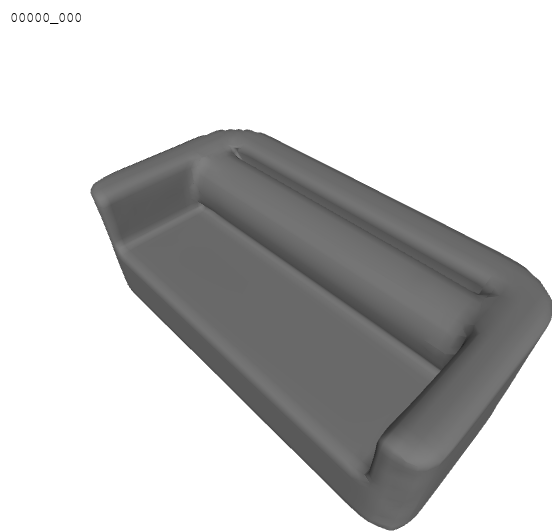

In [28]:
from exercise_3.util.mesh_collection_to_gif import  meshes_to_gif
from exercise_3.util.misc import show_gif

# create list of meshes (just exported) to be visualized
mesh_paths = sorted([x for x in Path("exercise_3/runs/3_2_deepsdf_generalization/interpolation").iterdir() if int(x.name.split('.')[0].split("_")[1]) == 0], key=lambda x: int(x.name.split('.')[0].split("_")[0]))
mesh_paths = mesh_paths + mesh_paths[::-1]

# create a visualization of the interpolation process
meshes_to_gif(mesh_paths, "exercise_3/runs/3_2_deepsdf_generalization/latent_interp.gif", 20)
show_gif("exercise_3/runs/3_2_deepsdf_generalization/latent_interp.gif")

## Submission

This is the end of exercise 3 🙂. Please create a zip containing all files we provided, everything you modified, your visualization images/gif (no need to submit generated OBJs), including your checkpoints. Name it with your matriculation number(s) as described in exercise 1. Make sure this notebook can be run without problems. Then, submit via Moodle.

**Note**: The maximum submission file size limit for Moodle is 100M. You do not need to submit your overfitting checkpoints; however, the generalization checkpoint will be >200M. The easiest way to still be able to submit that one is to split it with zip like this: `zip -s 100M model_best.ckpt.zip model_best.ckpt` which creates a `.zip` and a `.z01`. You can then submit both files alongside another zip containing all your code and outputs.

**Submission Deadline**: 09.06.2021, 23:55

## References

[1] Dai, Angela, Charles Ruizhongtai Qi, and Matthias Nießner. "Shape completion using 3d-encoder-predictor cnns and shape synthesis." Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition. 2017.

[2] Park, Jeong Joon, et al. "Deepsdf: Learning continuous signed distance functions for shape representation." Proceedings of the IEEE/CVF Conference on Computer Vision and Pattern Recognition. 2019.